In [10]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
from IPython.display import display




In [19]:

# Carica i dataset
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/FIFA22_official_data.csv')
campionati_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/squadrecampionato.csv')

# Converti in dizionario
campionati_dict = dict(zip(campionati_df['Squadra'], campionati_df['Campionato']))

# Definizione della funzione
def trova_campionato(squadra, campionati_dict):
    if not isinstance(squadra, str) or pd.isna(squadra):
        return "Non disponibile"

    if squadra in campionati_dict:
        return campionati_dict[squadra]

    squadra_norm = squadra.lower().strip()

    for team, league in campionati_dict.items():
        if team.lower().strip() == squadra_norm:
            return league

    possibili_corrispondenze = [
        team for team in campionati_dict.keys()
        if squadra_norm in team.lower() or team.lower() in squadra_norm
    ]

    if len(possibili_corrispondenze) == 1:
        return campionati_dict[possibili_corrispondenze[0]]

    return "Non disponibile"

# Applica la funzione
df['Campionato'] = df['Club'].apply(lambda x: trova_campionato(x, campionati_dict))

# Salva il risultato
df.to_csv('/content/drive/MyDrive/Colab Notebooks/FIFA22_con_campionati.csv', index=False)

print("Elaborazione completata.")

Elaborazione completata.


In [20]:
# Caricare il dataset
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/FIFA22_con_campionati.csv')  # Assicurati che il file sia nella directory corretta

In [21]:
df = df.drop(columns=list(df.columns[[0, 3, 5, 6, 7, 9, 12, 13, 15, 16, 17, 19, 20, 22, 23, 24]] )
                     + list(df.columns[27:61])
                     + list(df.columns[[62, 64]]))
display(df)

,Name,Age,Nationality,Club,Value,Wage,International Reputation,Body Type,Jersey Number,Height,Weight,Best Position,Release Clause,Campionato
0,Bruno Fernandes,26,Portugal,Manchester United,€107.5M,€250K,3.0,Unique,18.0,179cm,69kg,CAM,€206.9M,Premier League (Inghilterra)
1,L. Goretzka,26,Germany,FC Bayern München,€93M,€140K,4.0,Unique,8.0,189cm,82kg,CM,€160.4M,Bundesliga (Germania)
2,L. Suárez,34,Uruguay,Atlético de Madrid,€44.5M,€135K,5.0,Unique,9.0,182cm,83kg,ST,€91.2M,LaLiga (Spagna)
3,K. De Bruyne,30,Belgium,Manchester City,€125.5M,€350K,4.0,Unique,17.0,181cm,70kg,CM,€232.2M,Premier League (Inghilterra)
4,M. Acuña,29,Argentina,Sevilla FC,€37M,€45K,2.0,Stocky (170-185),19.0,172cm,69kg,LB,€77.7M,La Liga (Spagna)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16705,18 L. Clayton,17,England,Cheltenham Town,€100K,€1K,1.0,Normal (185+),31.0,188cm,80kg,GK,€238K,League Two (Inghilterra)
16706,�. Dobre,20,Romania,FC Academica Clinceni,€180K,€550,1.0,Normal (185+),1.0,194cm,86kg,GK,€279K,Liga I (Romania)
16707,21 Xue Qinghao,19,China PR,Shanghai Shenhua FC,€100K,€700,1.0,Lean (170-185),31.0,180cm,71kg,GK,€223K,Chinese Super League (Cina)
16708,A. Shaikh,18,India,ATK Mohun Bagan FC,€110K,€500,1.0,Normal (185+),31.0,186cm,74kg,GK,€259K,Indian Super League (India)


In [22]:

def convert_money(value):
    if pd.isna(value):  # Se il valore è NaN, lo lasciamo così
        return np.nan

    if isinstance(value, str):  # Controlliamo se è una stringa
        value = value.replace('€', '').replace(',', '').strip()  # Rimuove il simbolo € e le virgole

        try:
            if 'M' in value:
                return float(value.replace('M', '')) * 1_000_000  # Converte i milioni
            elif 'K' in value:
                return float(value.replace('K', '')) * 1_000  # Converte i migliaia
            else:
                return float(value)  # Se non ci sono suffissi, converte normalmente
        except ValueError:  # Se non può essere convertito, restituiamo NaN
            return np.nan

    return np.nan  # Se il valore non è una stringa, restituiamo NaN

# Applichiamo la funzione alle colonne
columns_to_convert = ['Value', 'Wage', 'Release Clause']
df[columns_to_convert] = df[columns_to_convert].applymap(convert_money)


<ipython-input-22-2555a036dad6>:22: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df[columns_to_convert] = df[columns_to_convert].applymap(convert_money)


In [23]:
df = df.dropna()  # Rimuovi i valori mancanti
df['Body Type'] = df['Body Type'].astype(str).apply(lambda x: x.split('(')[0].strip()) #Sistema colonna Body Type

# Rimuove "cm" da Height e converte in interi
df['Height'] = df['Height'].str.replace('cm', '').str.strip().astype(int)

# Rimuove "kg" da Weight e converte in interi
df['Weight'] = df['Weight'].str.replace('kg', '').str.strip().astype(int)

# Creiamo un dizionario per mappare le posizioni nei rispettivi gruppi. MODELLO CON SUDDIVISIONI PER RUOLO
position_mapping = {
    'GK': 'Portiere',
    'LB': 'Difensore', 'LWB': 'Difensore', 'CB': 'Difensore', 'RB': 'Difensore', 'RWB': 'Difensore',
    'CM': 'Centrocampista', 'CDM': 'Centrocampista', 'CAM': 'Centrocampista', 'LM': 'Centrocampista', 'RM': 'Centrocampista',
    'LW': 'Attaccante', 'RW': 'Attaccante', 'CF': 'Attaccante', 'ST': 'Attaccante'
}

# Creiamo la nuova colonna basata sulla mappatura
df['Position Group'] = df['Best Position'].map(position_mapping)

# Verifica se ci sono valori NaN nella colonna 'Position Group'
print(df[df['Position Group'].isna()])

display(df)

Empty DataFrame
Columns: [Name, Age, Nationality, Club, Value, Wage, International Reputation, Body Type, Jersey Number, Height, Weight, Best Position, Release Clause, Campionato, Position Group]
Index: []


<ipython-input-23-c95c52226aac>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Body Type'] = df['Body Type'].astype(str).apply(lambda x: x.split('(')[0].strip()) #Sistema colonna Body Type
<ipython-input-23-c95c52226aac>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Height'] = df['Height'].str.replace('cm', '').str.strip().astype(int)
<ipython-input-23-c95c52226aac>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_inde

,Name,Age,Nationality,Club,Value,Wage,International Reputation,Body Type,Jersey Number,Height,Weight,Best Position,Release Clause,Campionato,Position Group
0,Bruno Fernandes,26,Portugal,Manchester United,107500000.0,250000.0,3.0,Unique,18.0,179,69,CAM,206900000.0,Premier League (Inghilterra),Centrocampista
1,L. Goretzka,26,Germany,FC Bayern München,93000000.0,140000.0,4.0,Unique,8.0,189,82,CM,160400000.0,Bundesliga (Germania),Centrocampista
2,L. Suárez,34,Uruguay,Atlético de Madrid,44500000.0,135000.0,5.0,Unique,9.0,182,83,ST,91200000.0,LaLiga (Spagna),Attaccante
3,K. De Bruyne,30,Belgium,Manchester City,125500000.0,350000.0,4.0,Unique,17.0,181,70,CM,232200000.0,Premier League (Inghilterra),Centrocampista
4,M. Acuña,29,Argentina,Sevilla FC,37000000.0,45000.0,2.0,Stocky,19.0,172,69,LB,77700000.0,La Liga (Spagna),Difensore
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16704,B. Voll,20,Germany,F.C. Hansa Rostock,375000.0,950.0,1.0,Normal,30.0,195,85,GK,656000.0,Bundesliga 3 (Germania),Portiere
16705,18 L. Clayton,17,England,Cheltenham Town,100000.0,1000.0,1.0,Normal,31.0,188,80,GK,238000.0,League Two (Inghilterra),Portiere
16706,�. Dobre,20,Romania,FC Academica Clinceni,180000.0,550.0,1.0,Normal,1.0,194,86,GK,279000.0,Liga I (Romania),Portiere
16707,21 Xue Qinghao,19,China PR,Shanghai Shenhua FC,100000.0,700.0,1.0,Lean,31.0,180,71,GK,223000.0,Chinese Super League (Cina),Portiere



📊 Campionato: Premier League (Inghilterra) | Ruolo: Portiere | Giocatori: 92


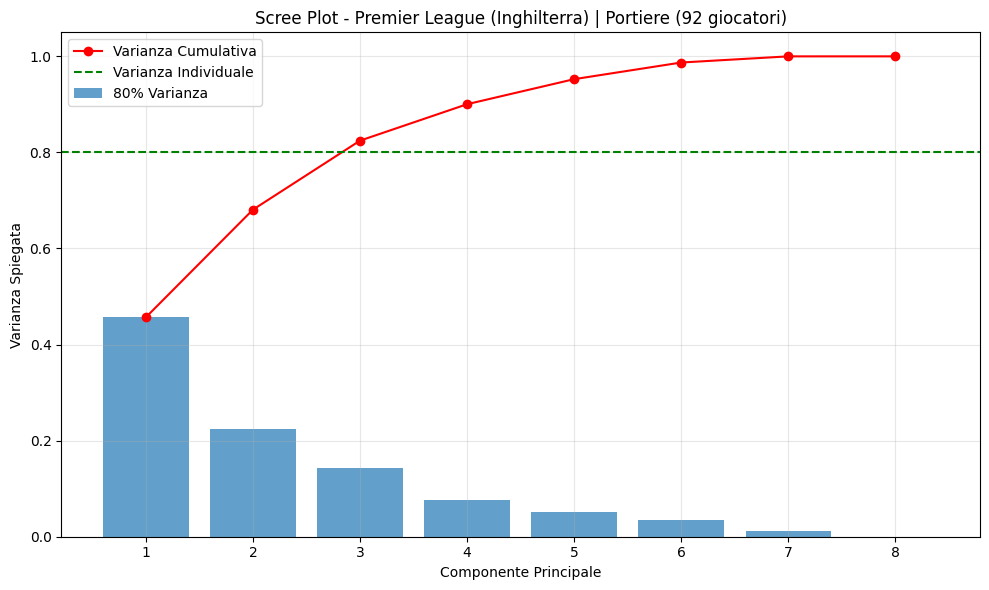

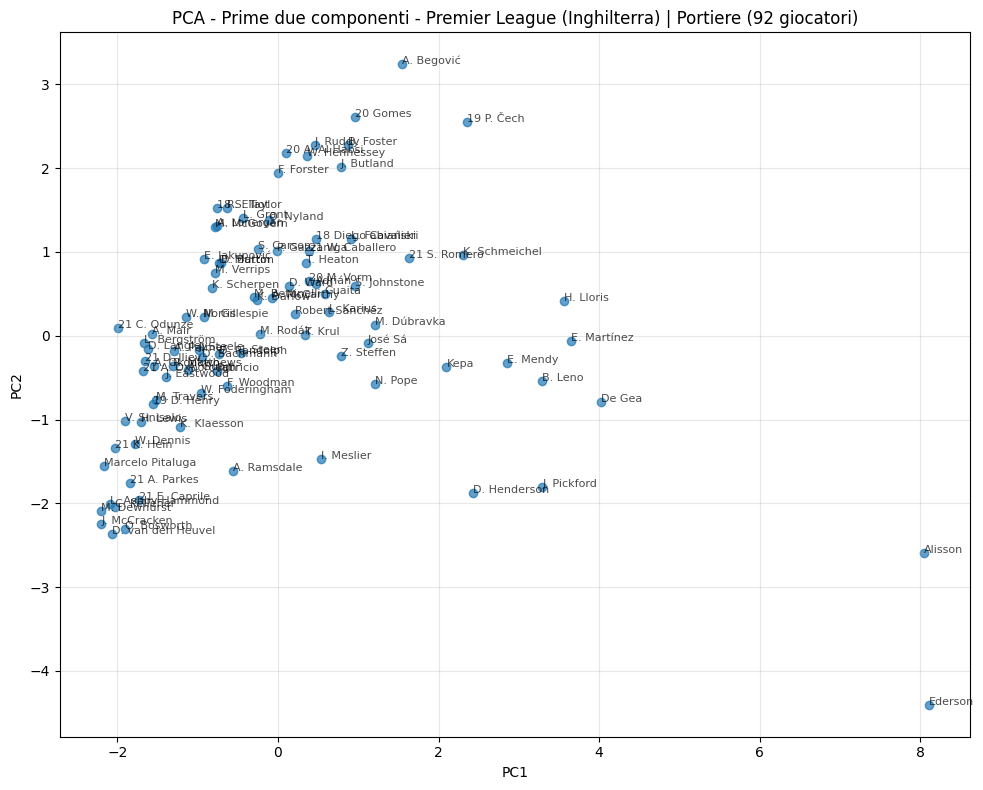

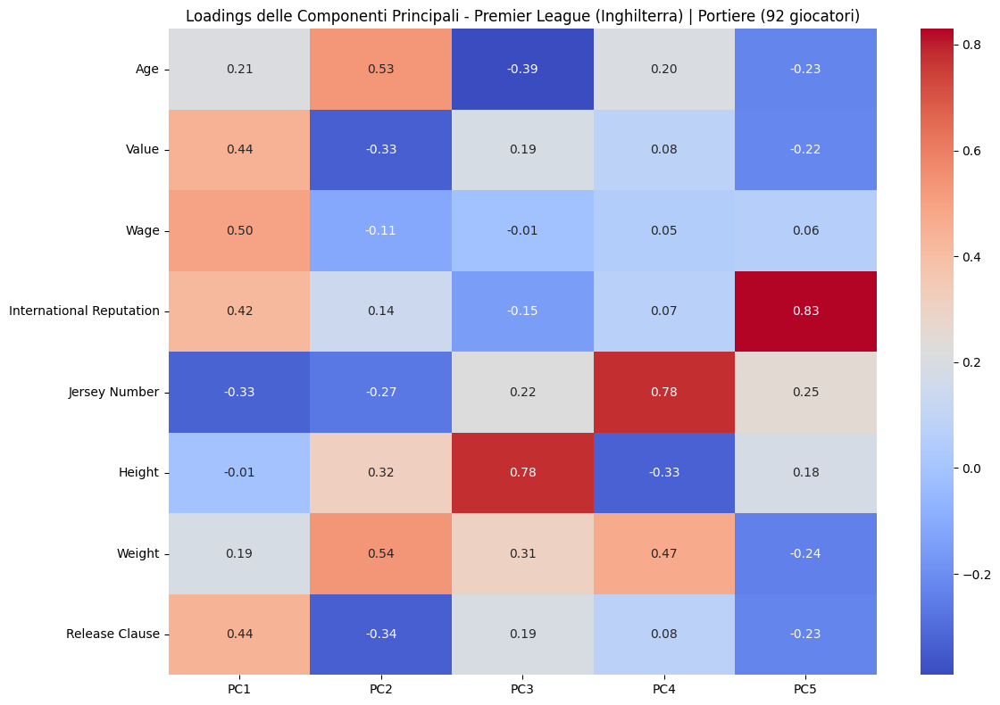


📊 Campionato: Premier League (Inghilterra) | Ruolo: Difensore | Giocatori: 290


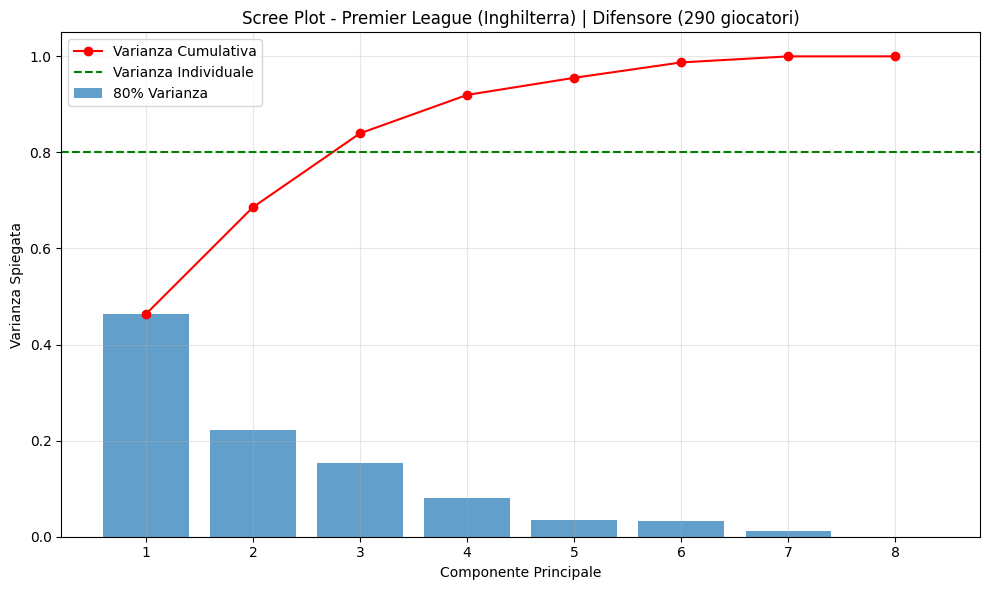

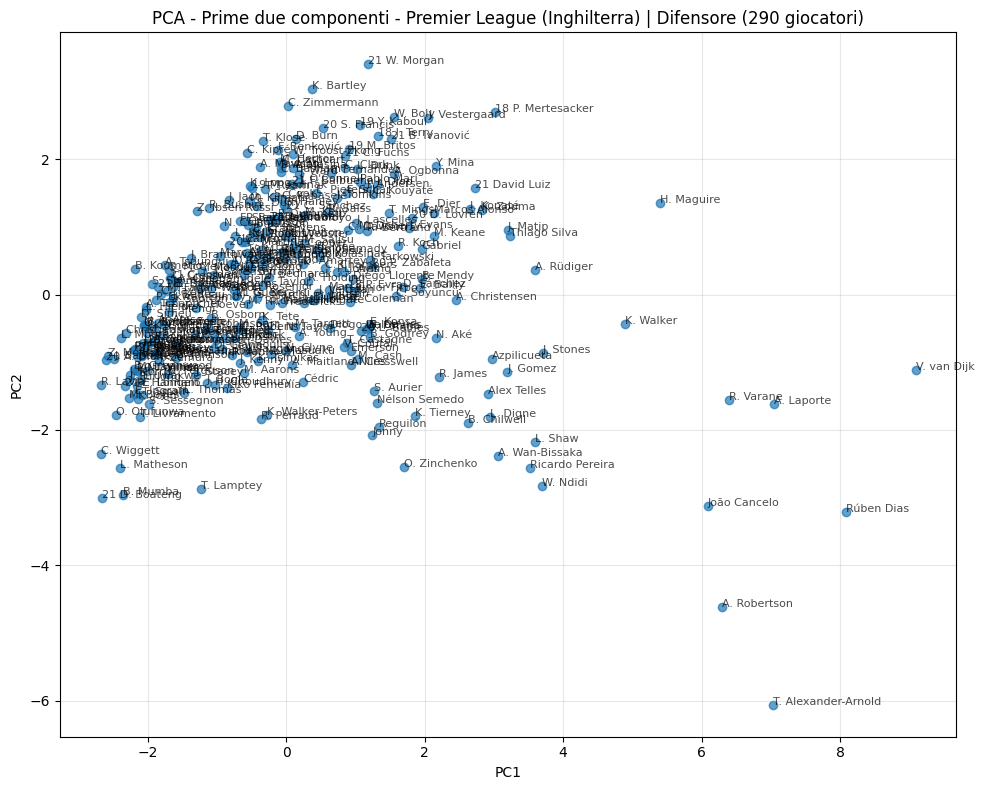

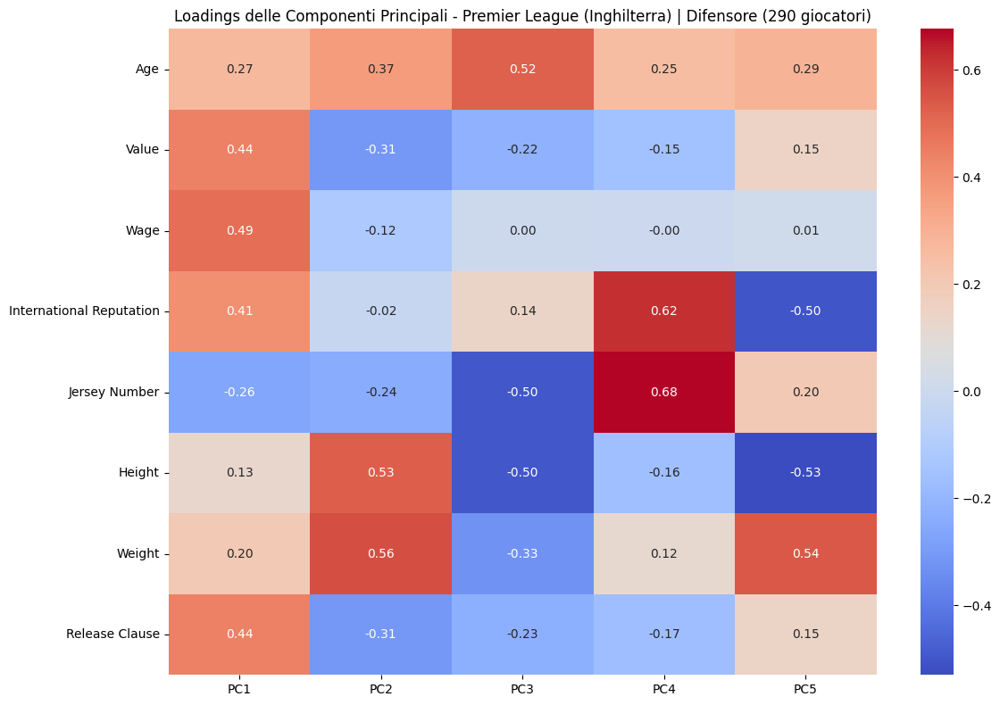


📊 Campionato: Premier League (Inghilterra) | Ruolo: Centrocampista | Giocatori: 301


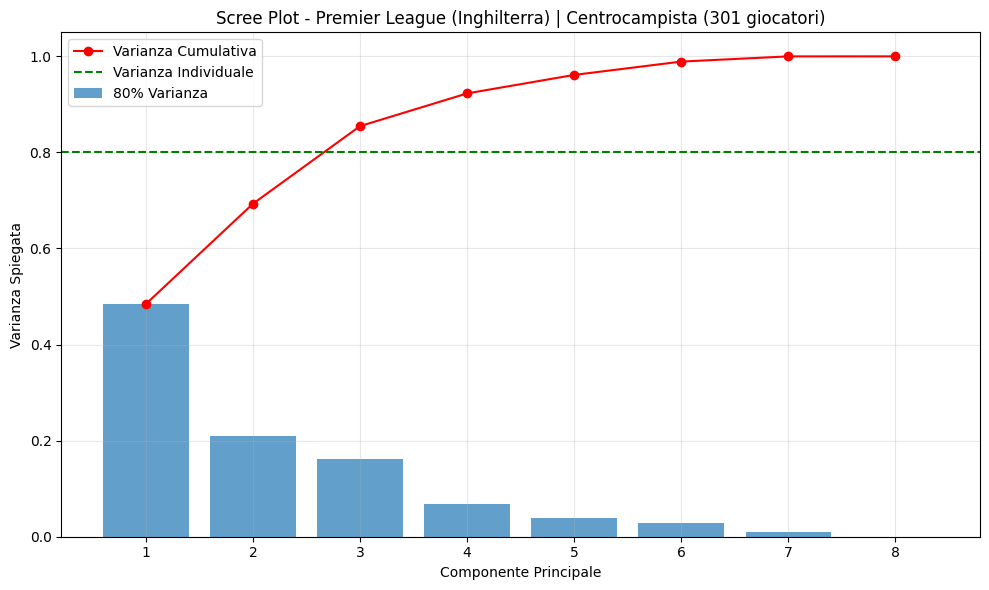

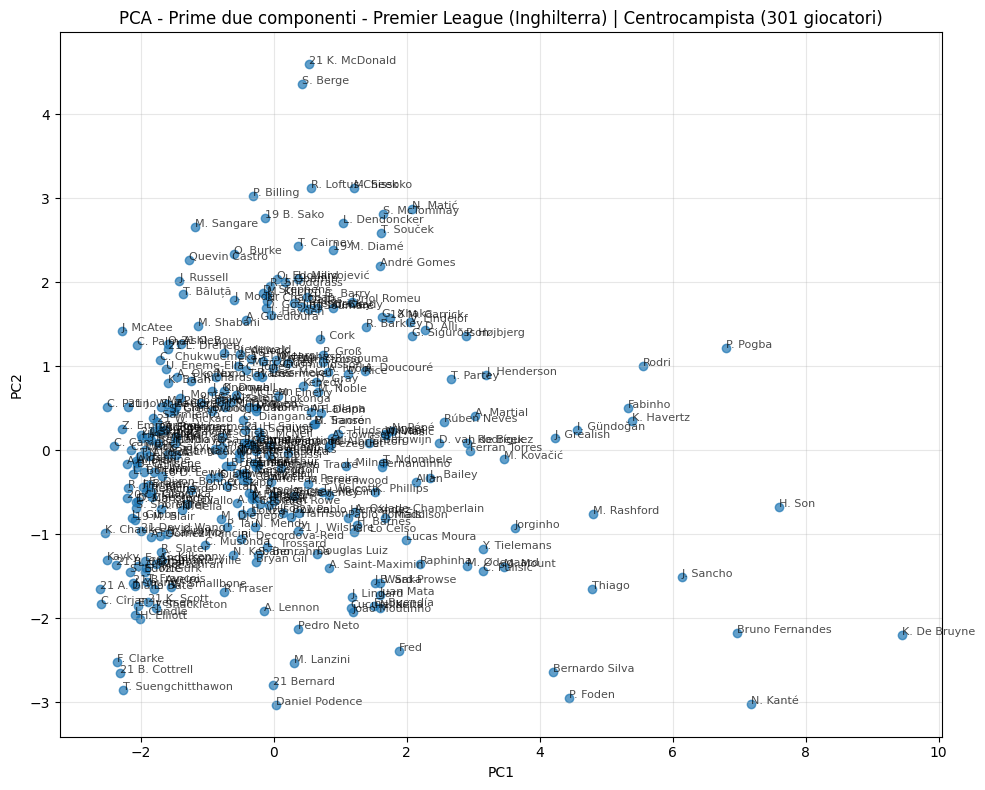

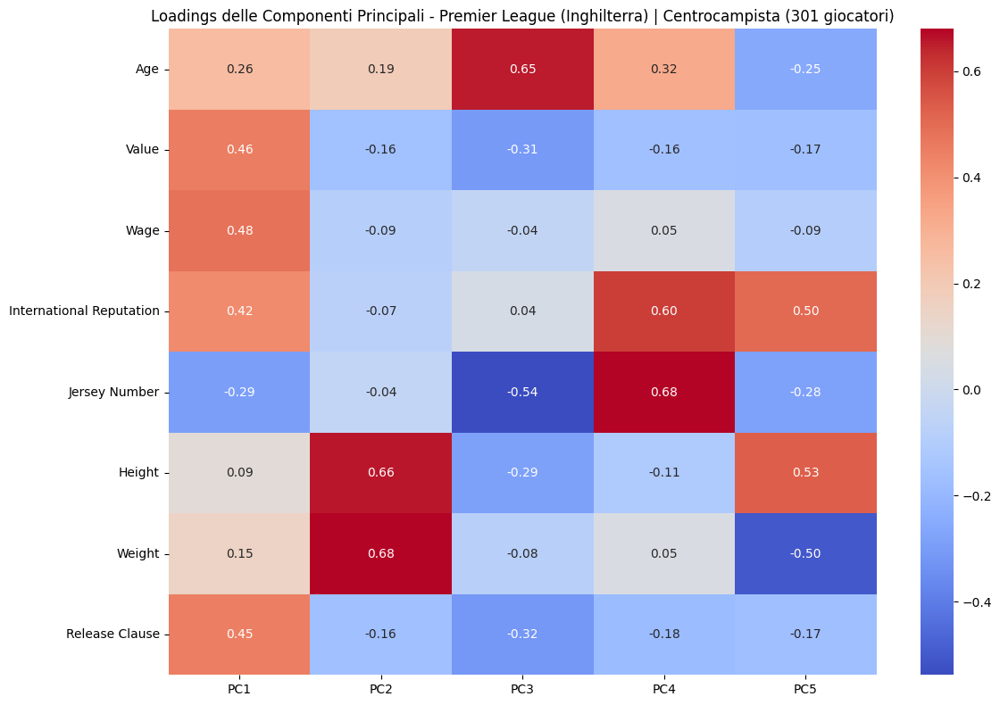


📊 Campionato: Premier League (Inghilterra) | Ruolo: Attaccante | Giocatori: 119


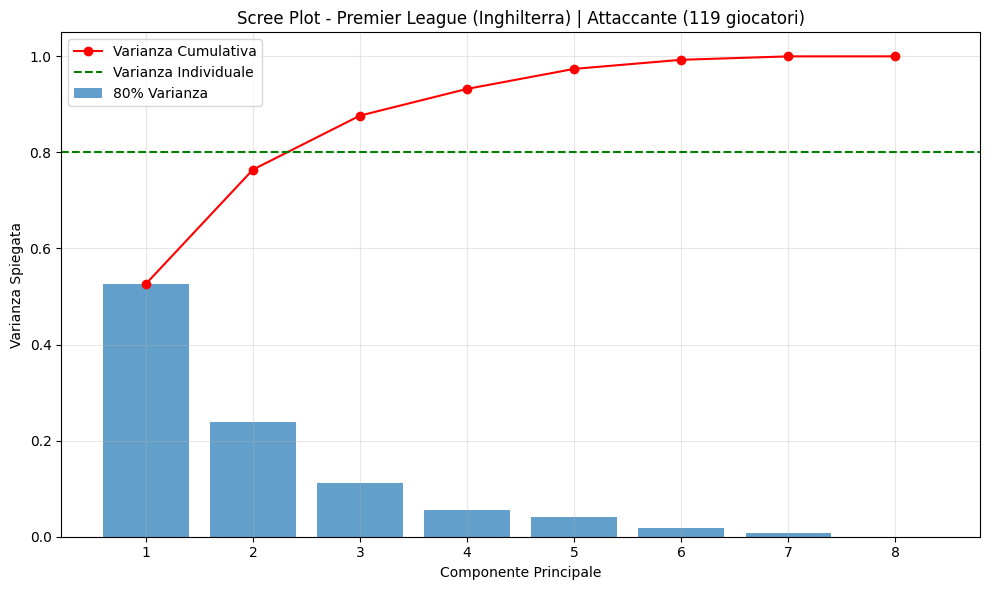

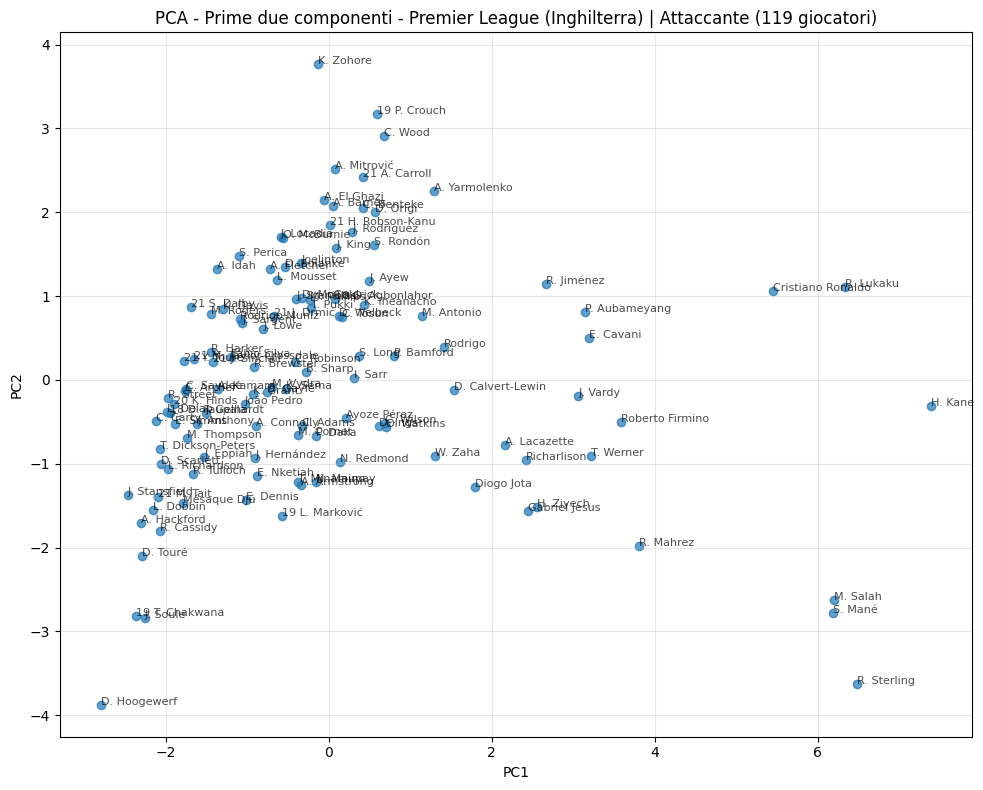

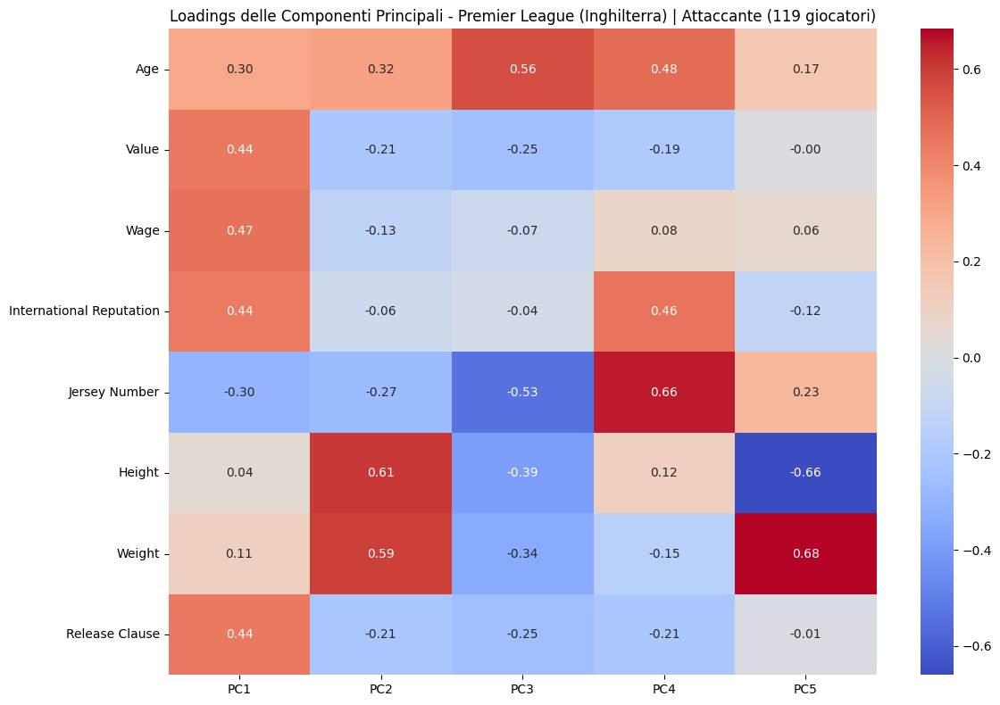


📊 Campionato: Bundesliga (Germania) | Ruolo: Portiere | Giocatori: 65


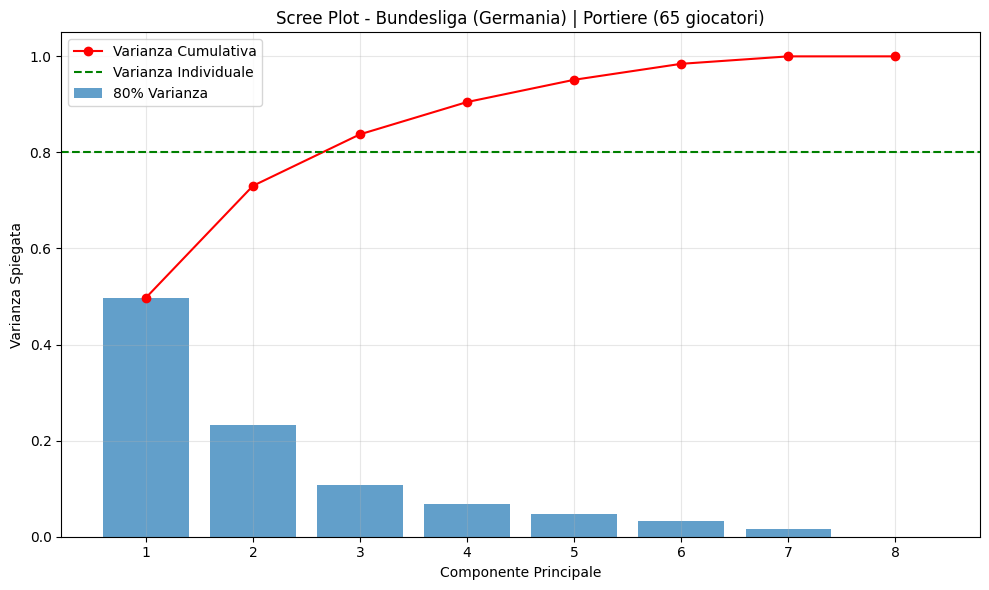

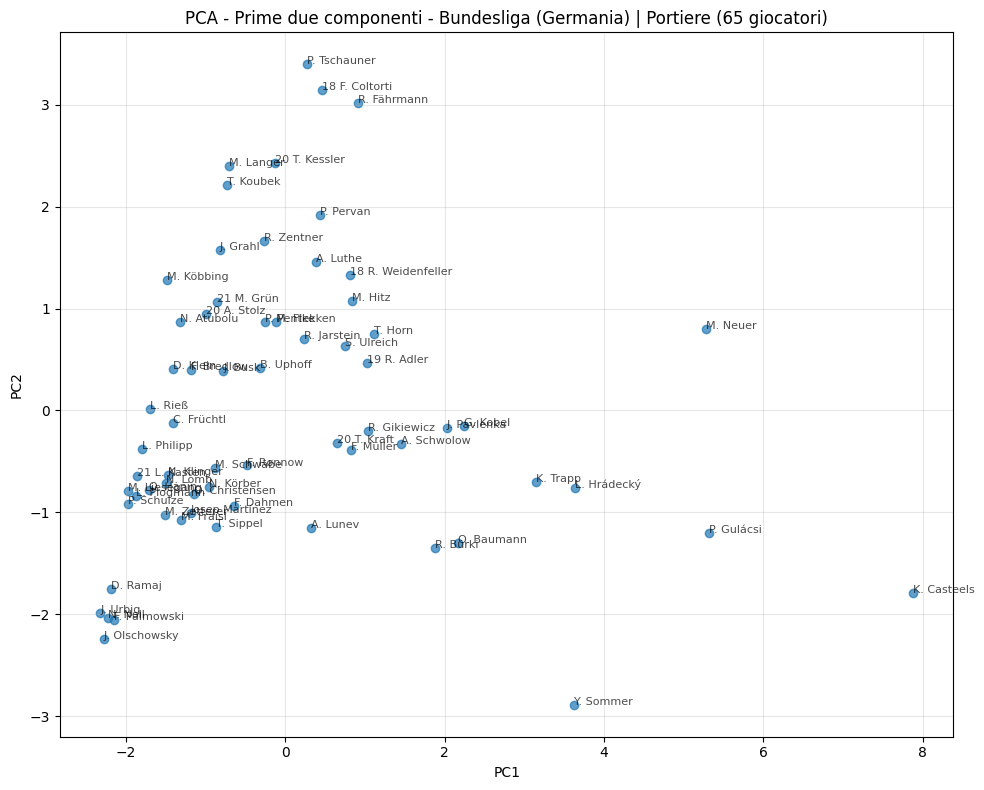

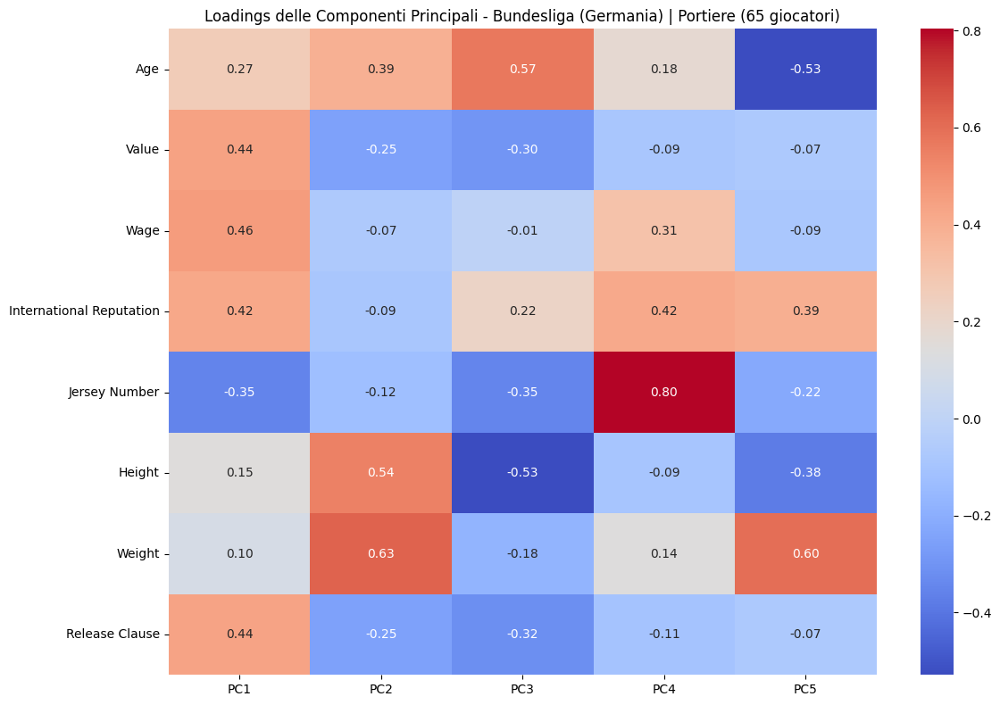


📊 Campionato: Bundesliga (Germania) | Ruolo: Difensore | Giocatori: 175


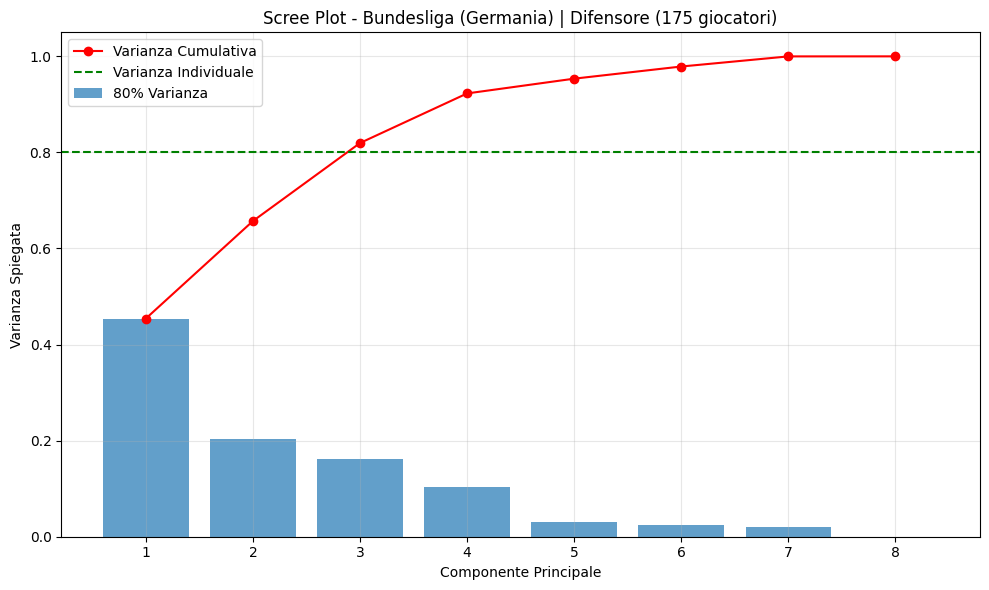

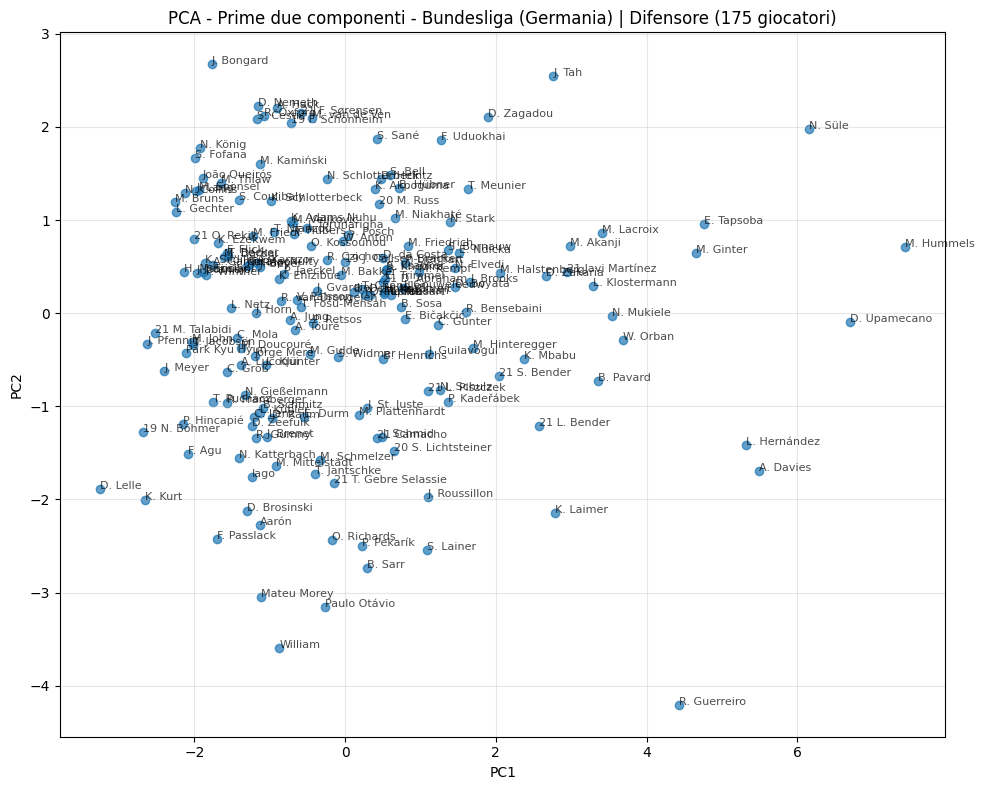

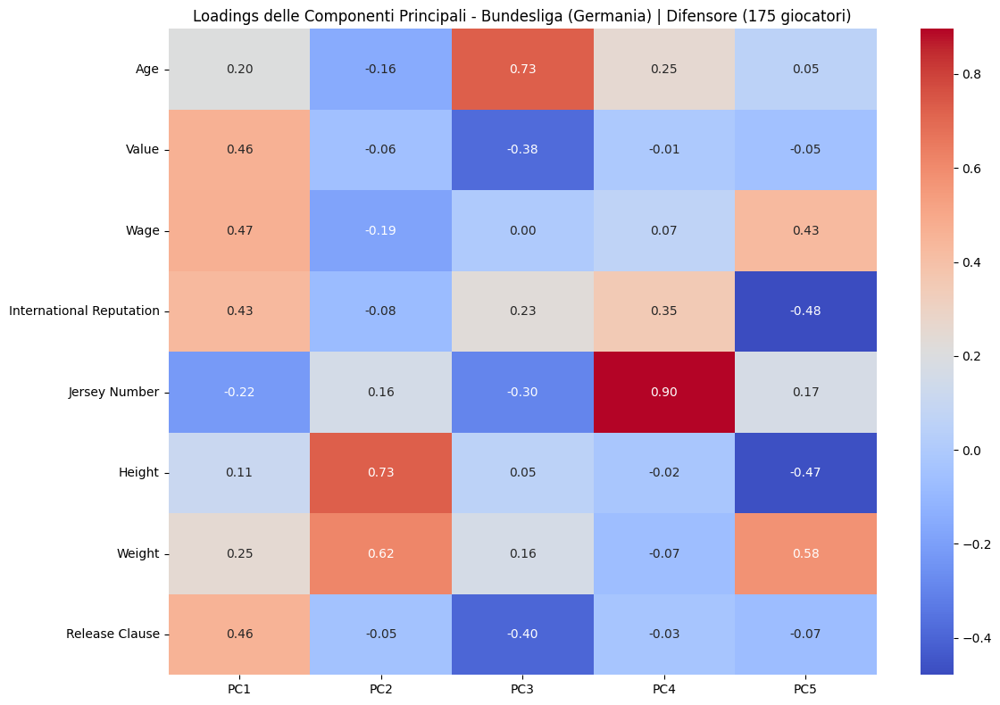


📊 Campionato: Bundesliga (Germania) | Ruolo: Centrocampista | Giocatori: 208


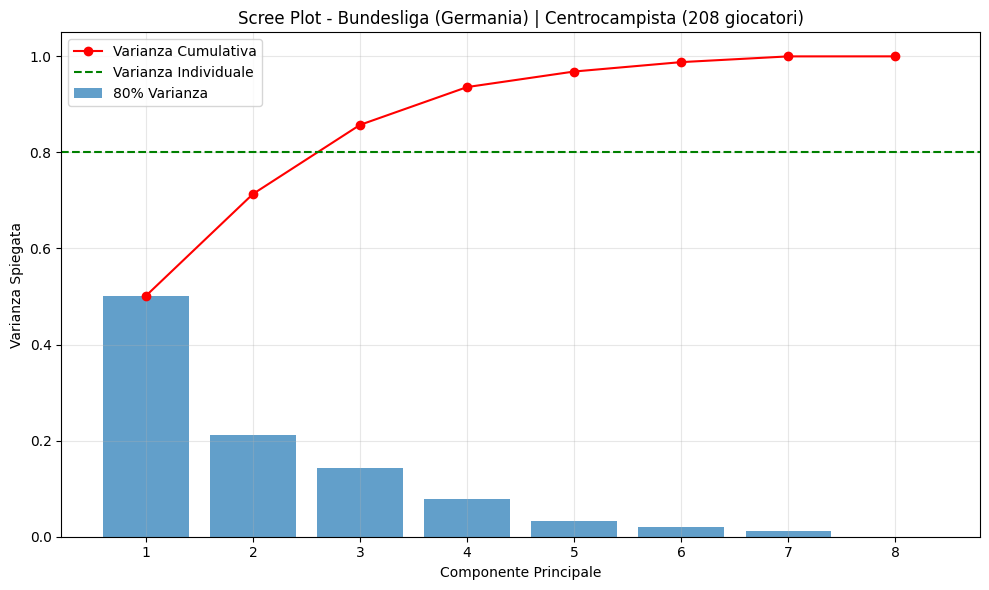

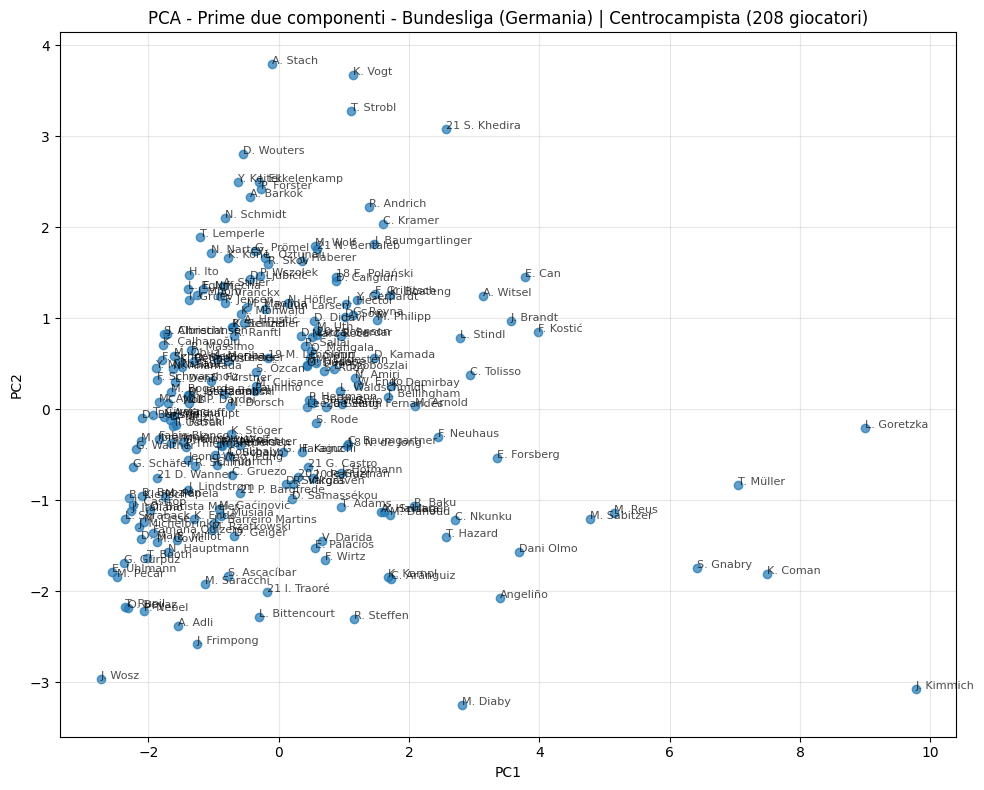

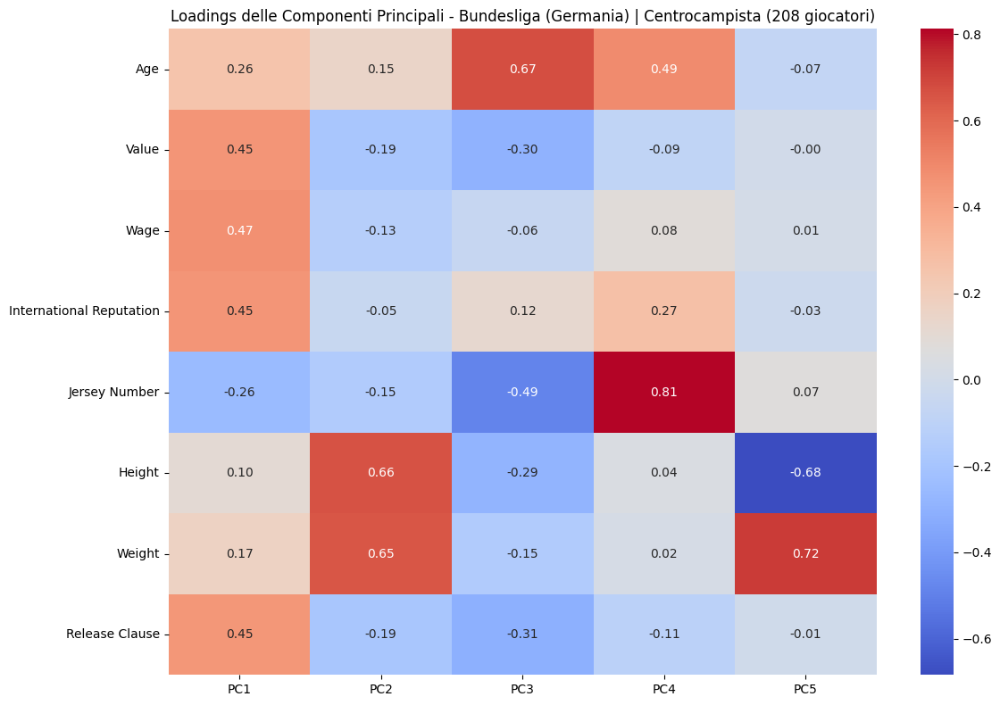


📊 Campionato: Bundesliga (Germania) | Ruolo: Attaccante | Giocatori: 90


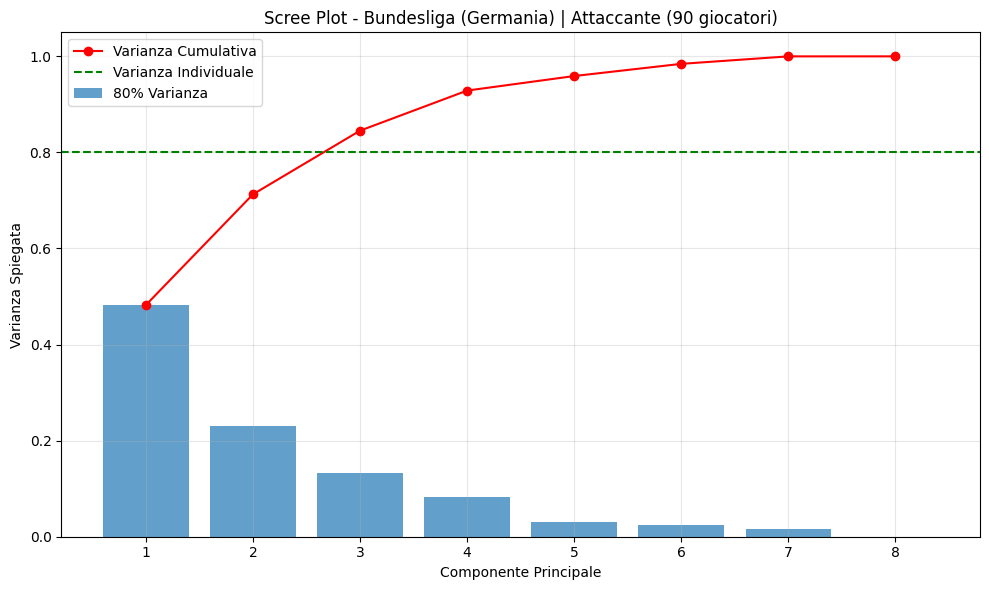

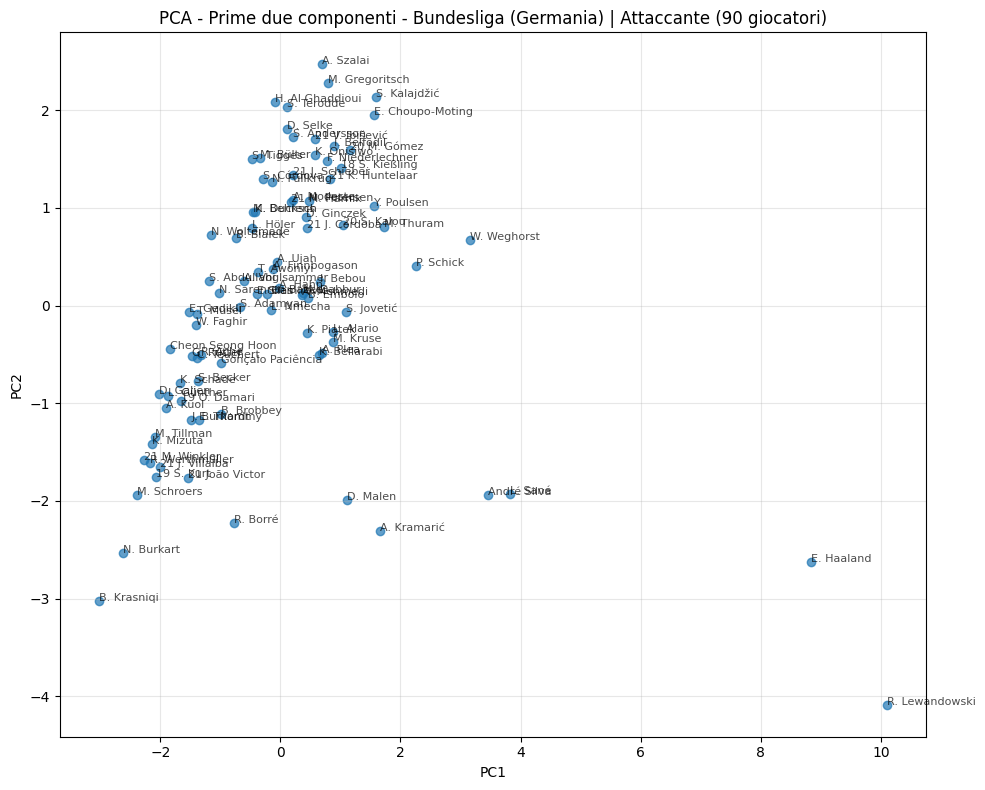

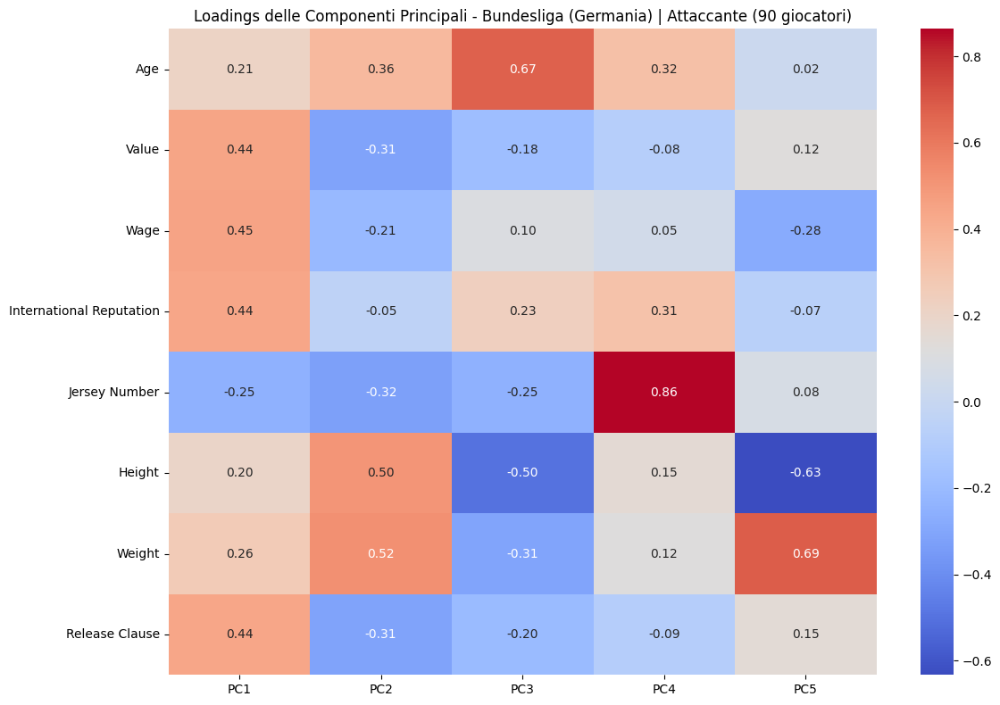


📊 Campionato: LaLiga (Spagna) | Ruolo: Portiere | Giocatori: 28


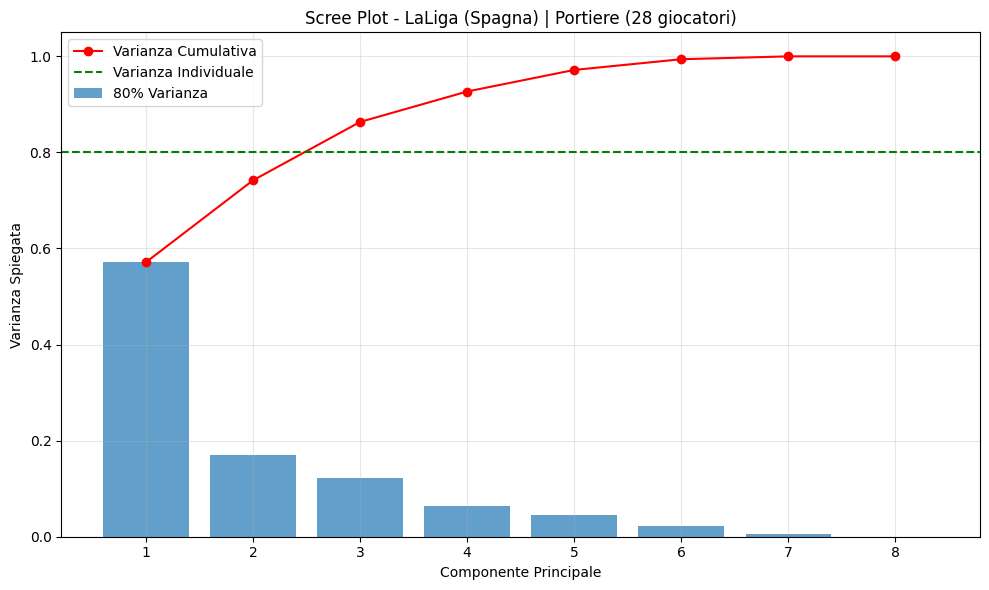

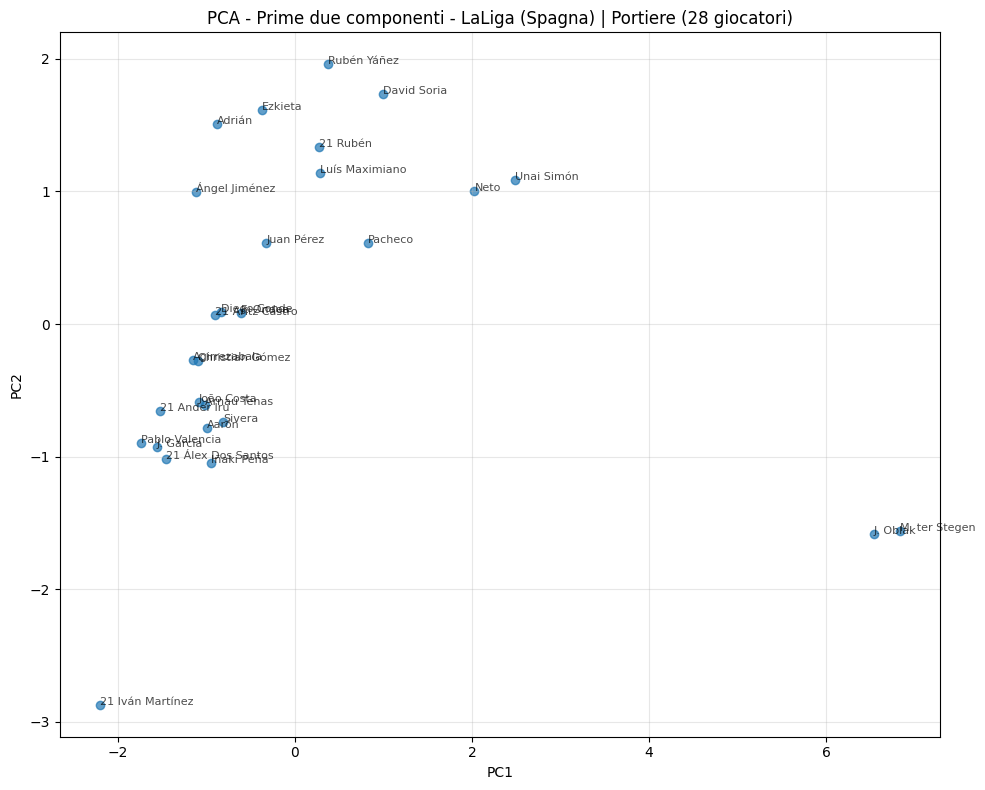

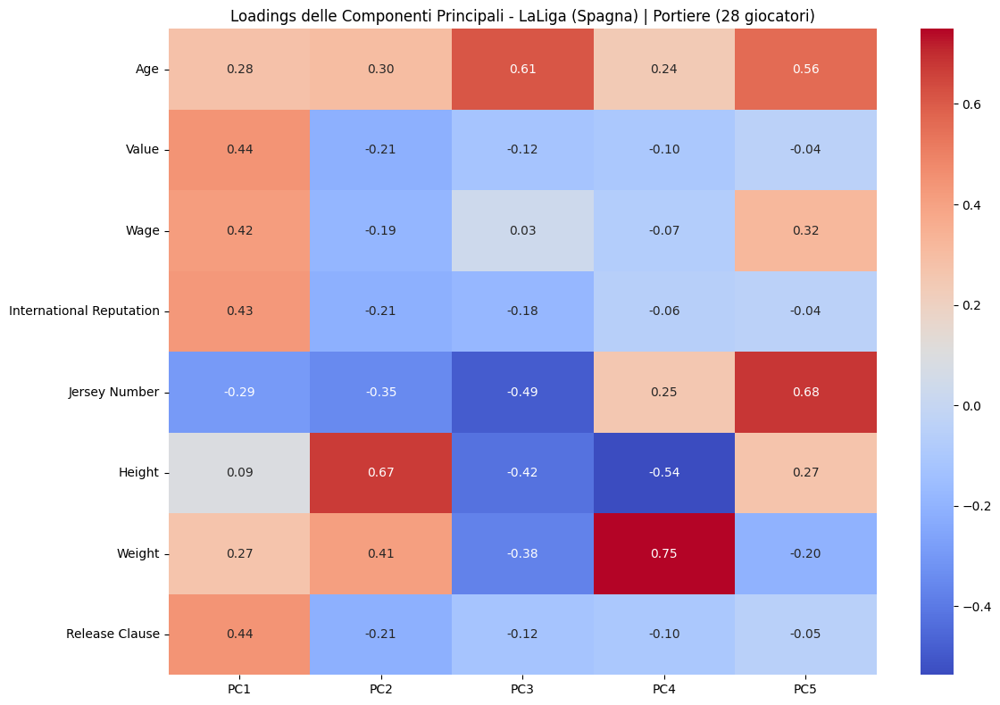


📊 Campionato: LaLiga (Spagna) | Ruolo: Difensore | Giocatori: 85


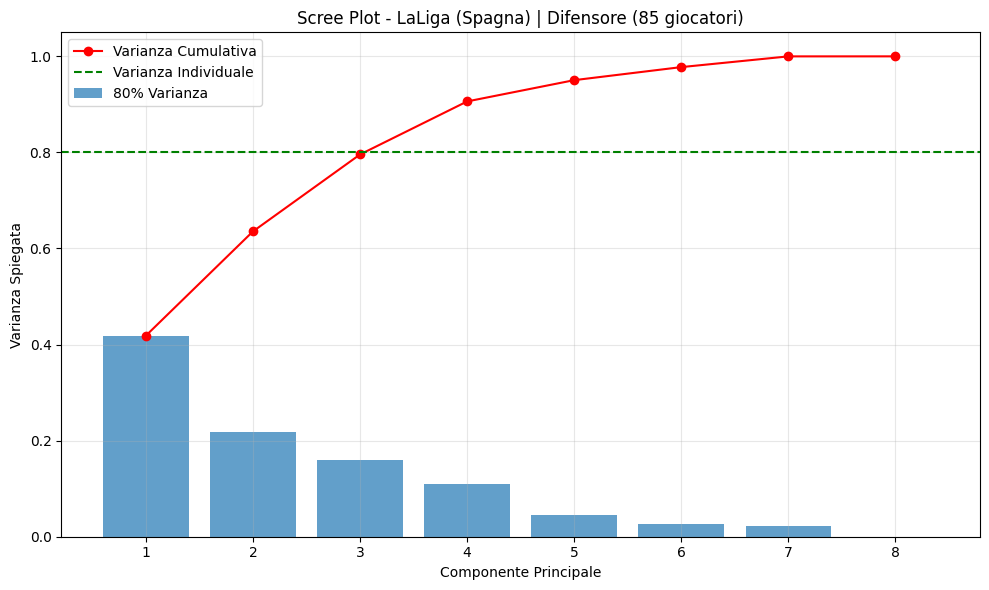

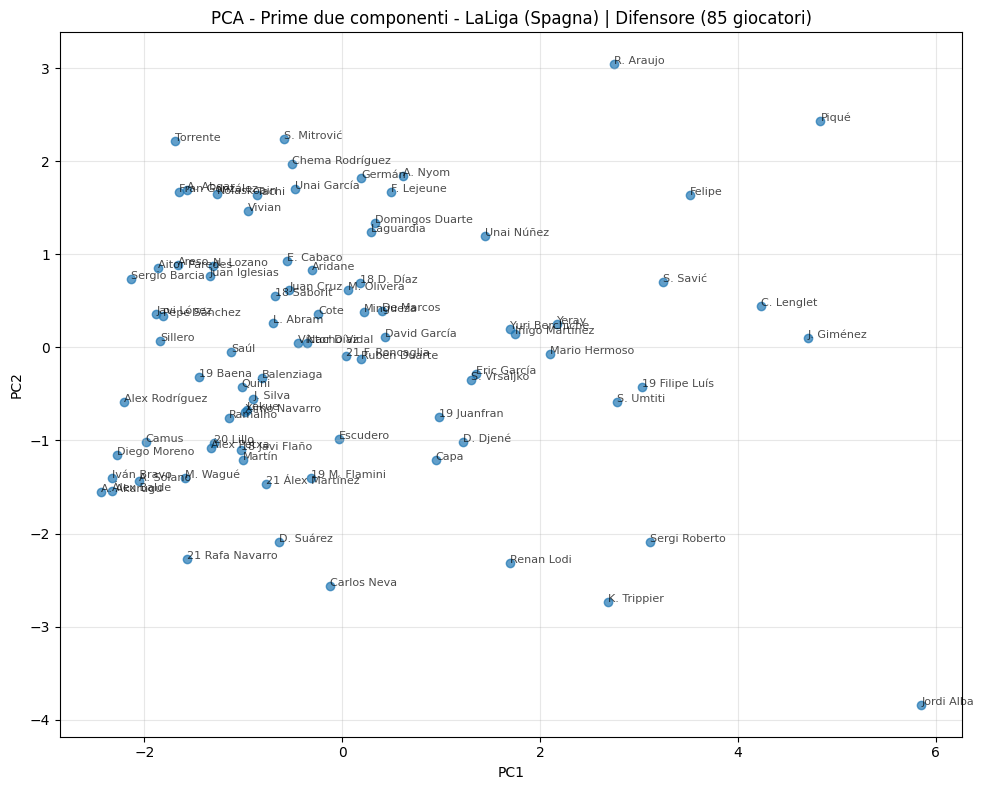

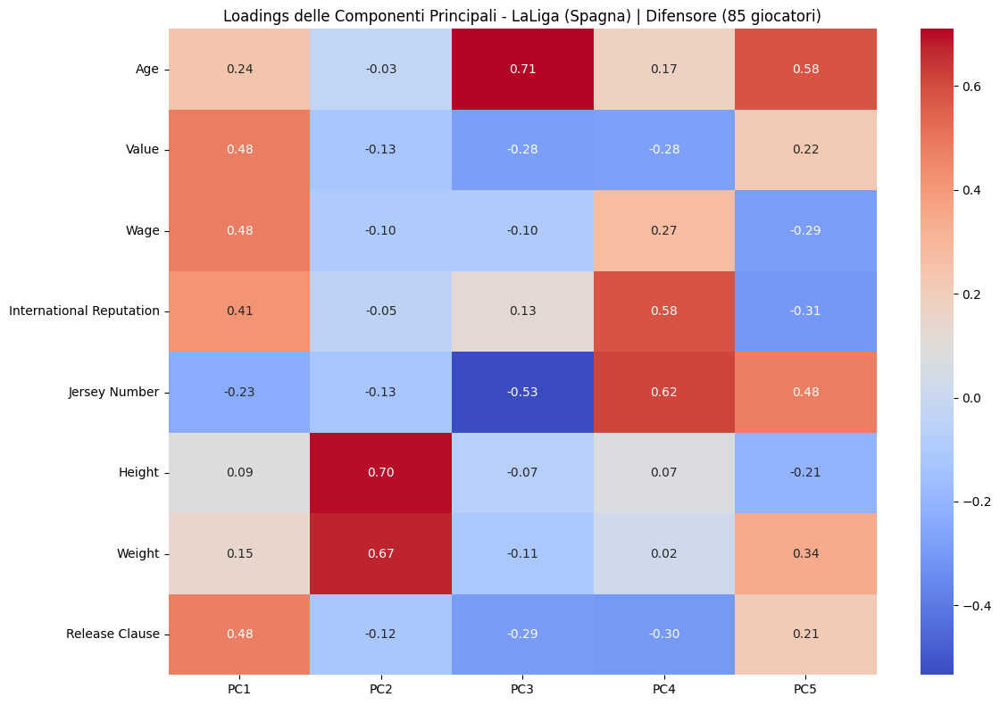


📊 Campionato: LaLiga (Spagna) | Ruolo: Centrocampista | Giocatori: 88


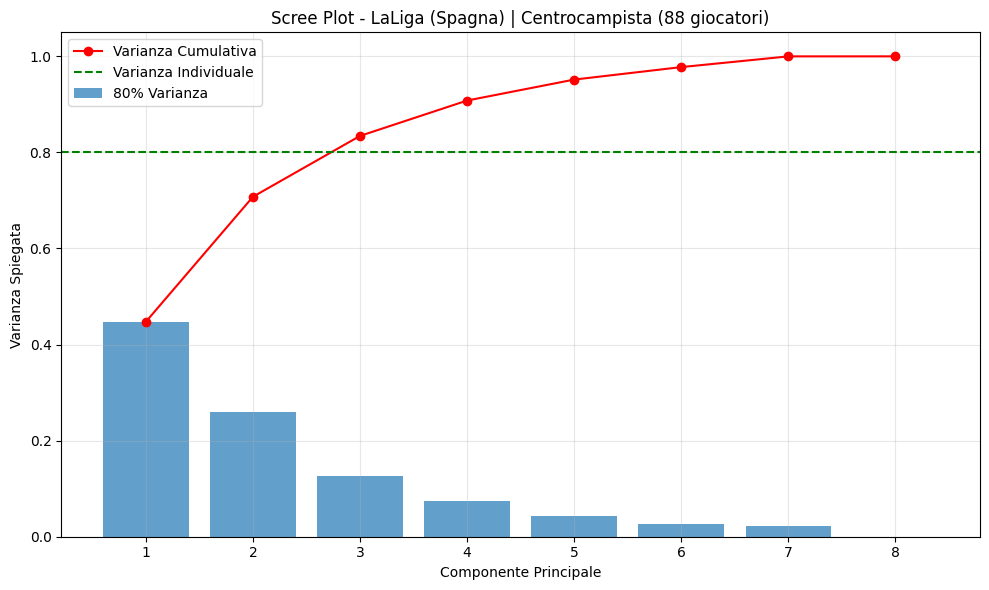

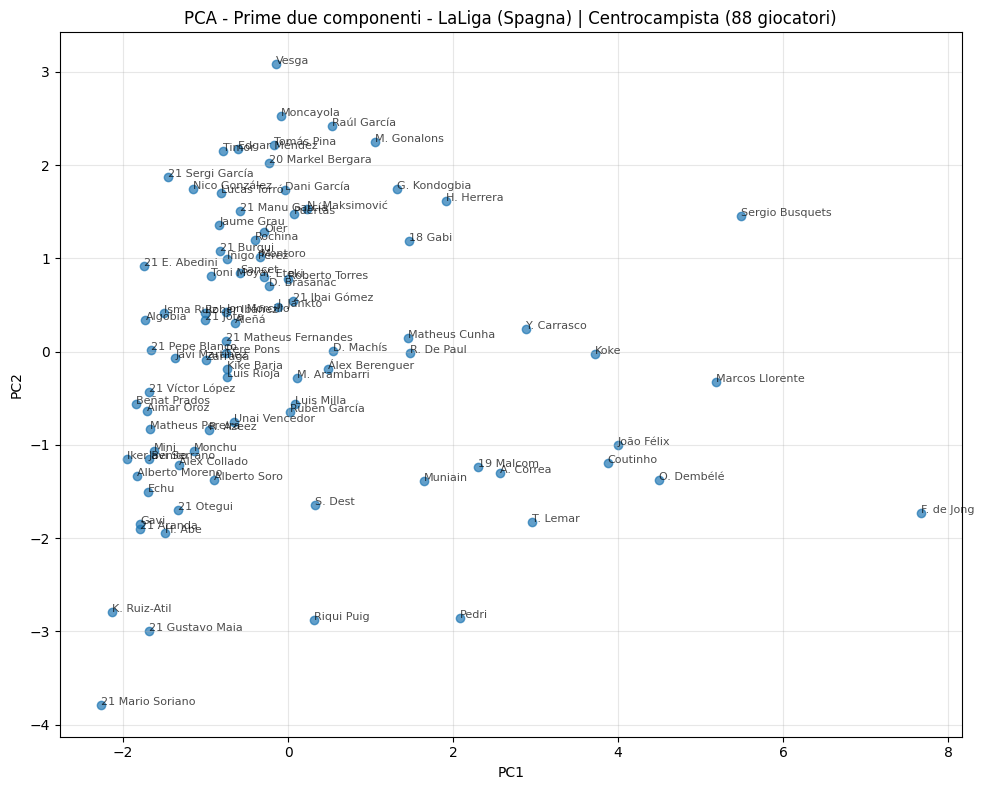

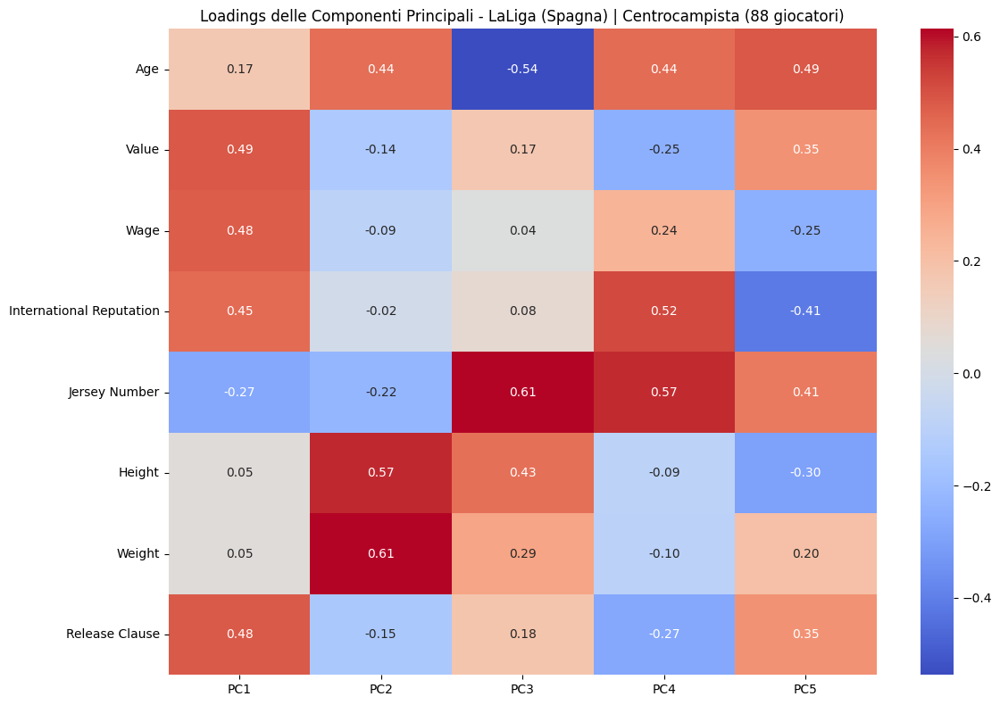


📊 Campionato: LaLiga (Spagna) | Ruolo: Attaccante | Giocatori: 37


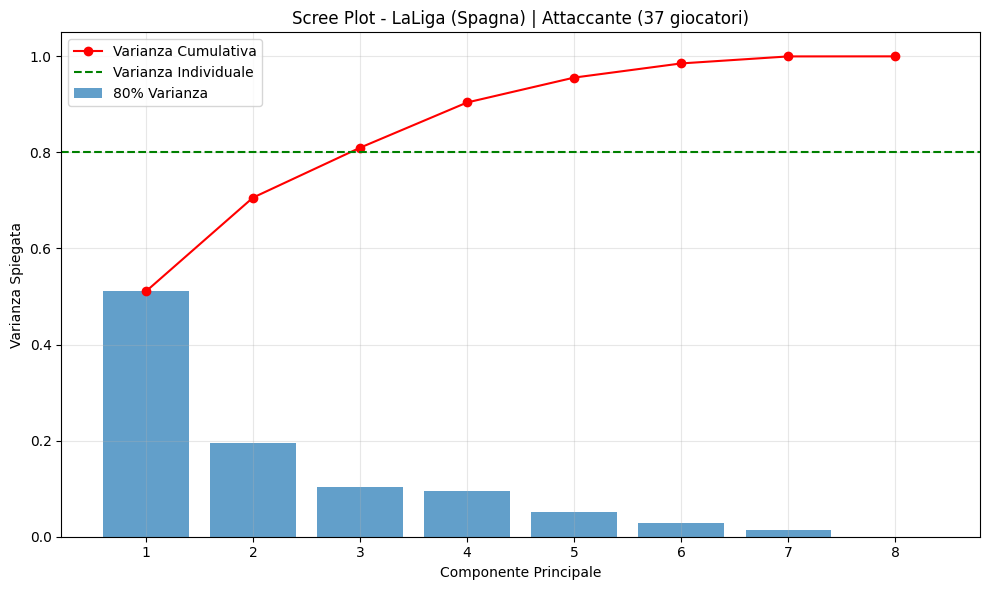

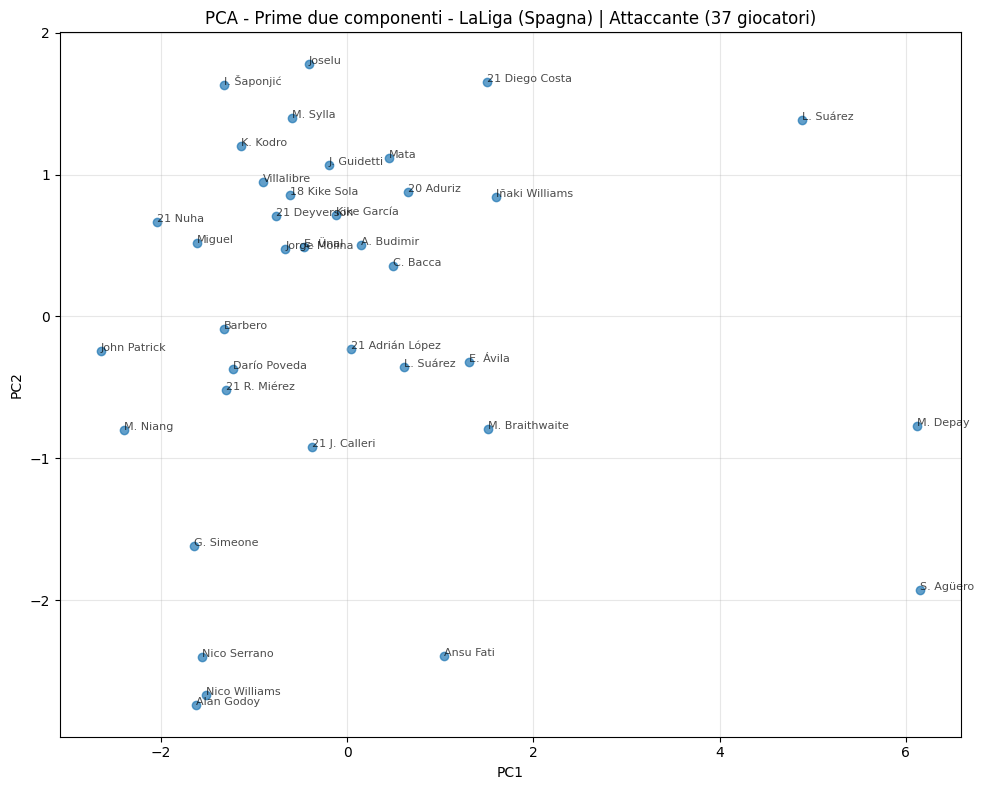

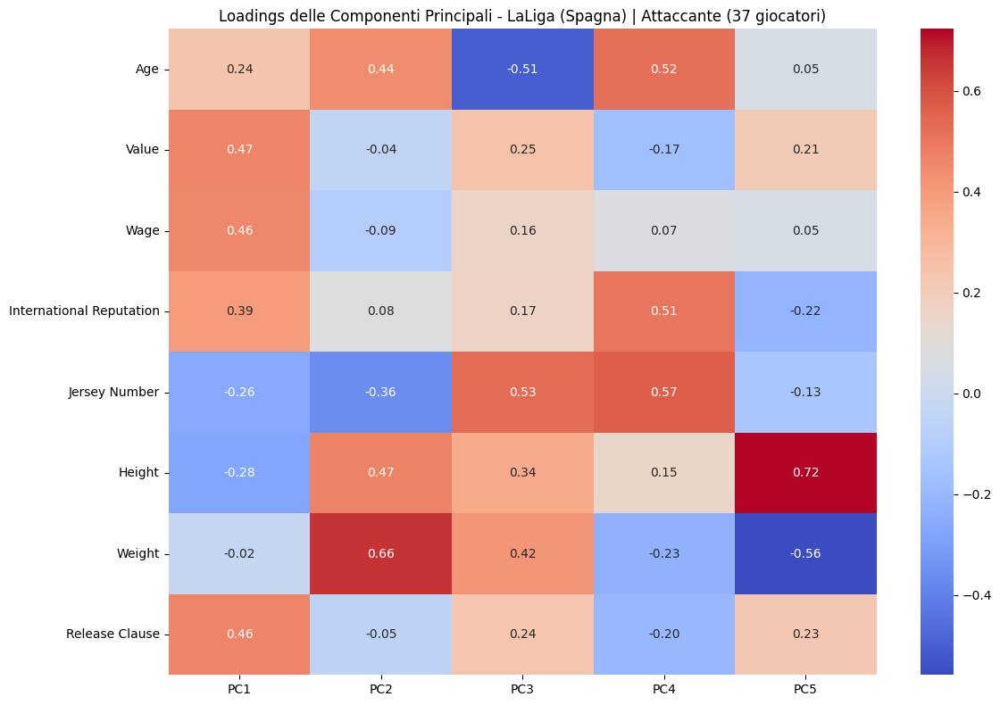


📊 Campionato: Ligue 1 (Francia) | Ruolo: Portiere | Giocatori: 69


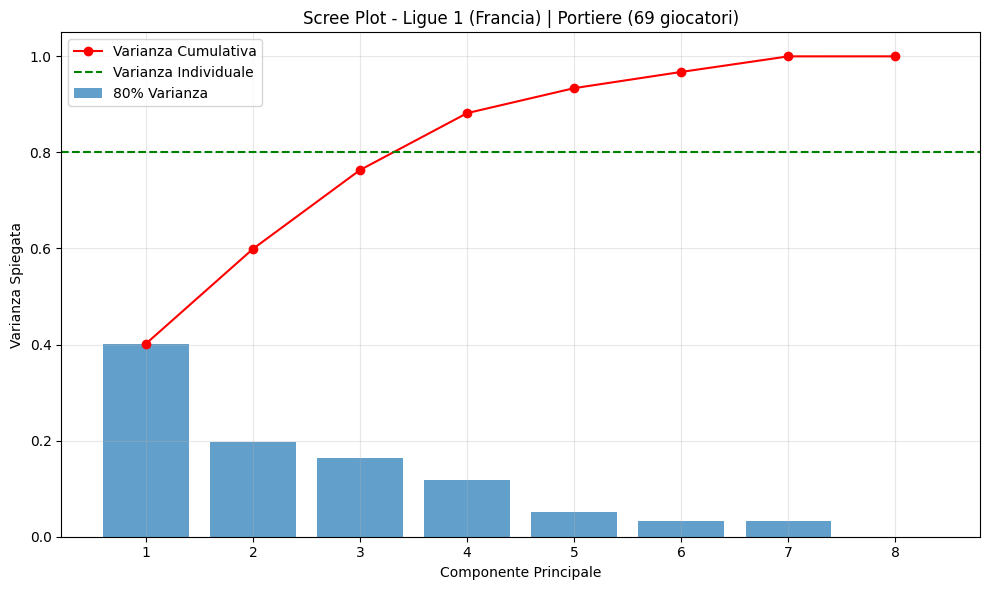

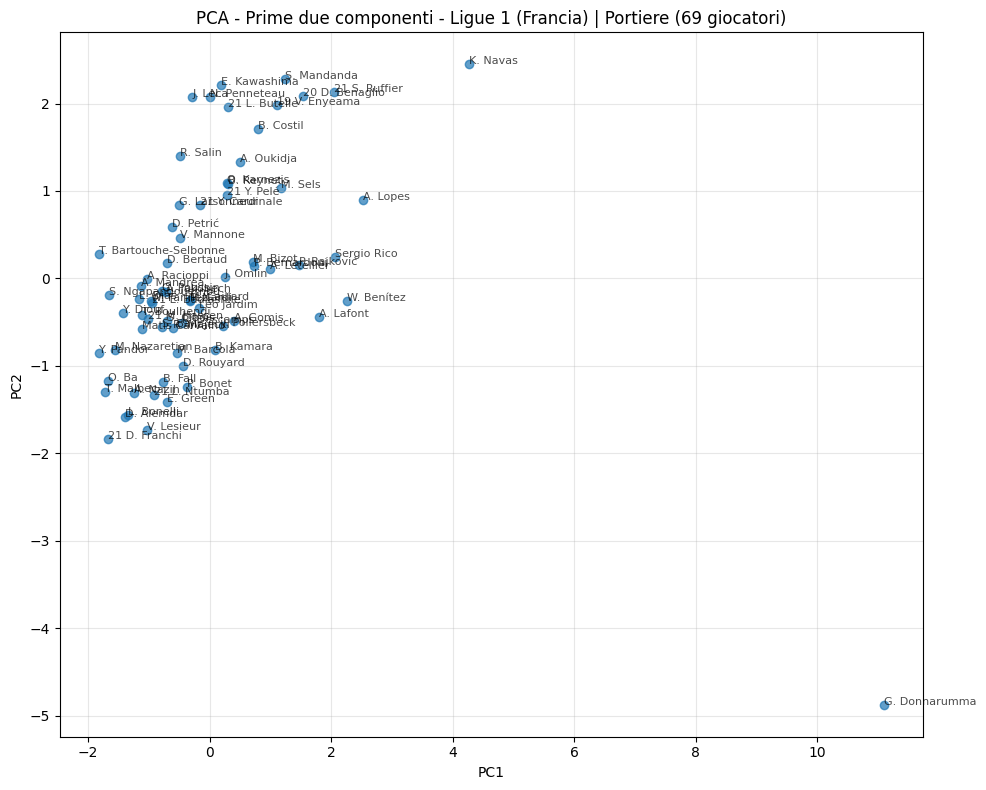

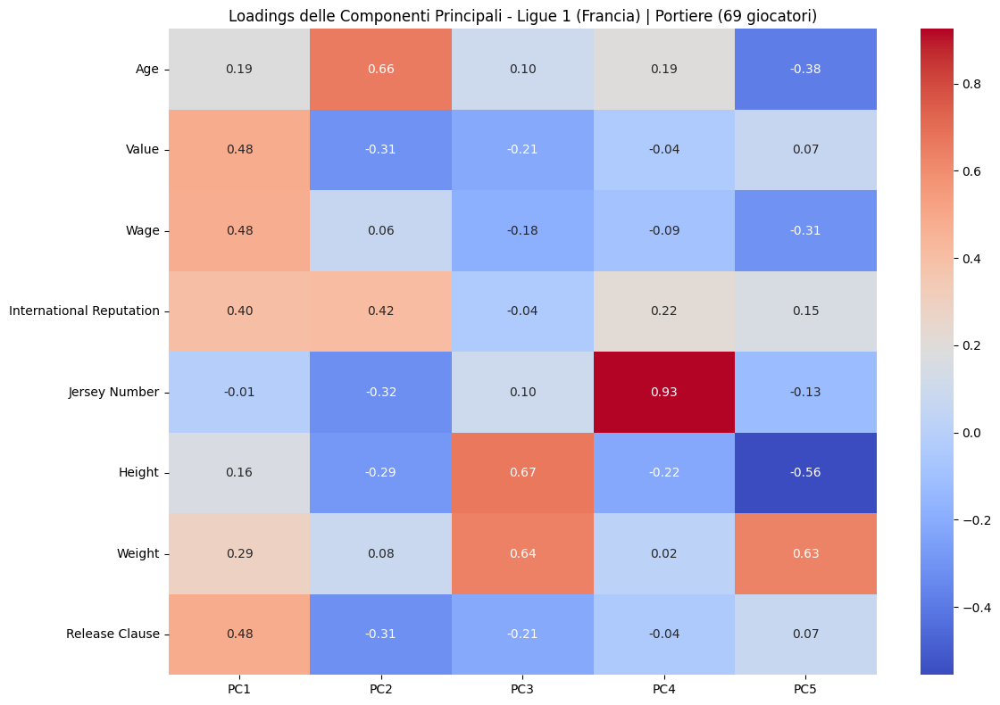


📊 Campionato: Ligue 1 (Francia) | Ruolo: Difensore | Giocatori: 208


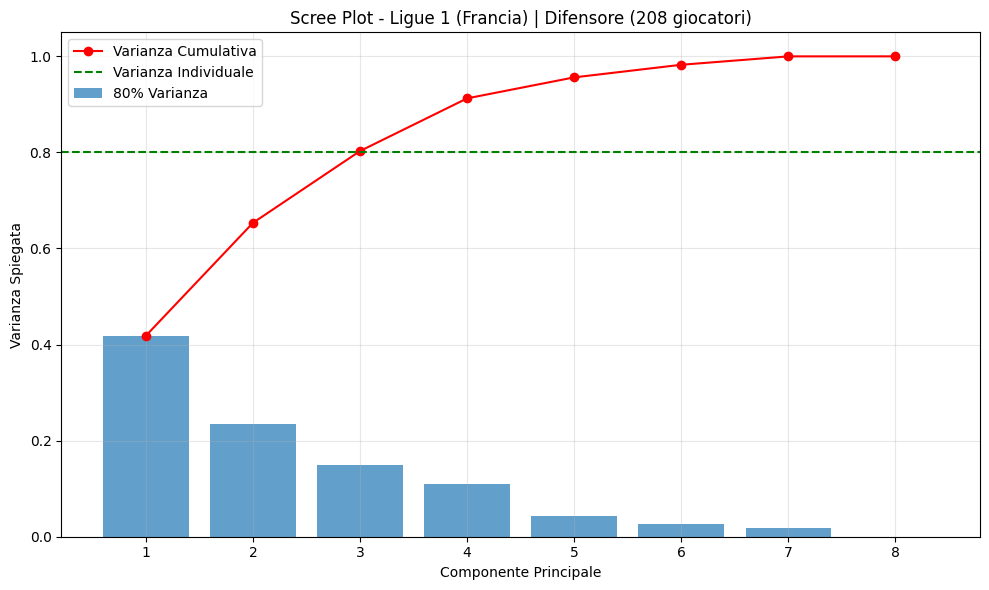

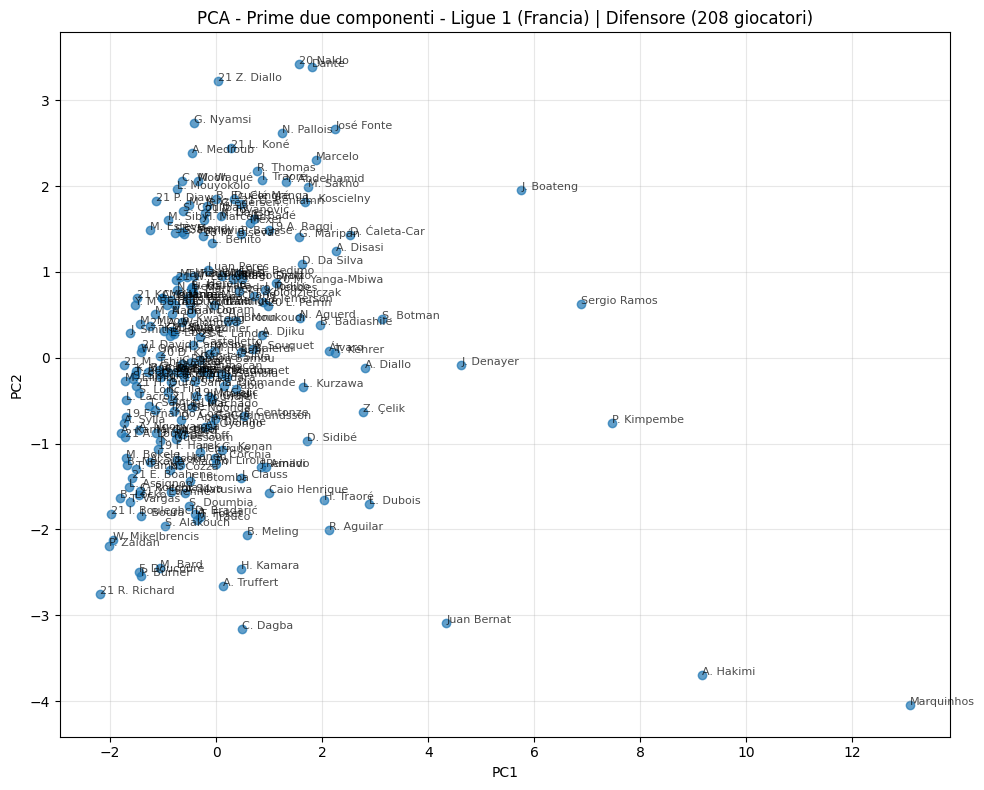

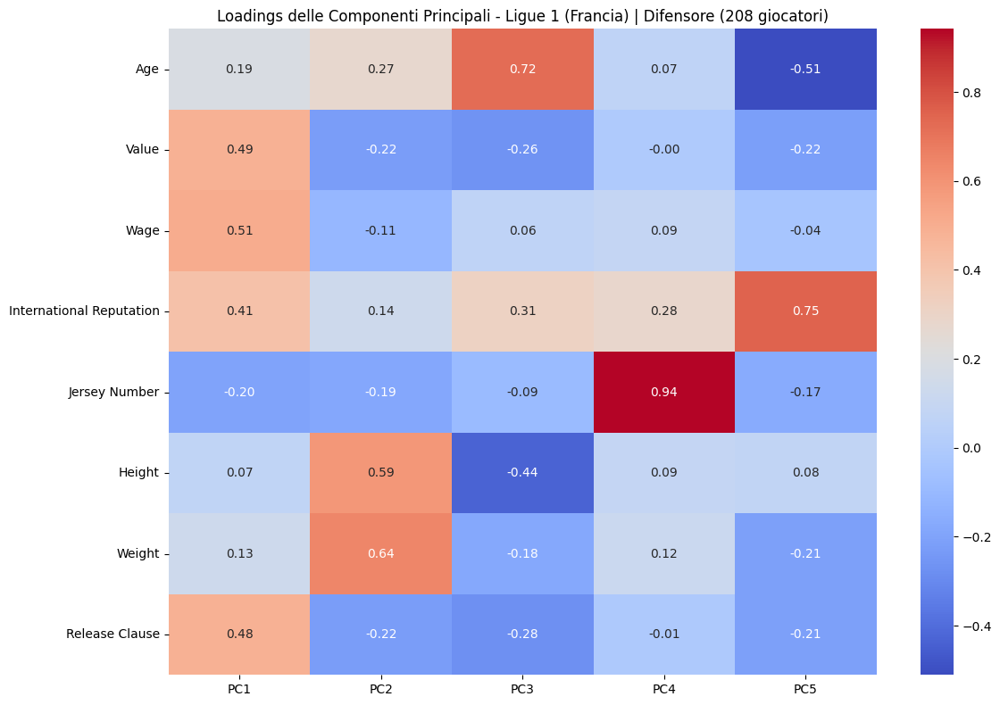


📊 Campionato: Ligue 1 (Francia) | Ruolo: Centrocampista | Giocatori: 240


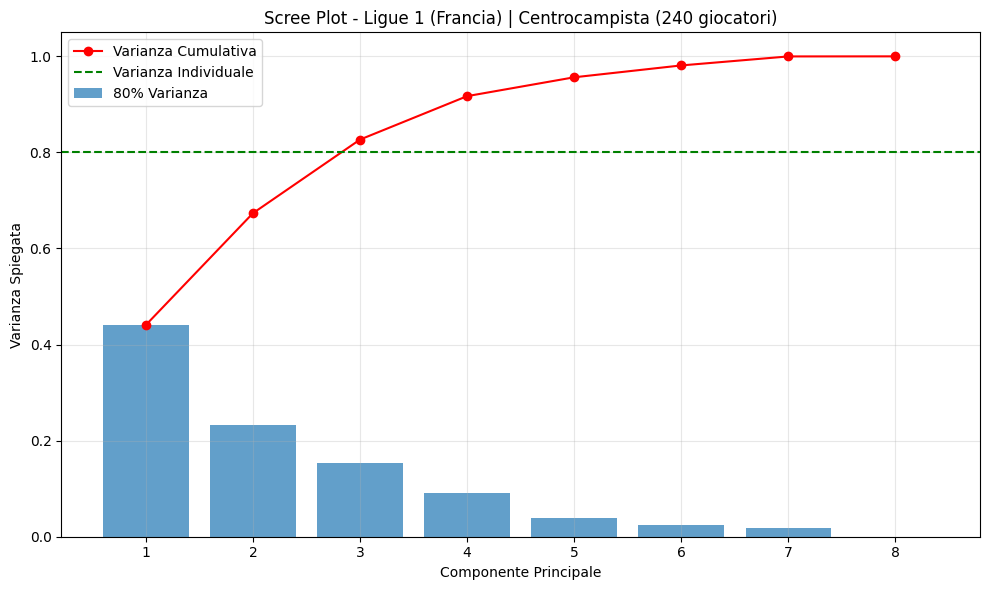

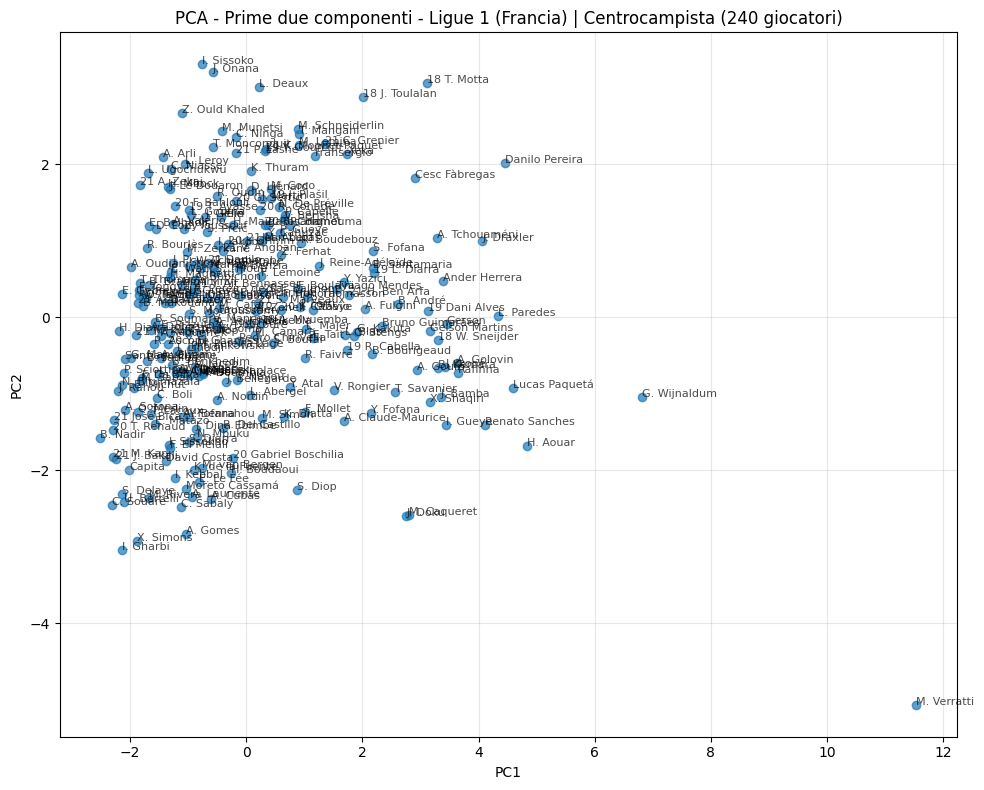

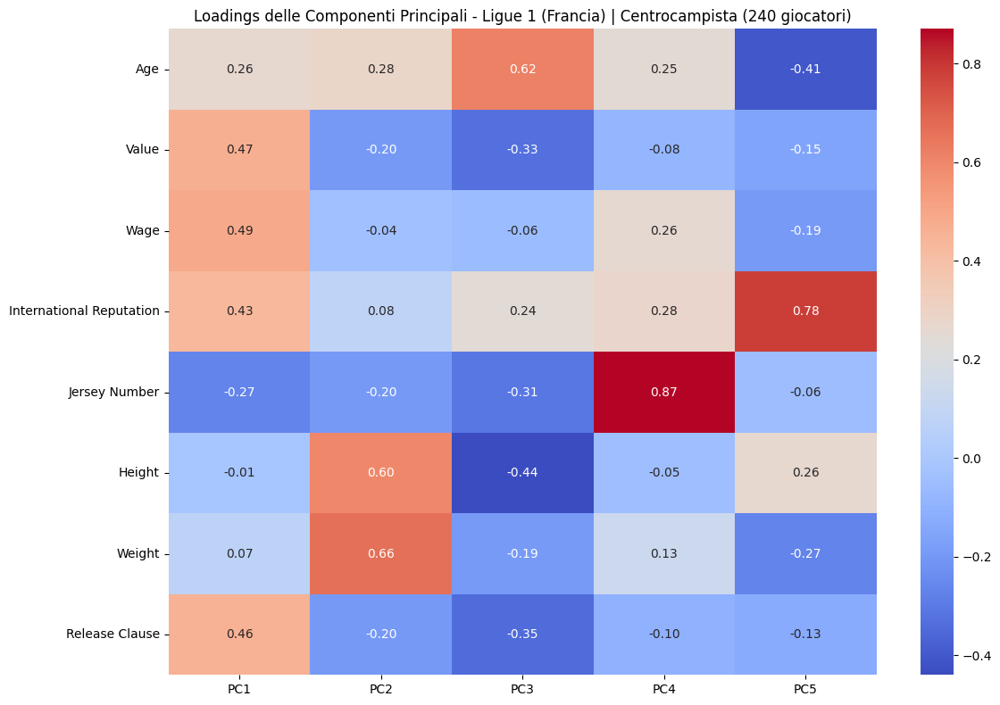


📊 Campionato: Ligue 1 (Francia) | Ruolo: Attaccante | Giocatori: 96


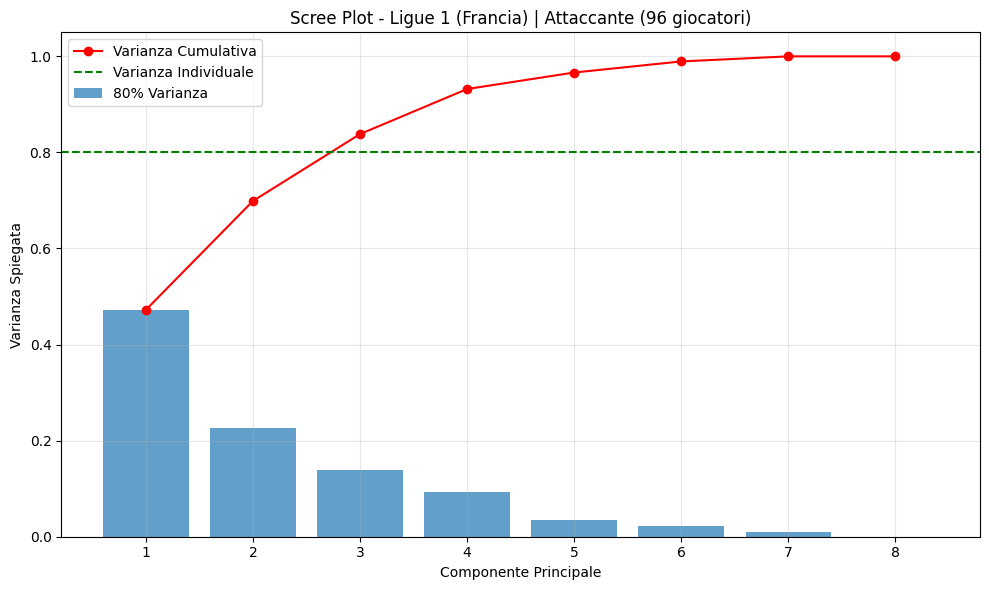

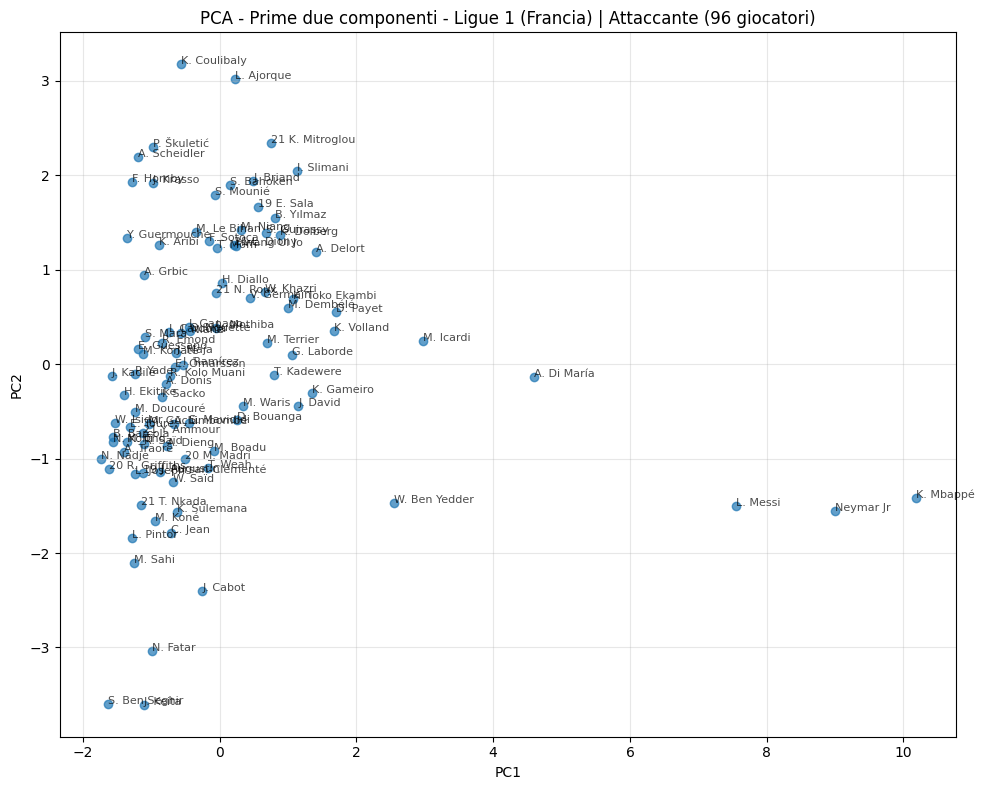

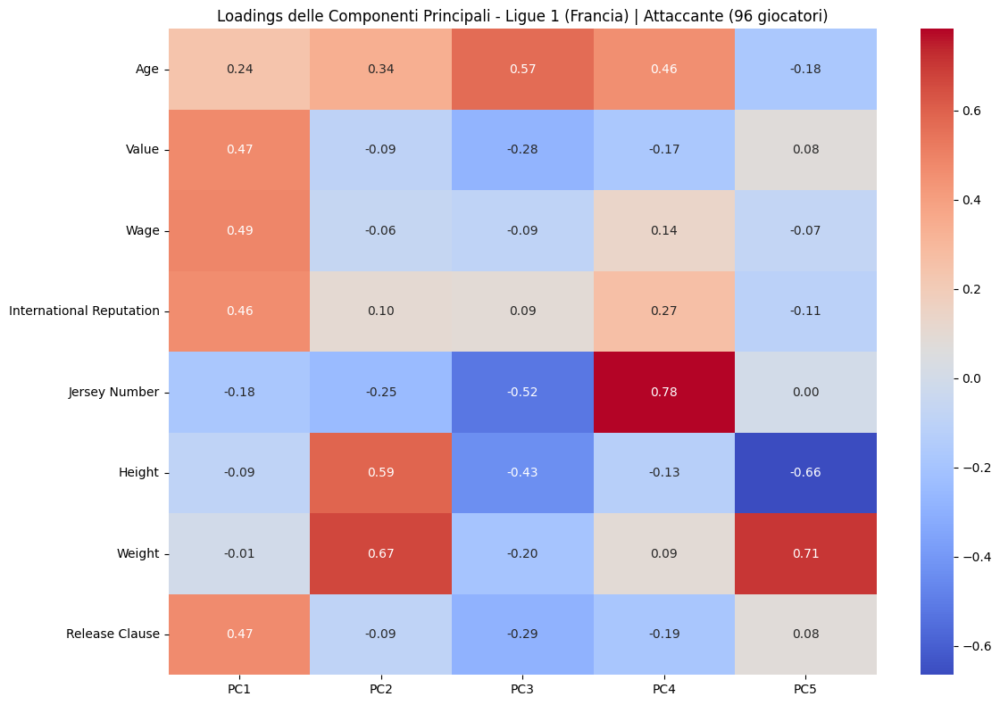


📊 Campionato: Serie A (Italia) | Ruolo: Portiere | Giocatori: 74


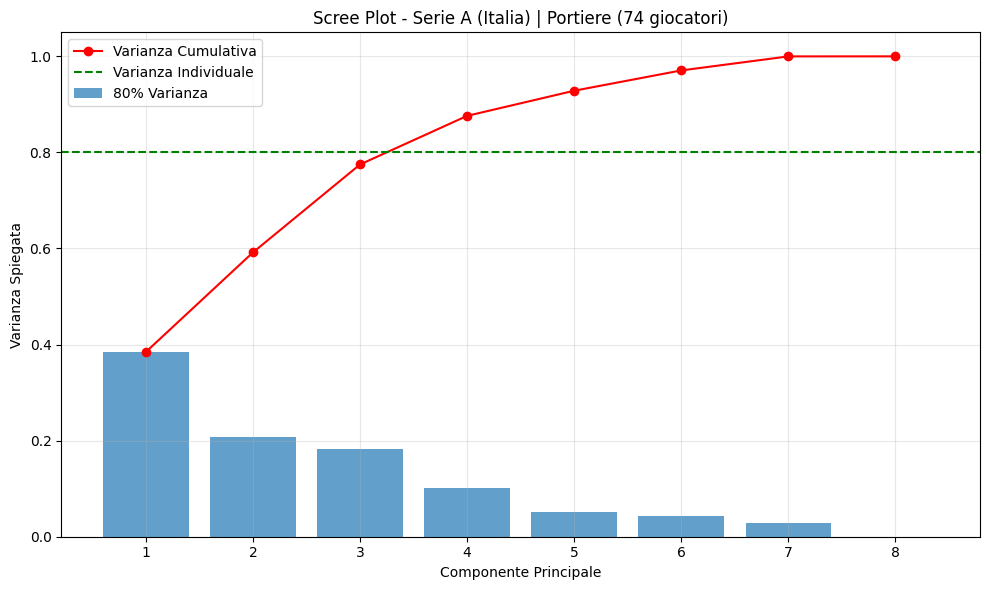

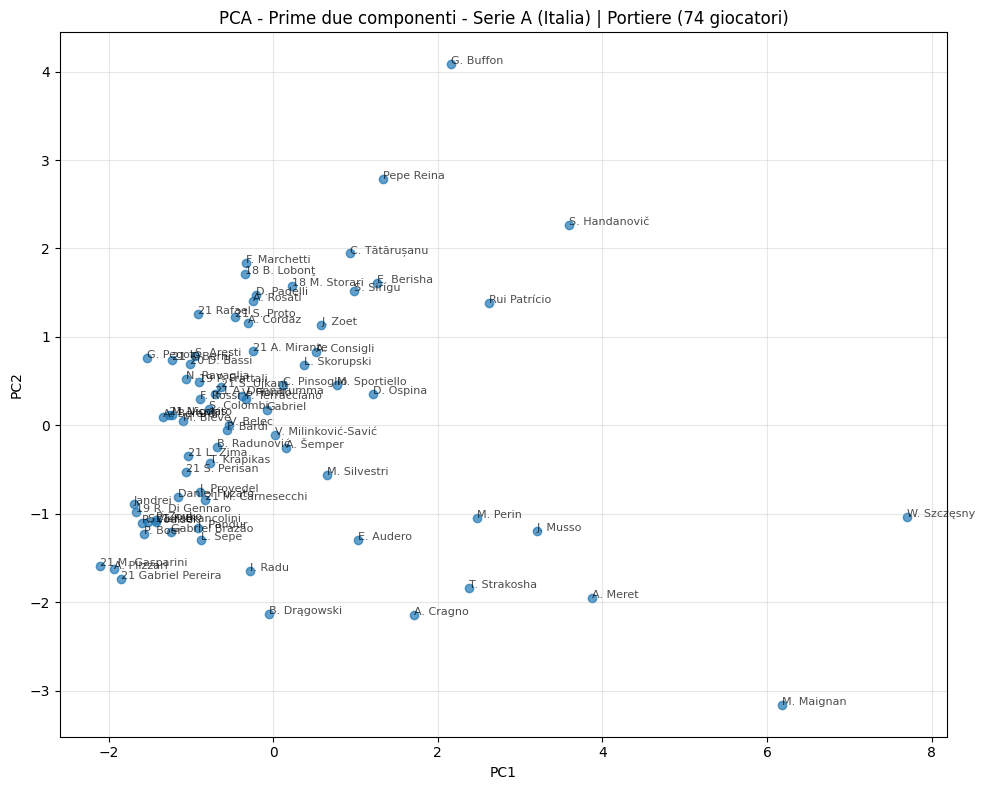

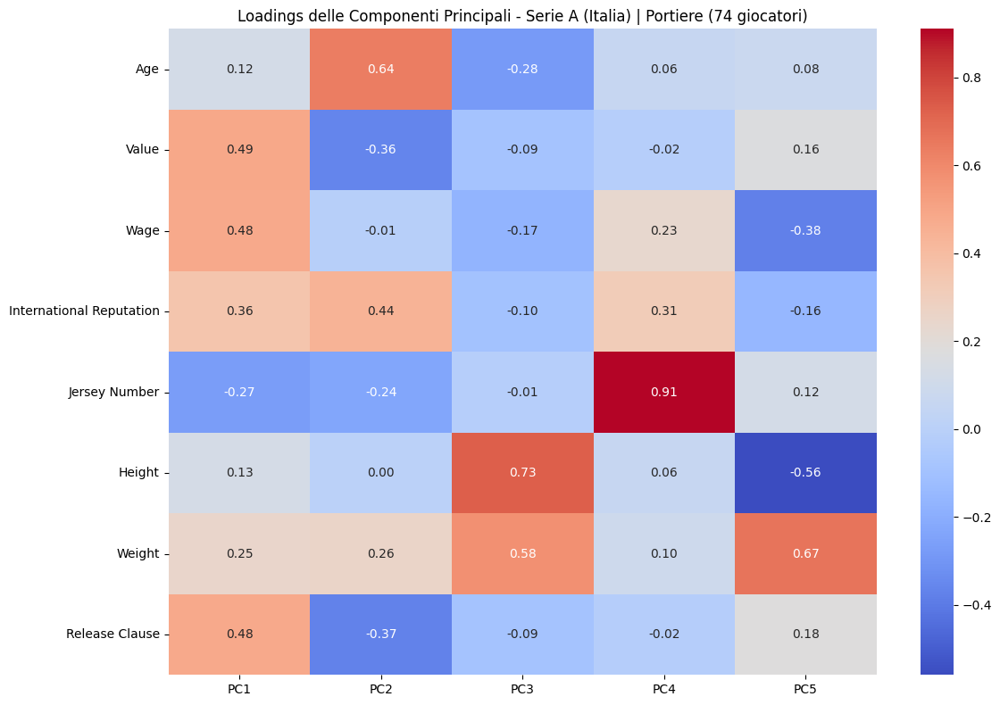


📊 Campionato: Serie A (Italia) | Ruolo: Difensore | Giocatori: 212


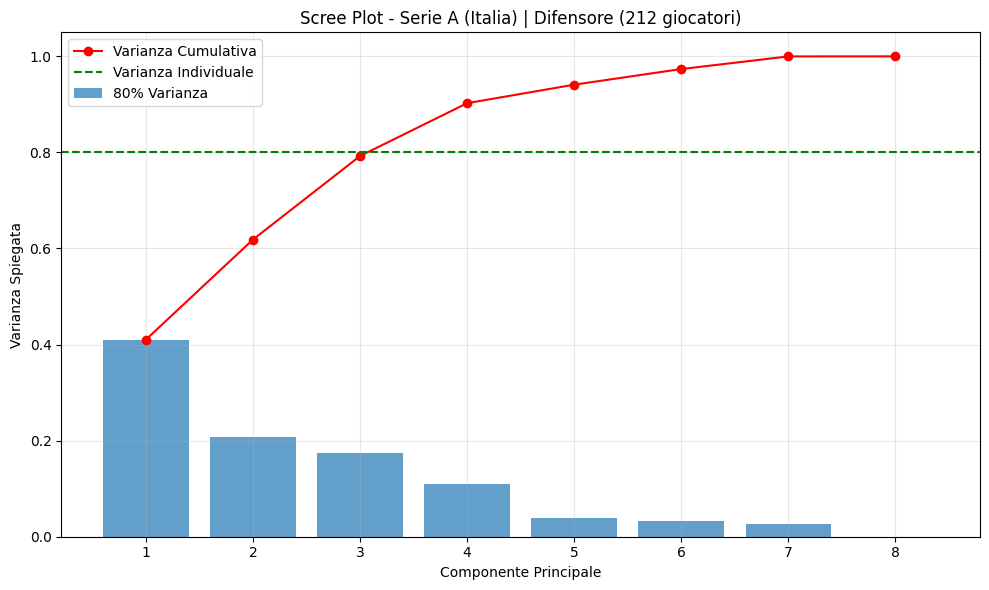

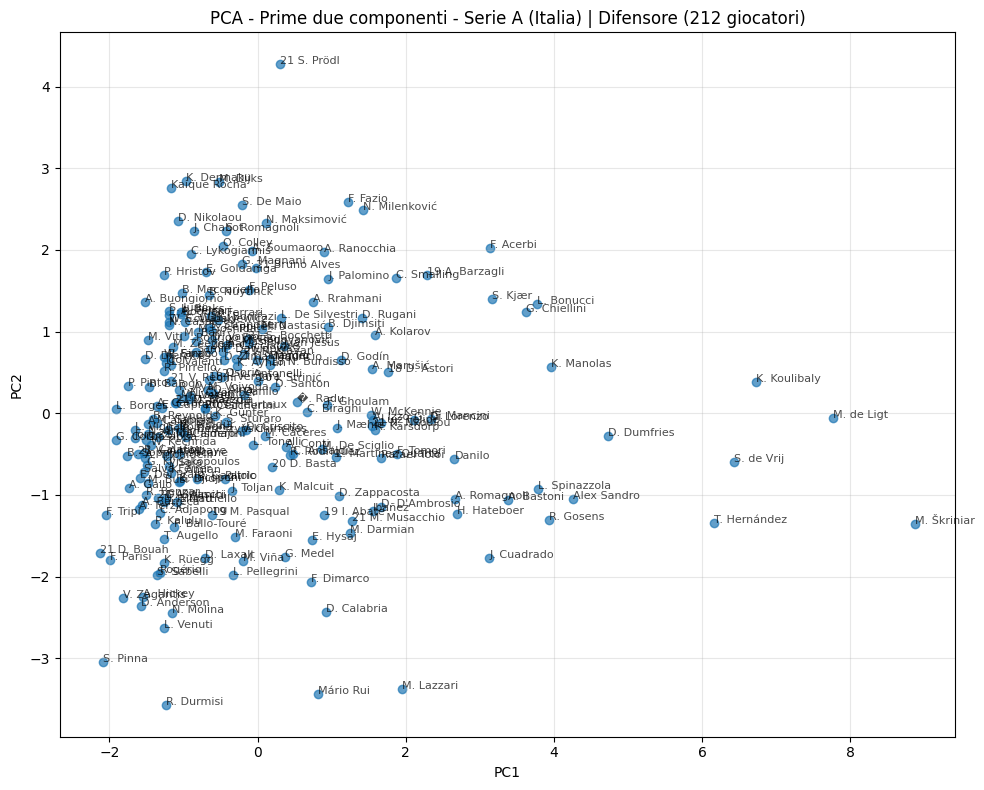

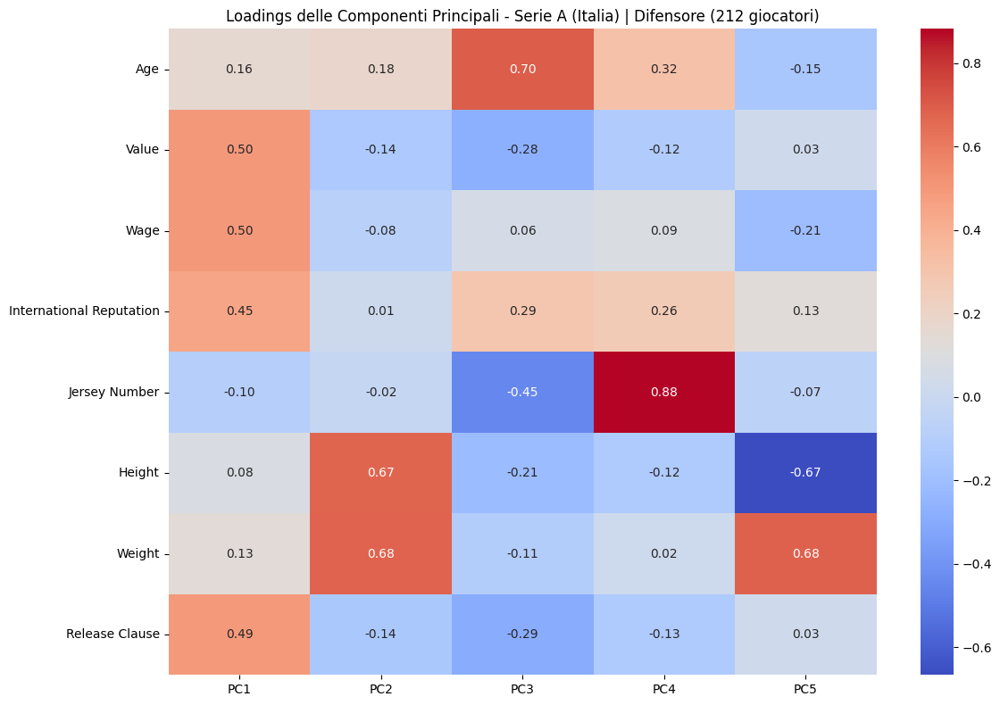


📊 Campionato: Serie A (Italia) | Ruolo: Centrocampista | Giocatori: 234


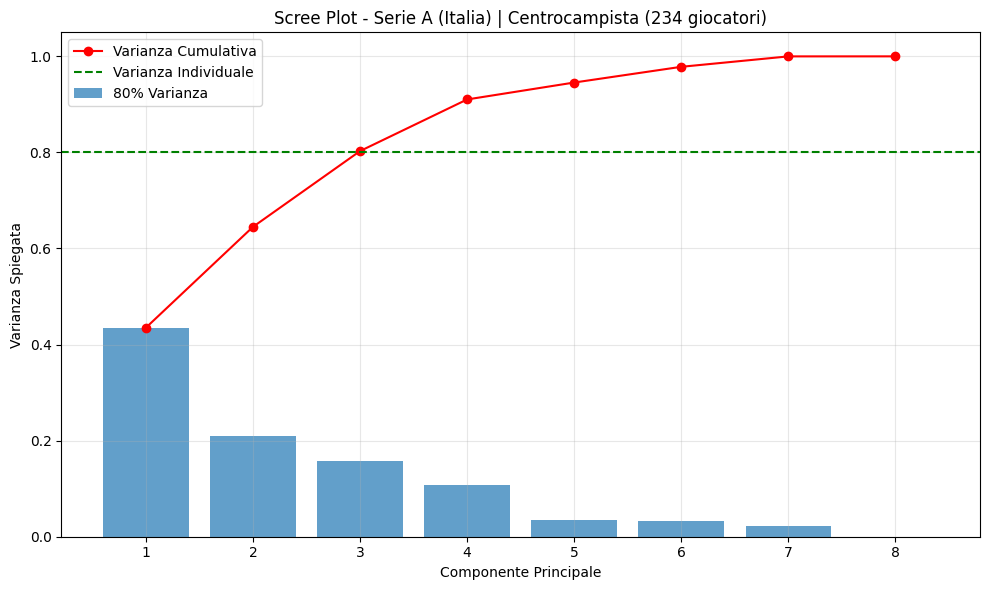

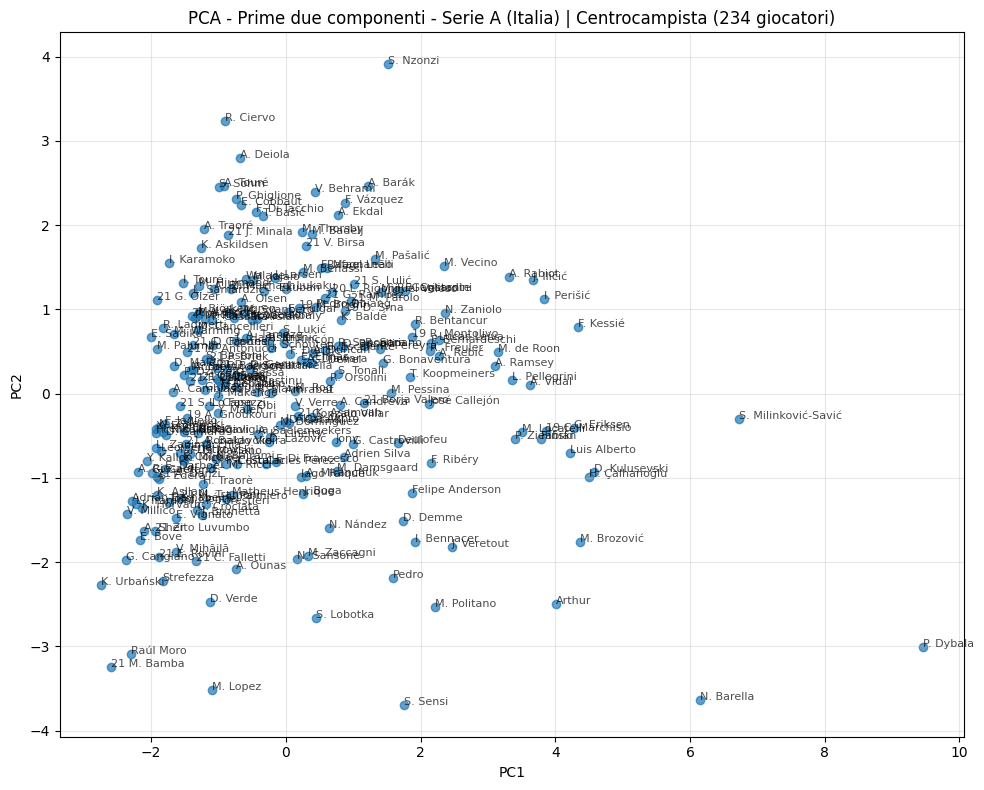

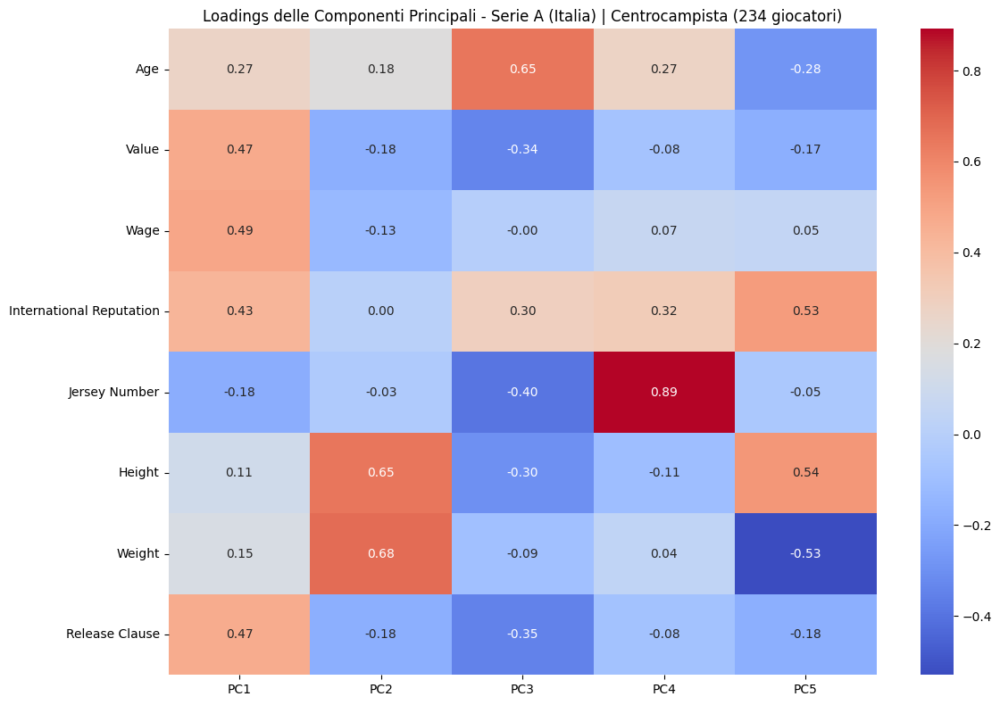


📊 Campionato: Serie A (Italia) | Ruolo: Attaccante | Giocatori: 111


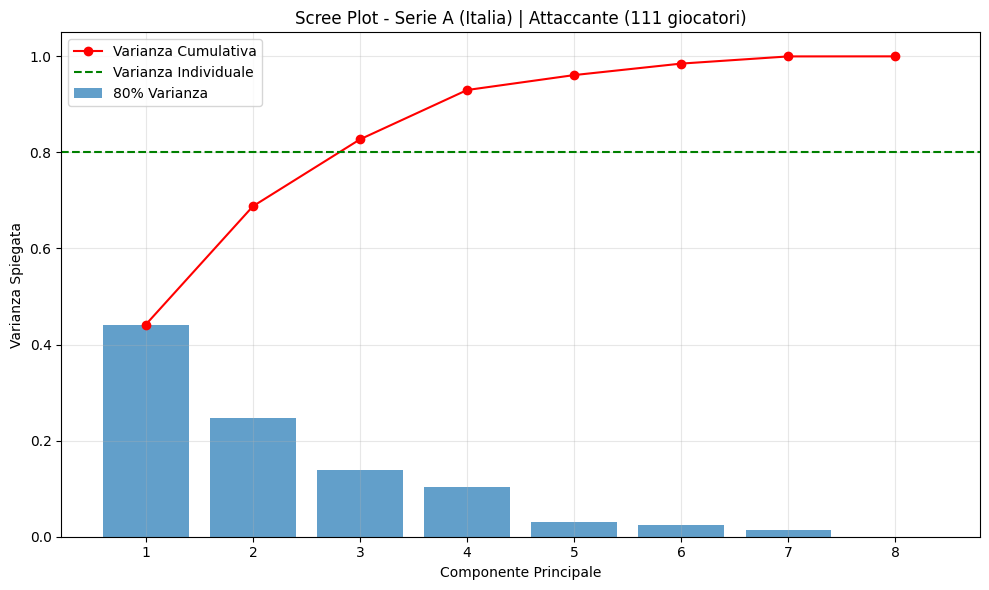

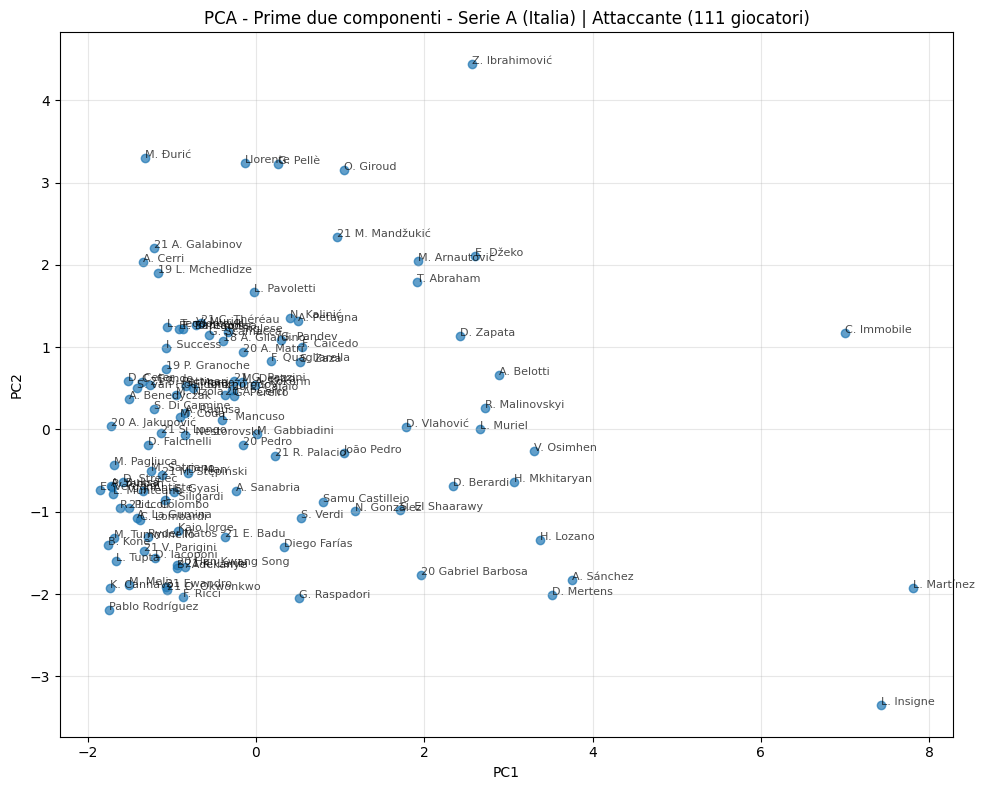

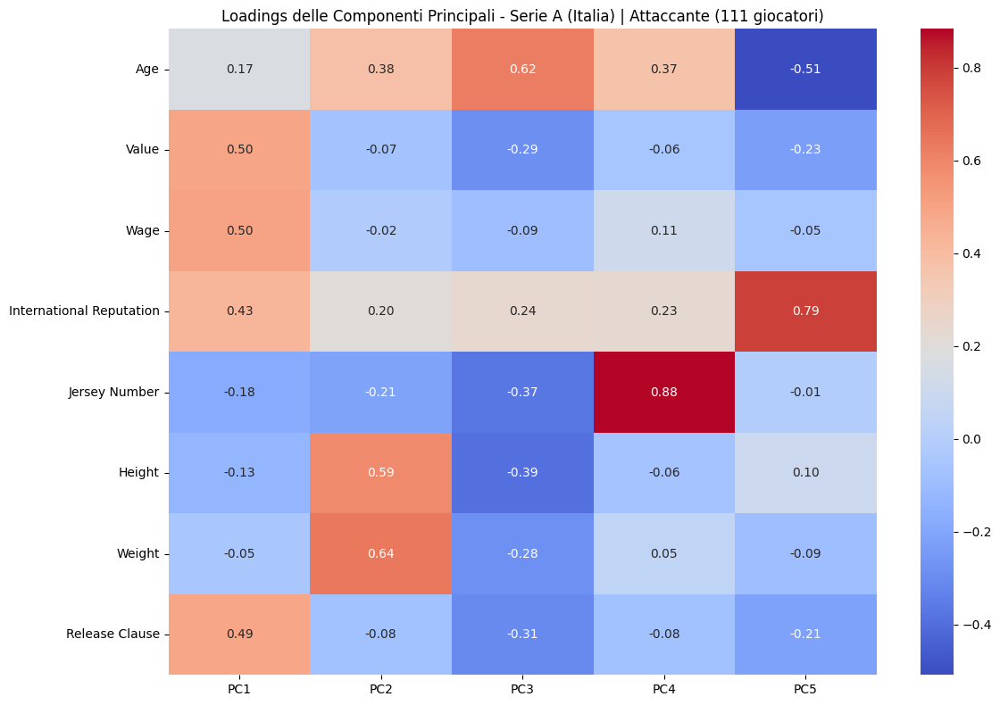


📊 Campionato: Eredivisie (Paesi Bassi) | Ruolo: Portiere | Giocatori: 53


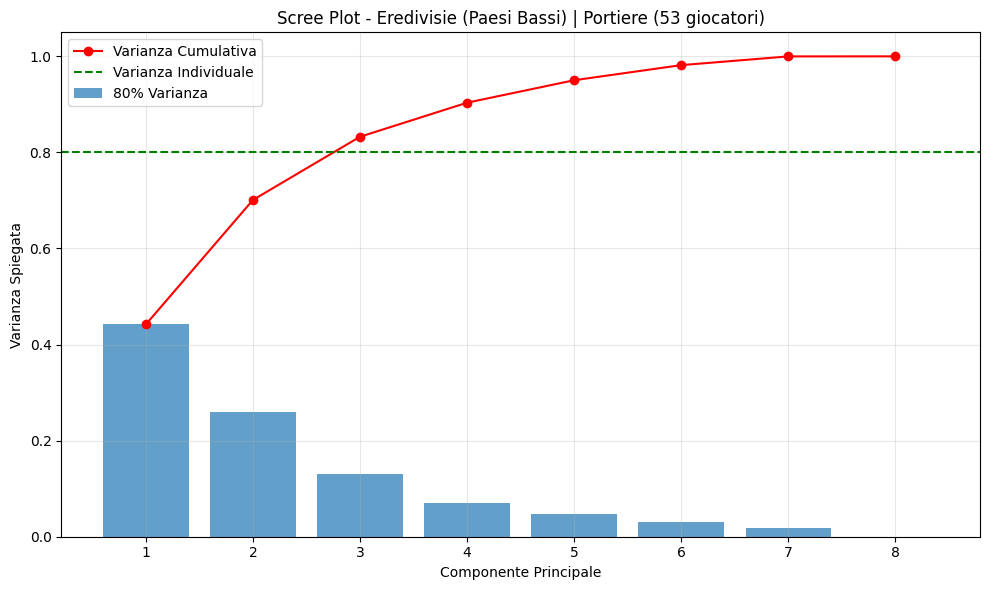

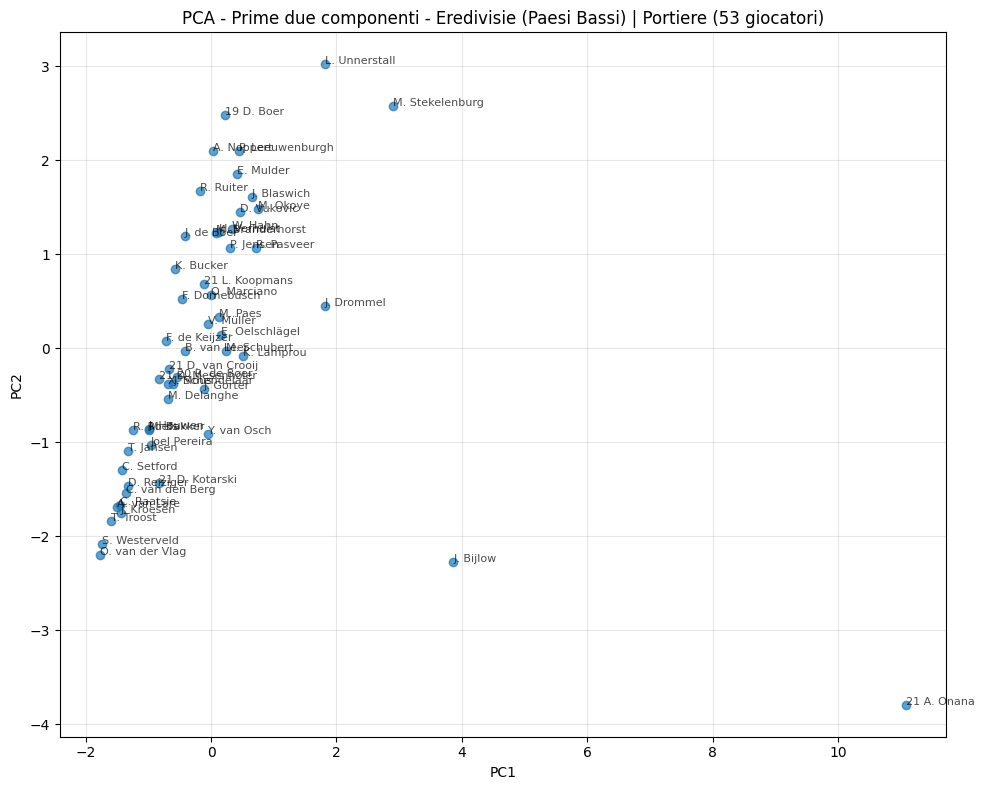

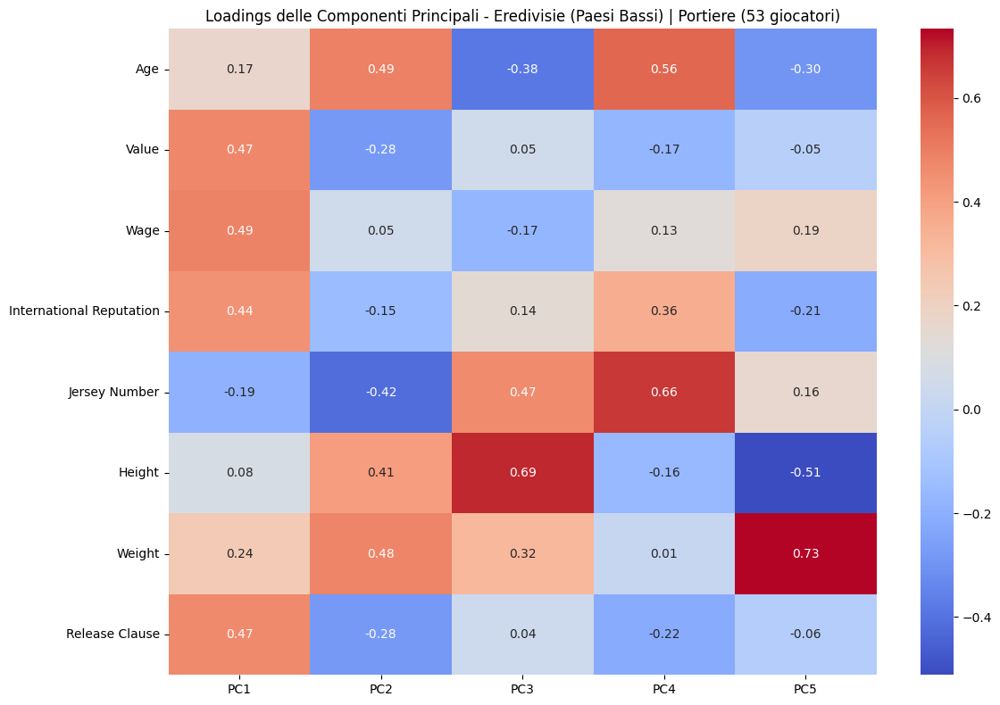


📊 Campionato: Eredivisie (Paesi Bassi) | Ruolo: Difensore | Giocatori: 137


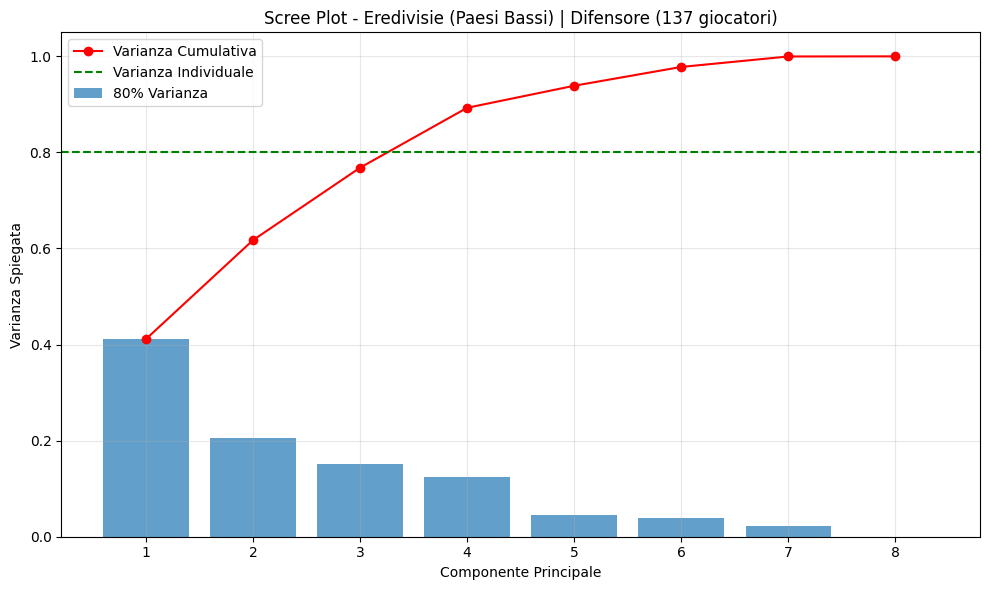

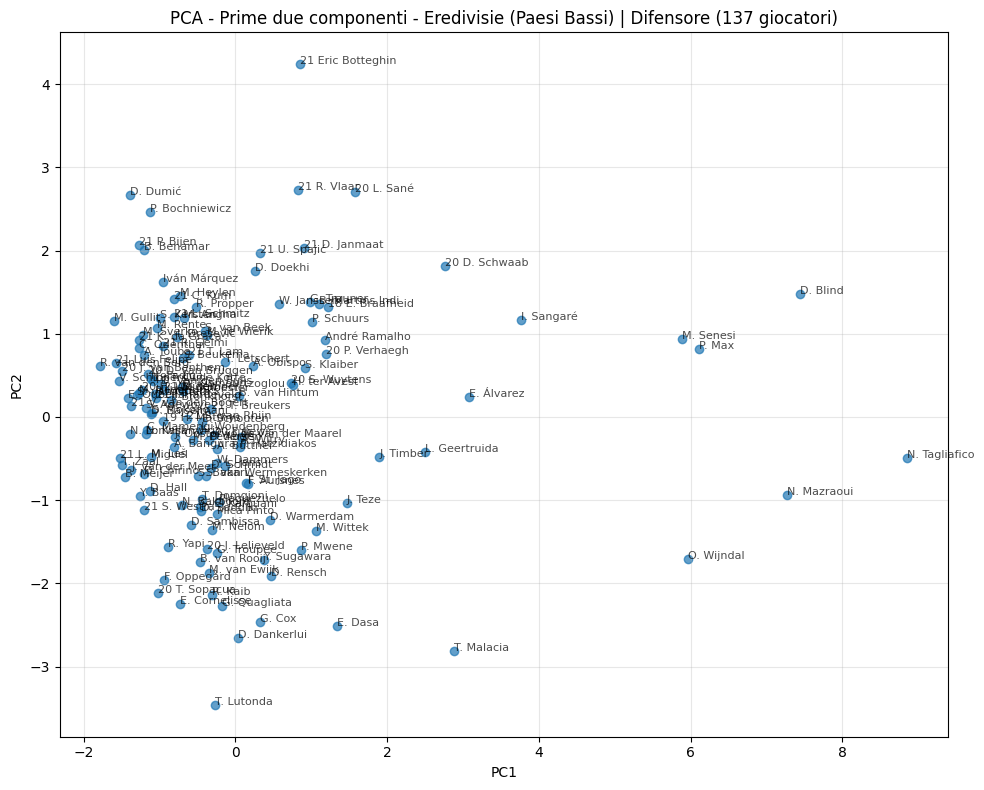

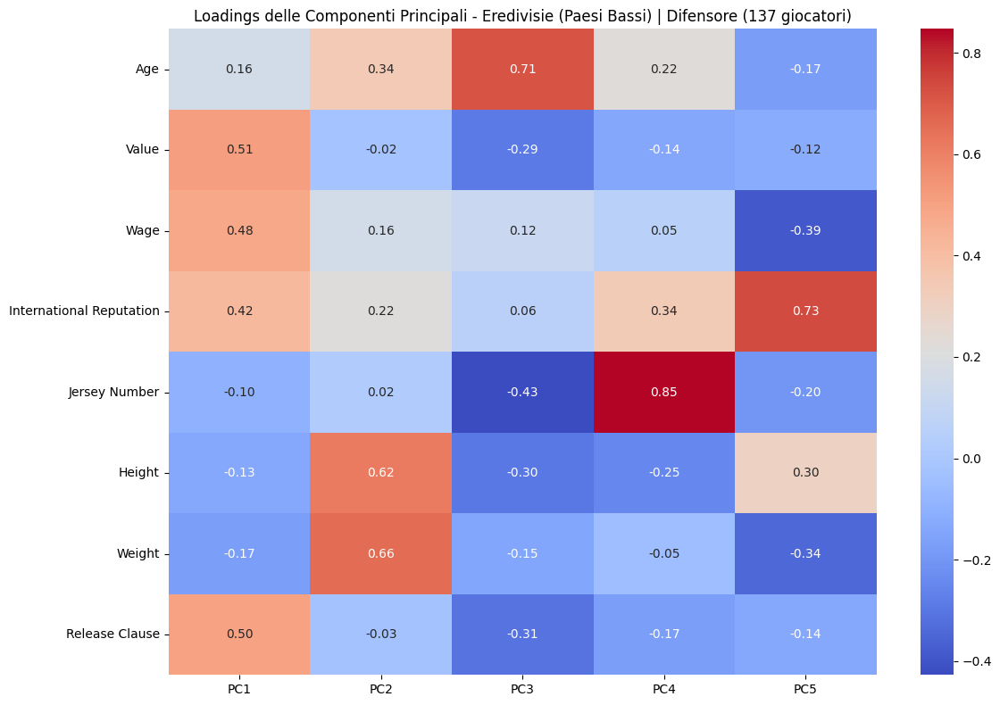


📊 Campionato: Eredivisie (Paesi Bassi) | Ruolo: Centrocampista | Giocatori: 178


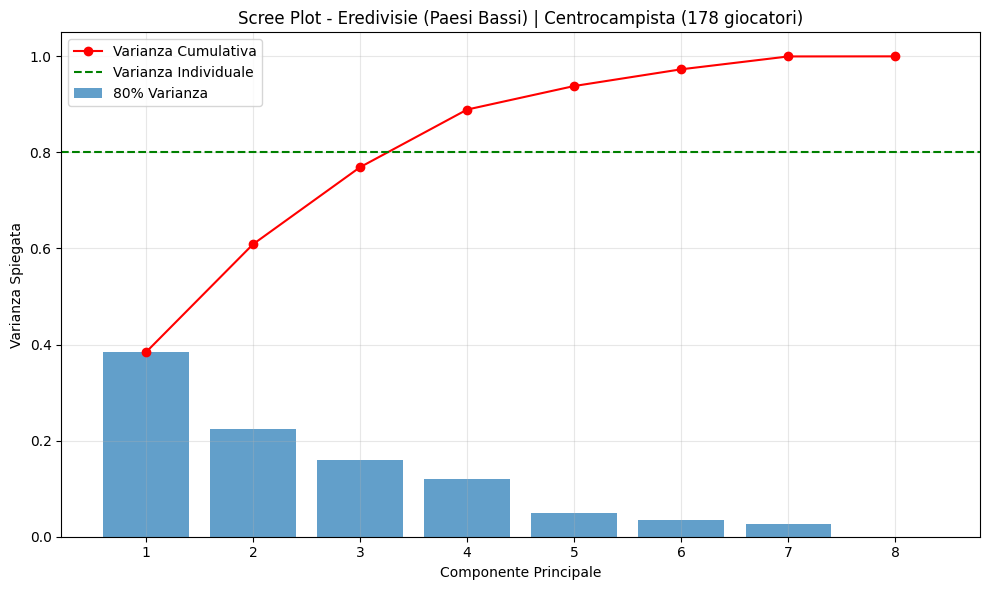

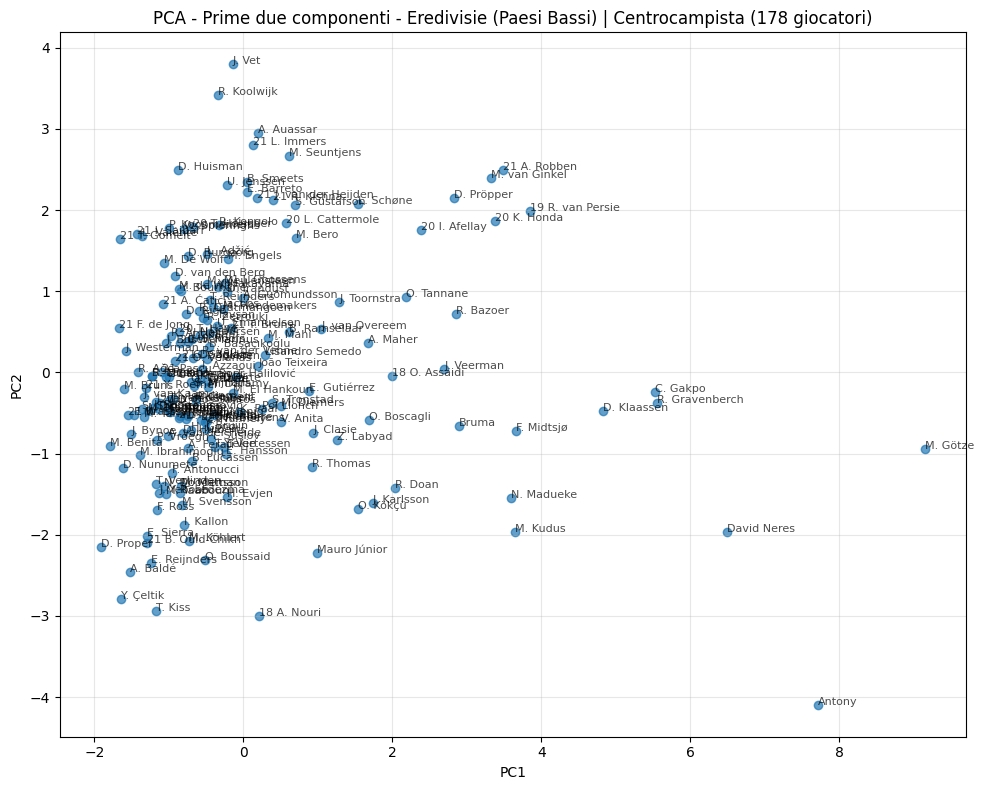

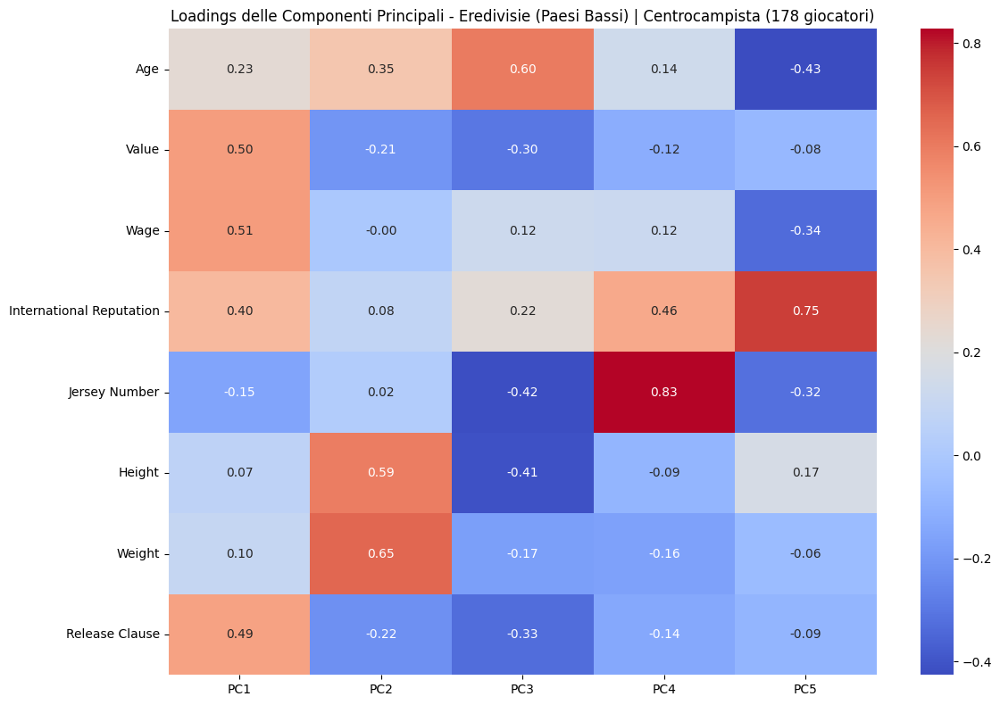


📊 Campionato: Eredivisie (Paesi Bassi) | Ruolo: Attaccante | Giocatori: 70


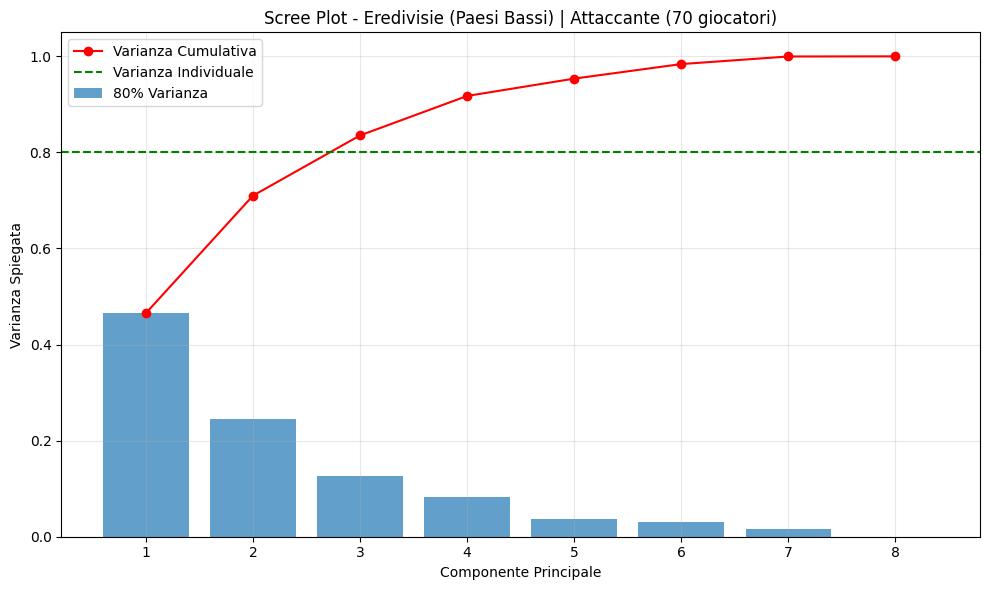

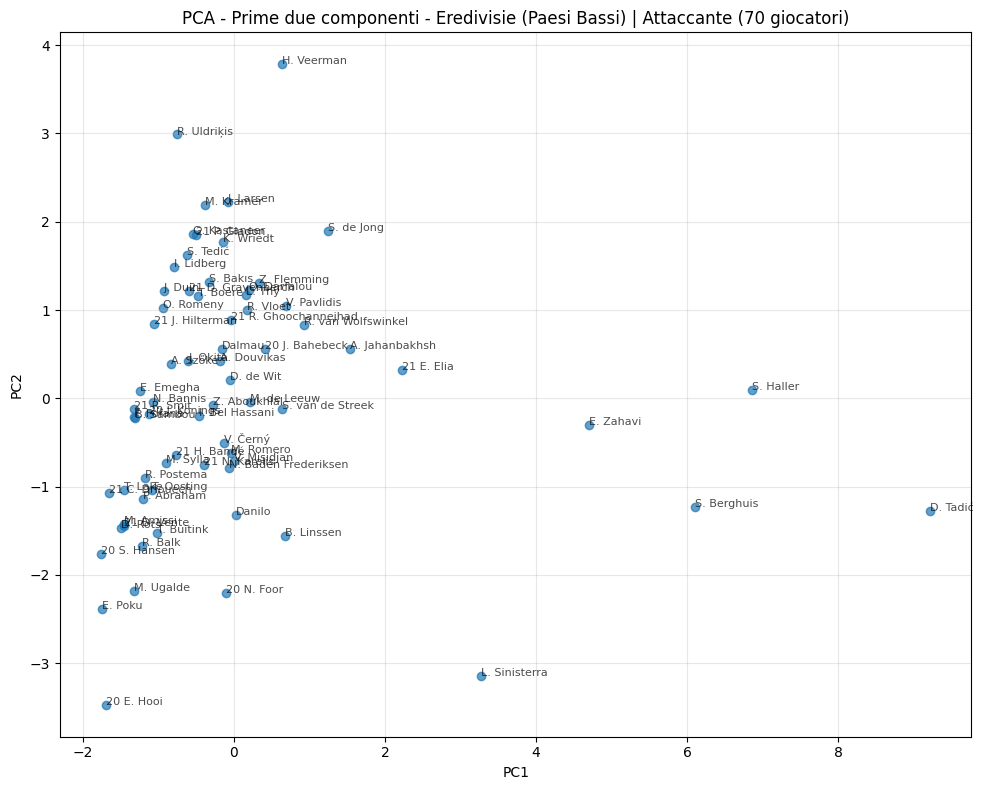

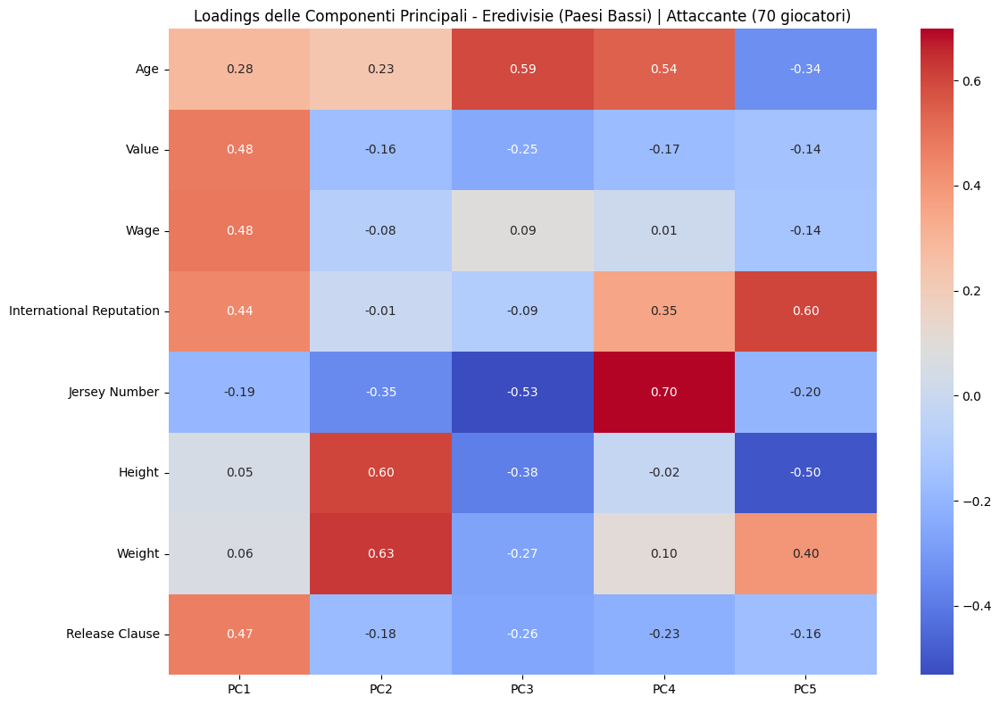


📊 Campionato: Primeira Liga (Portogallo) | Ruolo: Portiere | Giocatori: 51


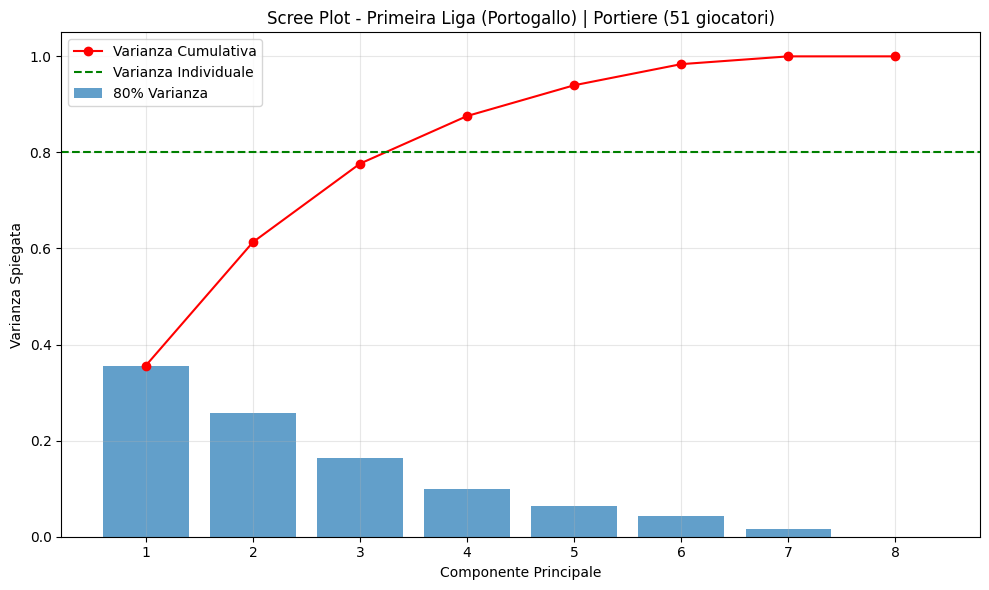

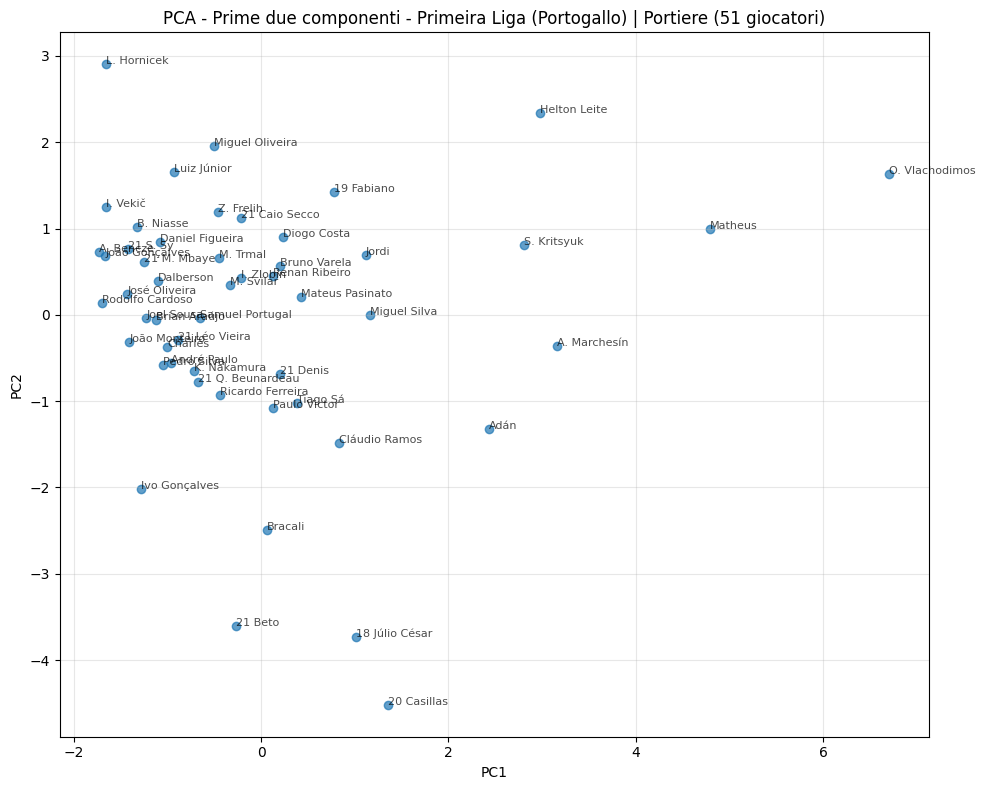

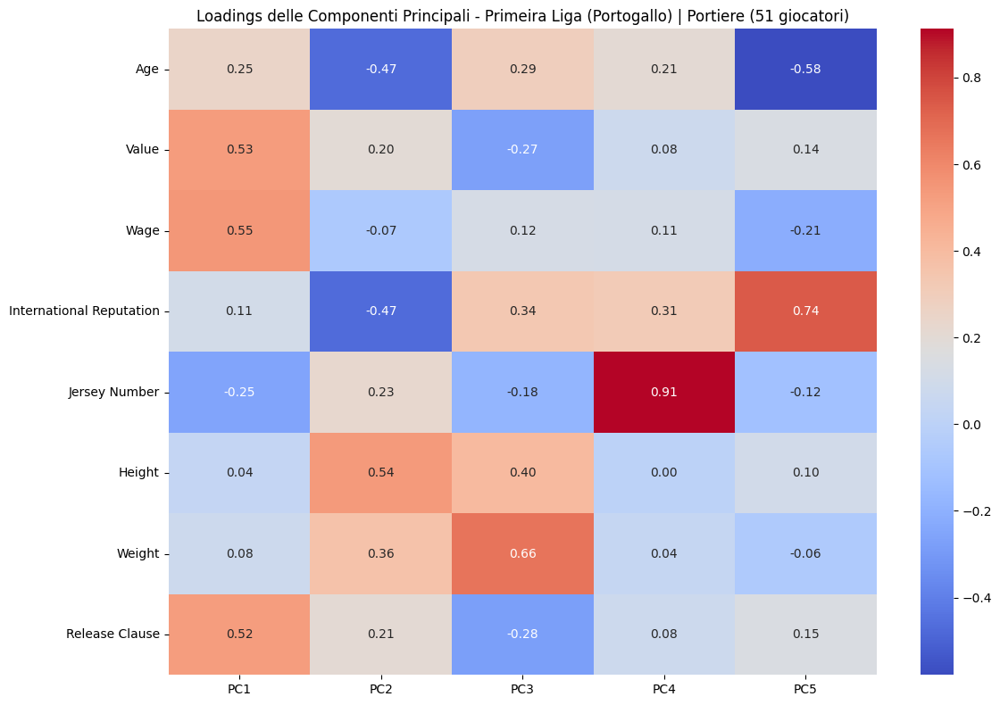


📊 Campionato: Primeira Liga (Portogallo) | Ruolo: Difensore | Giocatori: 138


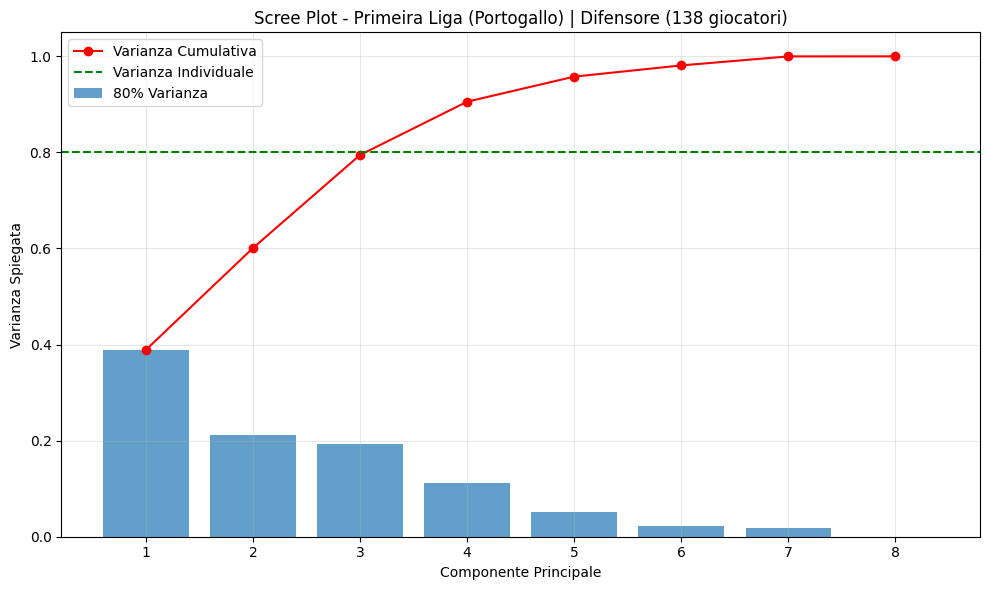

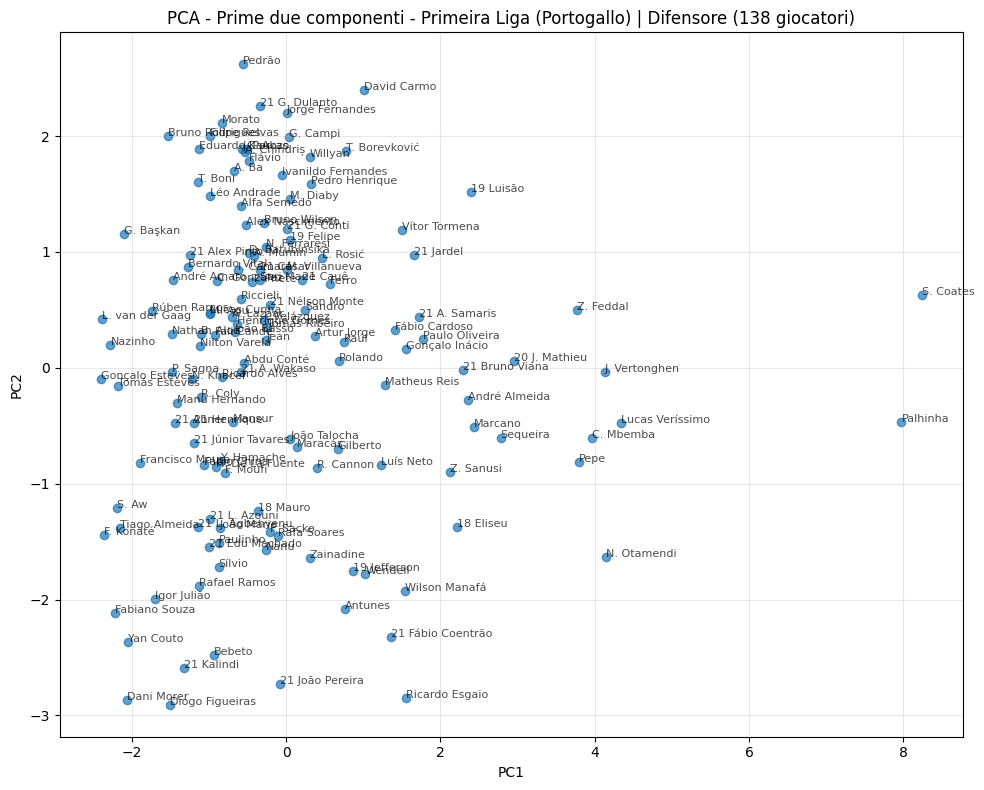

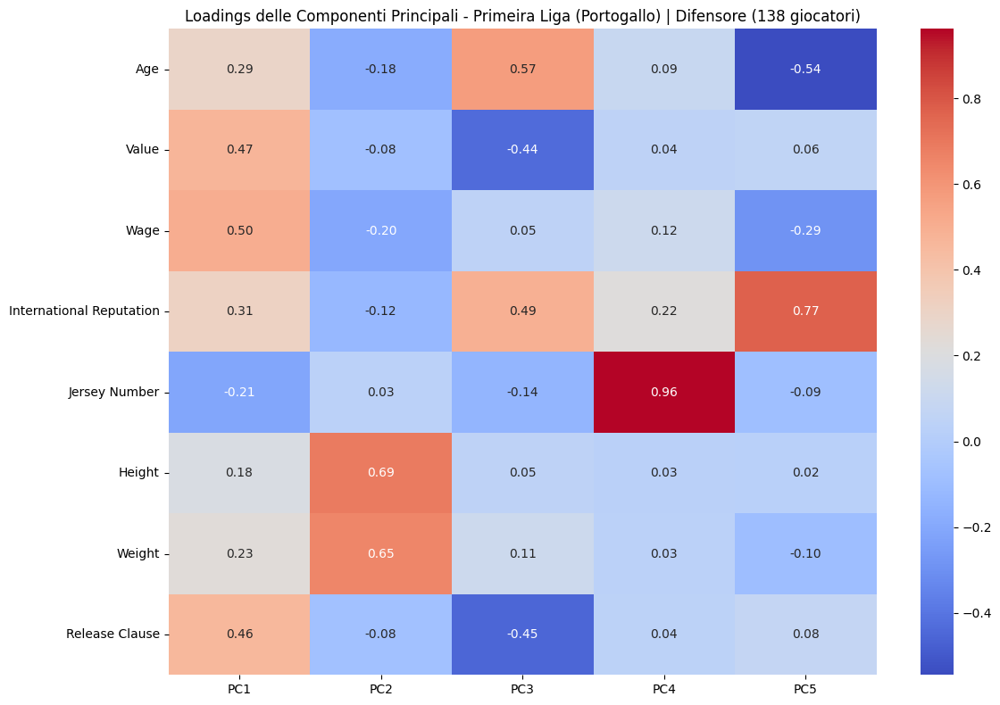


📊 Campionato: Primeira Liga (Portogallo) | Ruolo: Centrocampista | Giocatori: 146


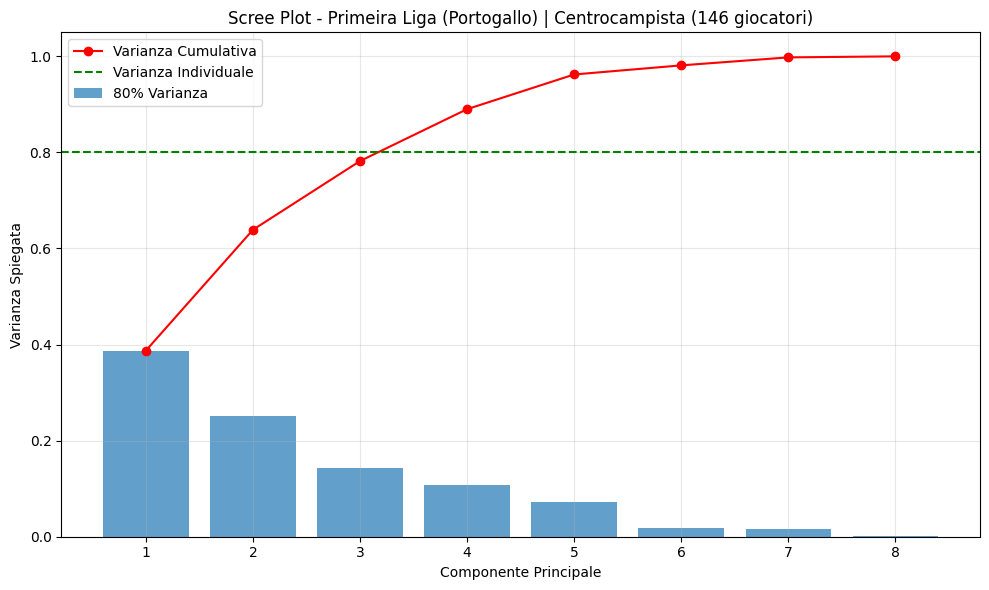

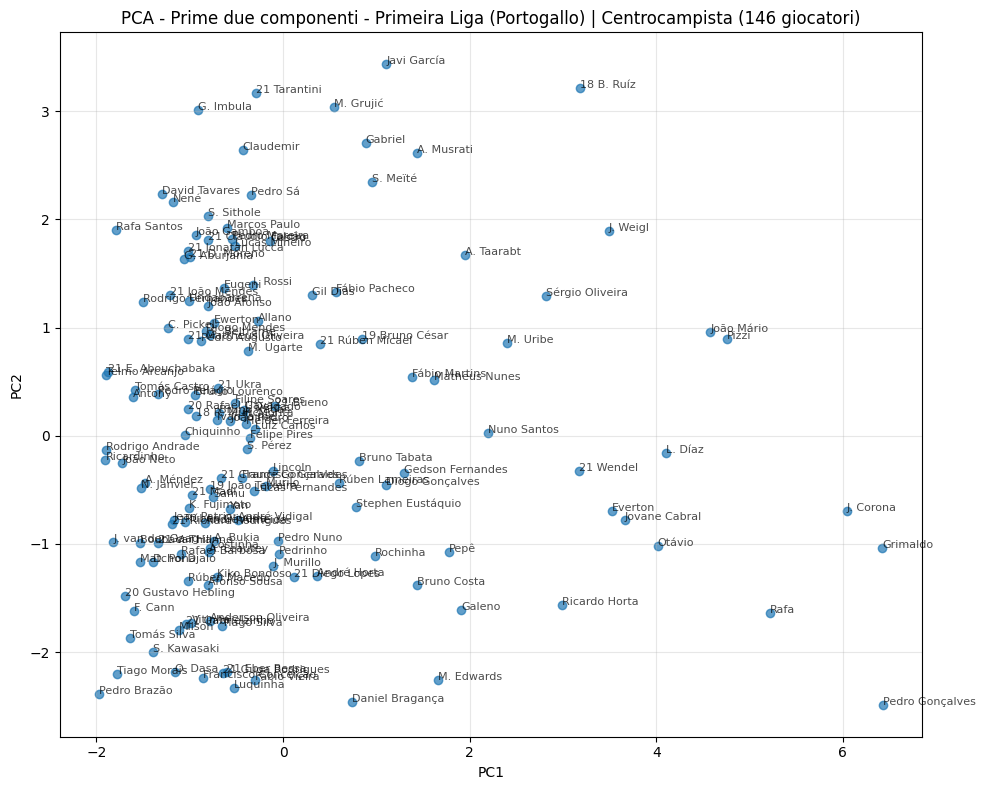

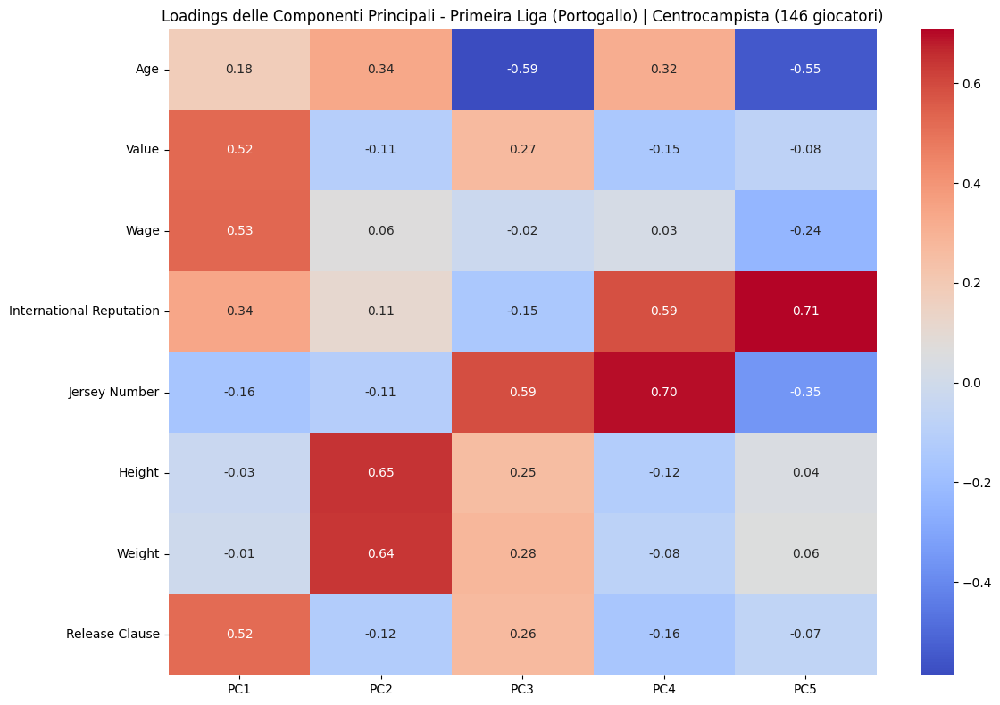


📊 Campionato: Primeira Liga (Portogallo) | Ruolo: Attaccante | Giocatori: 84


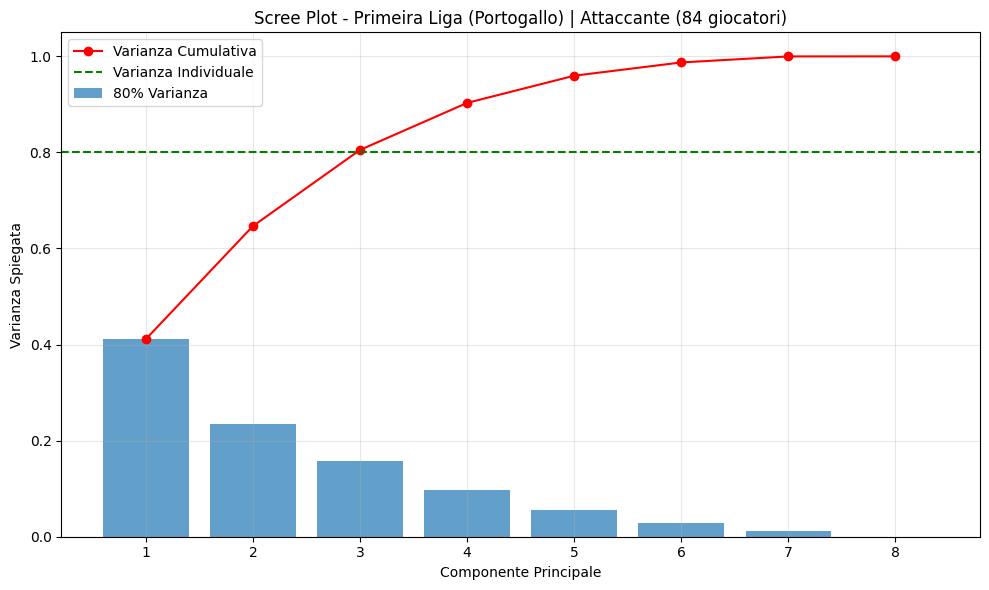

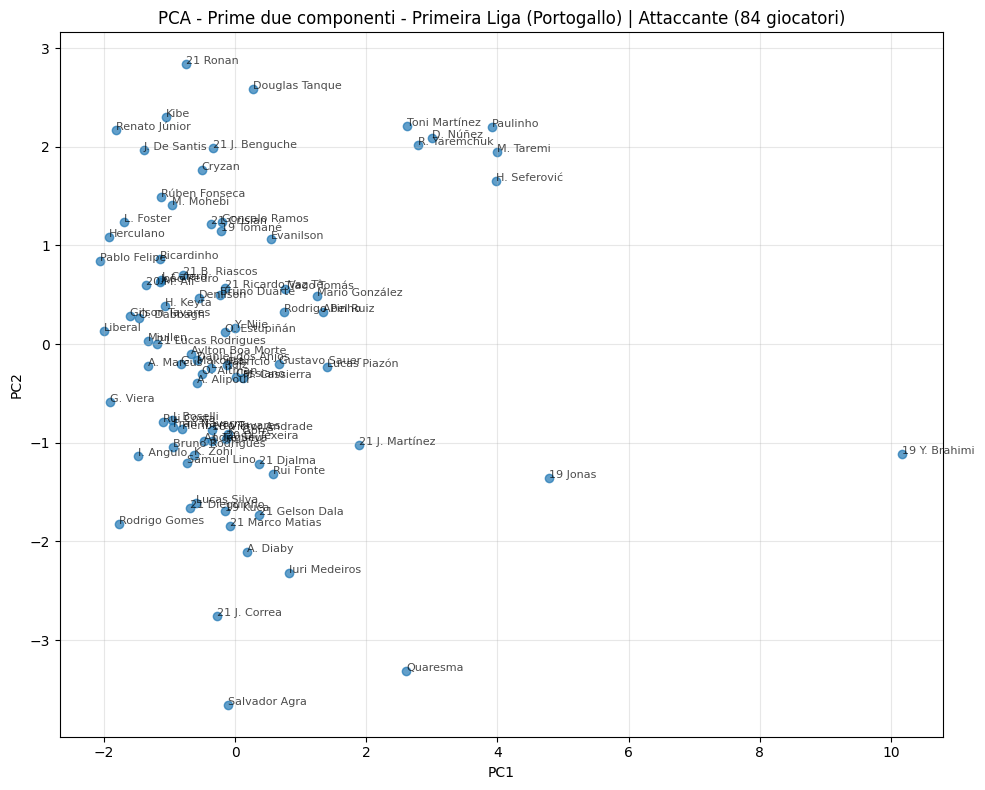

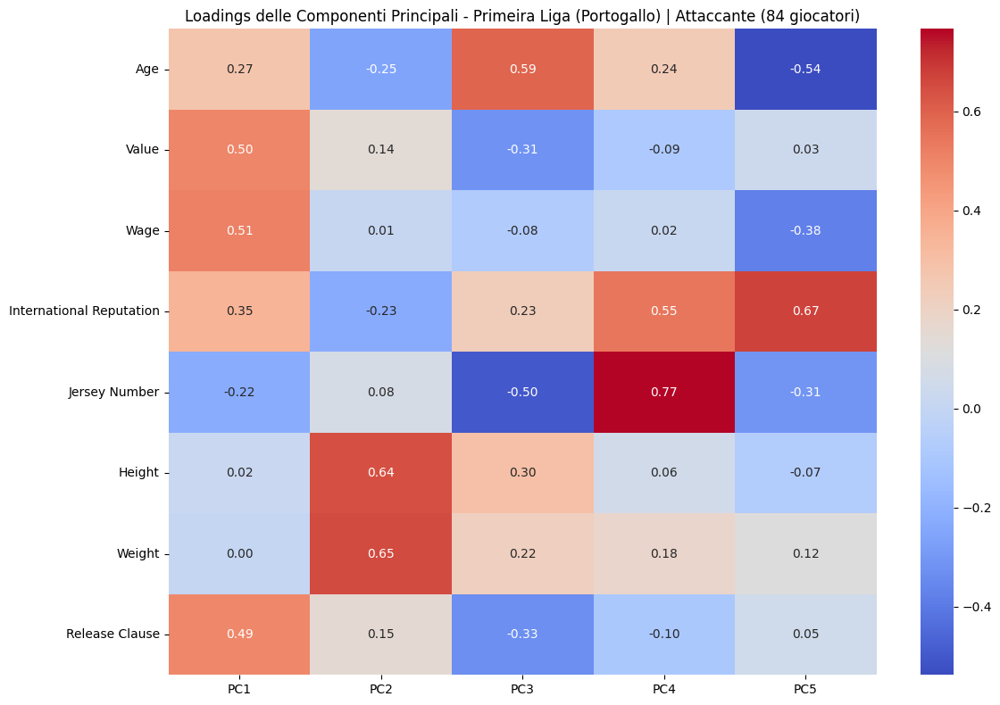


🔢 Riepilogo numero di giocatori per campionato e ruolo:
Ruolo                         Attaccante  Centrocampista  Difensore  Portiere  \
Campionato                                                                      
Bundesliga (Germania)                 90             208        175        65   
Eredivisie (Paesi Bassi)              70             178        137        53   
LaLiga (Spagna)                       37              88         85        28   
Ligue 1 (Francia)                     96             240        208        69   
Premier League (Inghilterra)         119             301        290        92   
Primeira Liga (Portogallo)            84             146        138        51   
Serie A (Italia)                     111             234        212        74   
Totale                               607            1395       1245       432   

Ruolo                         Totale  
Campionato                            
Bundesliga (Germania)            538  
Eredivisie (Pae

<Figure size 1200x800 with 0 Axes>

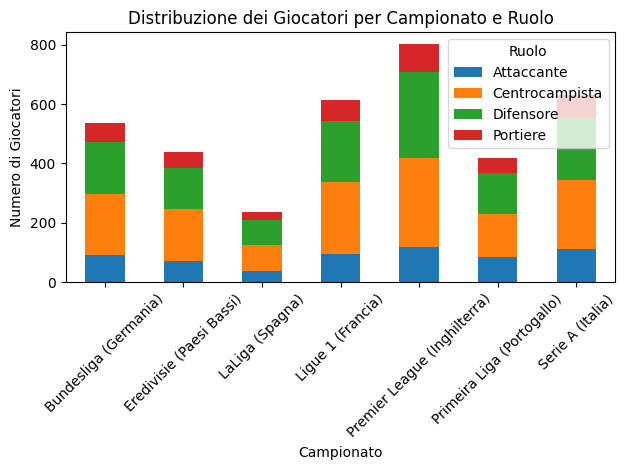



Analisi delle componenti principali correlate allo stipendio - Premier League (Inghilterra)

----------------------------------------
Ruolo: Portiere | Giocatori: 92
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9477 (correlazione positiva)
  PC7: 0.2741 (correlazione positiva)
  PC2: -0.1527 (correlazione negativa)
  PC5: 0.0384 (correlazione positiva)
  PC4: 0.0376 (correlazione positiva)
  PC6: 0.0179 (correlazione positiva)
  PC3: -0.0139 (correlazione negativa)
  PC8: -0.0002 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9477
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4958
    - Value: 0.4444
    - Release Clause: 0.4423
    - International Reputation: 0.4178
    - Age: 0.2062
    - Weight: 0.1891
    - Height: -0.0068
    - Jersey Number: -0.3289
  Feature con loading negativo (importanza decrescente):
    - Jersey Num

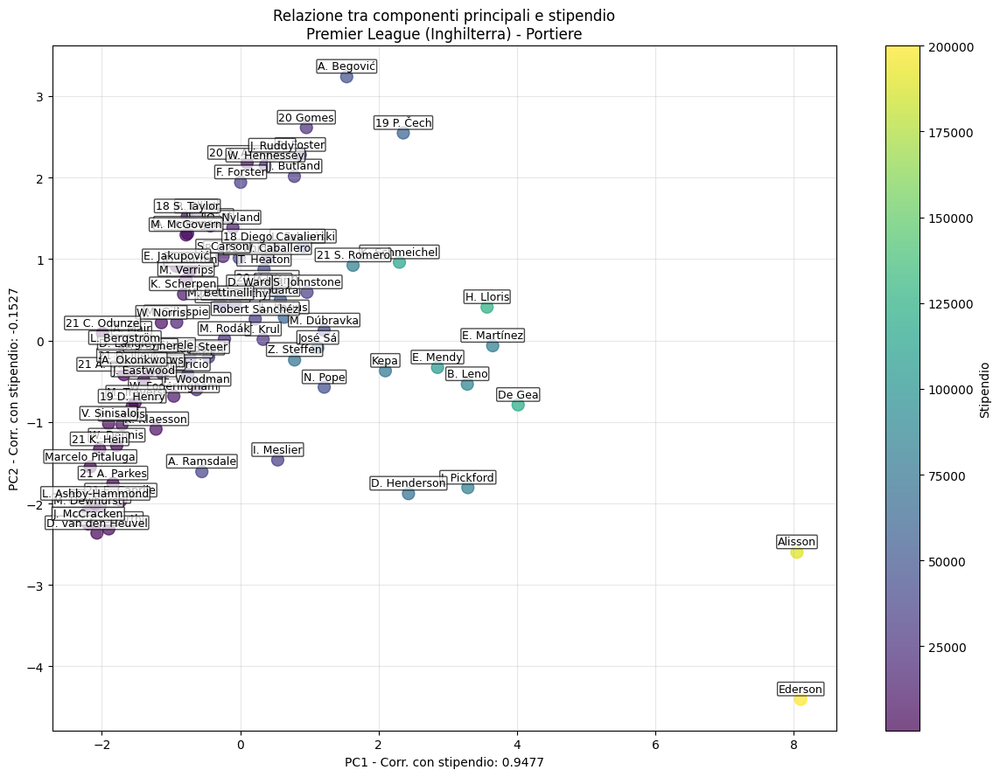


----------------------------------------
Ruolo: Difensore | Giocatori: 290
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9484 (correlazione positiva)
  PC7: 0.2712 (correlazione positiva)
  PC2: -0.1543 (correlazione negativa)
  PC6: 0.0556 (correlazione positiva)
  PC5: 0.0077 (correlazione positiva)
  PC4: -0.0037 (correlazione negativa)
  PC8: -0.0003 (correlazione negativa)
  PC3: 0.0003 (correlazione positiva)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9484
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4926
    - Value: 0.4447
    - Release Clause: 0.4419
    - International Reputation: 0.4075
    - Age: 0.2679
    - Weight: 0.2027
    - Height: 0.1256
    - Jersey Number: -0.2639
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.2639
    - Height: 0.1256
    - Weight: 0.2027
    - Age: 0.2679
    - International 

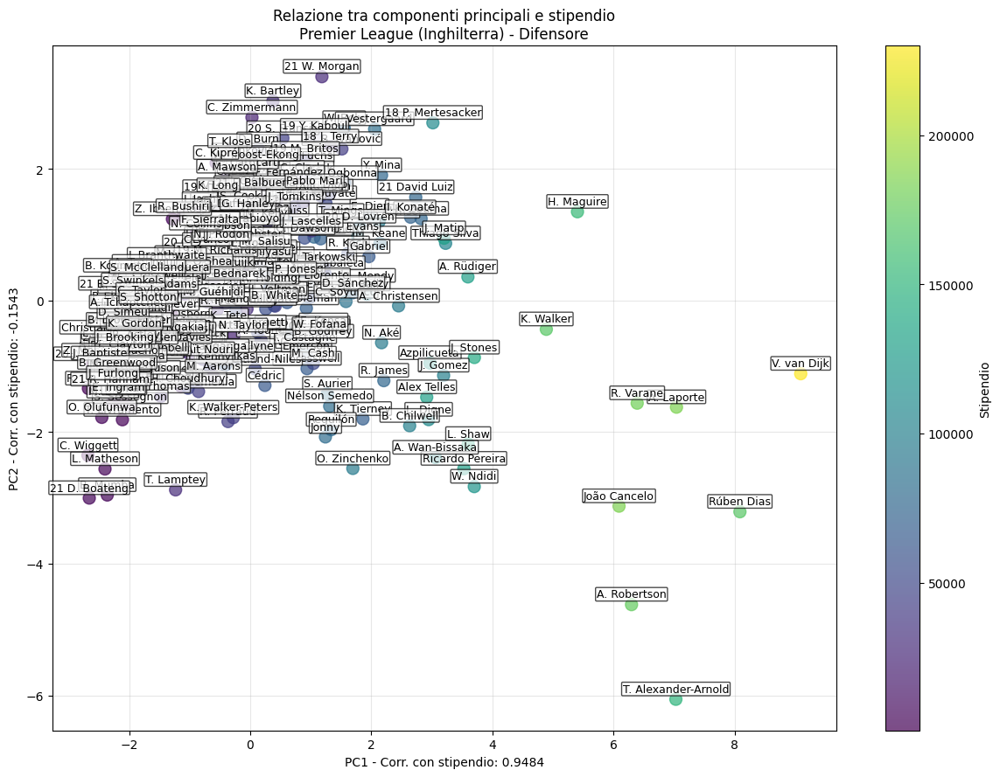


----------------------------------------
Ruolo: Centrocampista | Giocatori: 301
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9517 (correlazione positiva)
  PC7: 0.2402 (correlazione positiva)
  PC6: -0.1301 (correlazione negativa)
  PC2: -0.1150 (correlazione negativa)
  PC5: -0.0506 (correlazione negativa)
  PC3: -0.0506 (correlazione negativa)
  PC4: 0.0357 (correlazione positiva)
  PC8: -0.0012 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9517
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4835
    - Value: 0.4552
    - Release Clause: 0.4508
    - International Reputation: 0.4158
    - Age: 0.2600
    - Weight: 0.1486
    - Height: 0.0905
    - Jersey Number: -0.2917
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.2917
    - Height: 0.0905
    - Weight: 0.1486
    - Age: 0.2600
    - Interna

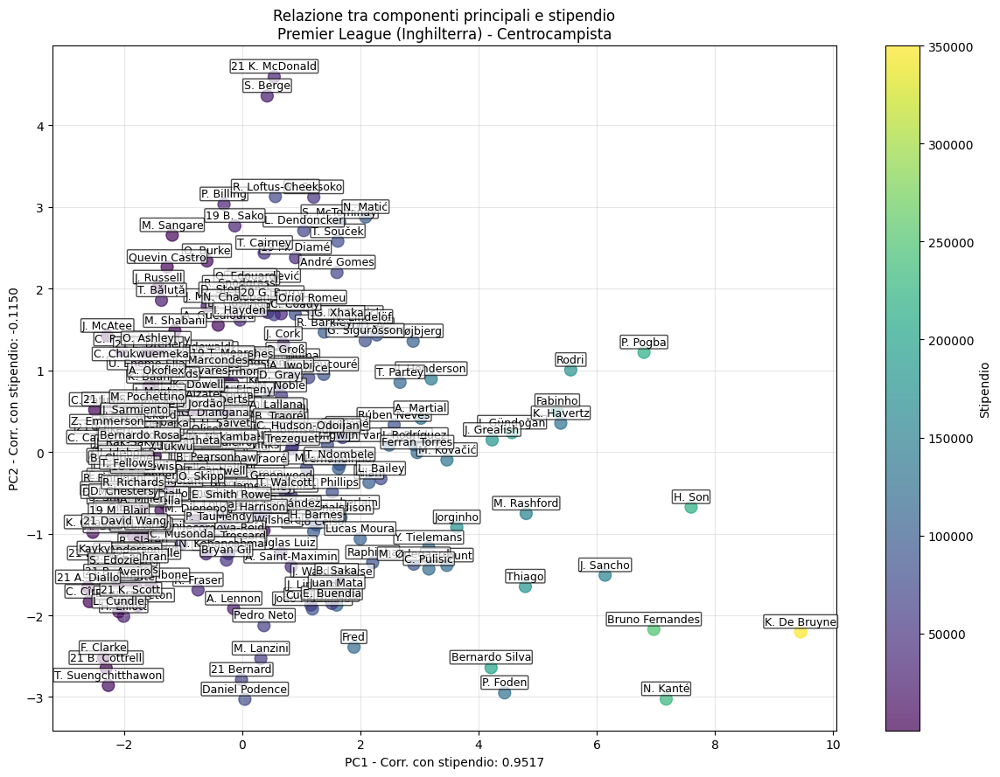


----------------------------------------
Ruolo: Attaccante | Giocatori: 119
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9573 (correlazione positiva)
  PC7: 0.2063 (correlazione positiva)
  PC2: -0.1769 (correlazione negativa)
  PC3: -0.0706 (correlazione negativa)
  PC4: 0.0561 (correlazione positiva)
  PC5: 0.0332 (correlazione positiva)
  PC6: -0.0233 (correlazione negativa)
  PC8: -0.0002 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9573
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4666
    - Value: 0.4442
    - Release Clause: 0.4424
    - International Reputation: 0.4388
    - Age: 0.3004
    - Weight: 0.1142
    - Height: 0.0448
    - Jersey Number: -0.3023
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.3023
    - Height: 0.0448
    - Weight: 0.1142
    - Age: 0.3004
    - Internationa

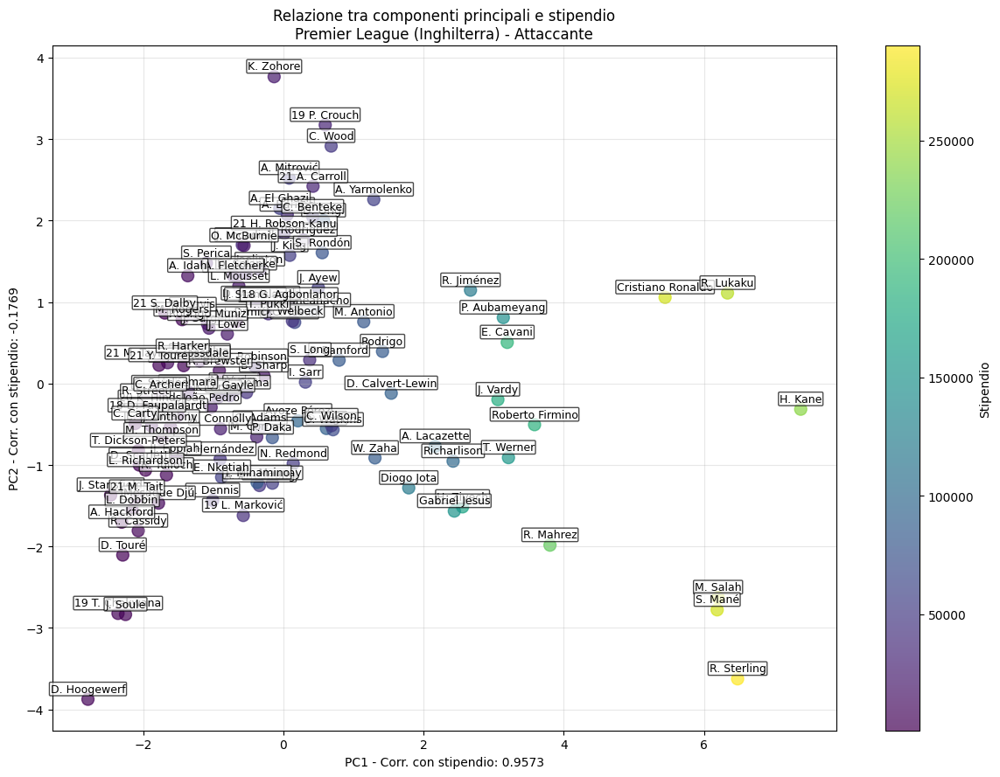



Analisi delle componenti principali correlate allo stipendio - Bundesliga (Germania)

----------------------------------------
Ruolo: Portiere | Giocatori: 65
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9218 (correlazione positiva)
  PC7: 0.2867 (correlazione positiva)
  PC4: 0.2297 (correlazione positiva)
  PC2: -0.0963 (correlazione negativa)
  PC6: 0.0571 (correlazione positiva)
  PC5: -0.0523 (correlazione negativa)
  PC3: -0.0051 (correlazione negativa)
  PC8: 0.0001 (correlazione positiva)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9218
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4621
    - Value: 0.4406
    - Release Clause: 0.4364
    - International Reputation: 0.4201
    - Age: 0.2660
    - Height: 0.1463
    - Weight: 0.0977
    - Jersey Number: -0.3518
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.

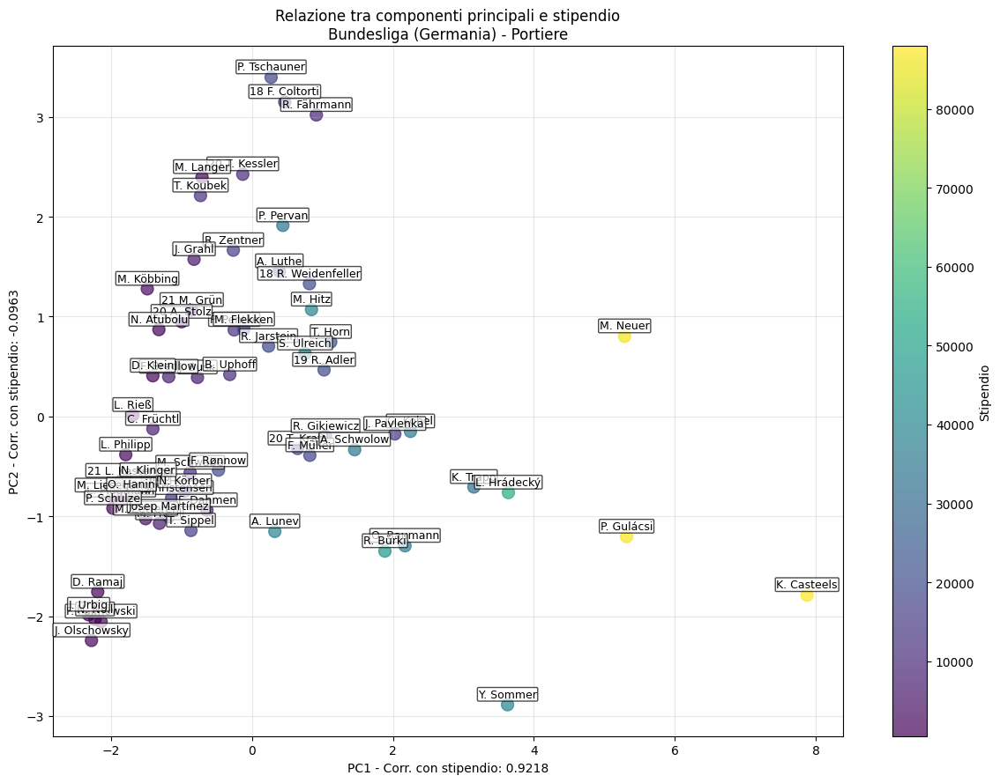


----------------------------------------
Ruolo: Difensore | Giocatori: 175
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.8949 (correlazione positiva)
  PC7: 0.3049 (correlazione positiva)
  PC2: -0.2378 (correlazione negativa)
  PC5: 0.2120 (correlazione positiva)
  PC4: 0.0600 (correlazione positiva)
  PC6: 0.0329 (correlazione positiva)
  PC3: 0.0018 (correlazione positiva)
  PC8: -0.0006 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.8949
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4694
    - Value: 0.4643
    - Release Clause: 0.4583
    - International Reputation: 0.4341
    - Weight: 0.2515
    - Age: 0.2037
    - Height: 0.1119
    - Jersey Number: -0.2199
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.2199
    - Height: 0.1119
    - Age: 0.2037
    - Weight: 0.2515
    - International R

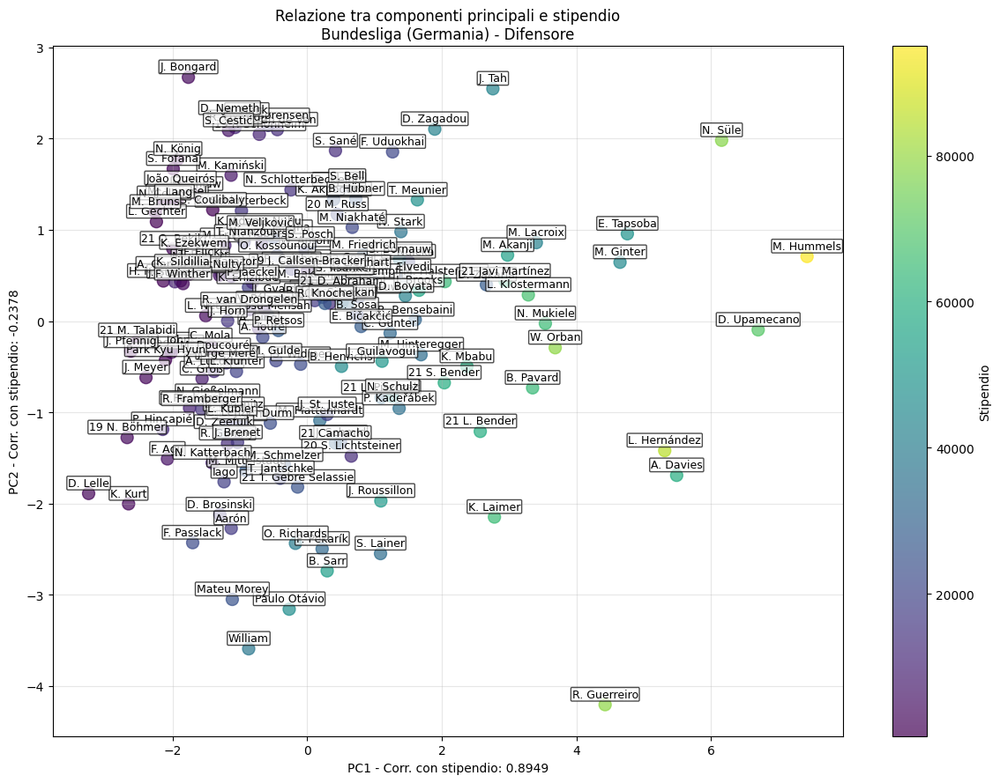


----------------------------------------
Ruolo: Centrocampista | Giocatori: 208
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9384 (correlazione positiva)
  PC7: 0.2346 (correlazione positiva)
  PC2: -0.1697 (correlazione negativa)
  PC6: -0.1658 (correlazione negativa)
  PC4: 0.0659 (correlazione positiva)
  PC3: -0.0606 (correlazione negativa)
  PC5: 0.0041 (correlazione positiva)
  PC8: -0.0007 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9384
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4686
    - International Reputation: 0.4531
    - Value: 0.4517
    - Release Clause: 0.4481
    - Age: 0.2560
    - Weight: 0.1678
    - Height: 0.1022
    - Jersey Number: -0.2572
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.2572
    - Height: 0.1022
    - Weight: 0.1678
    - Age: 0.2560
    - Release 

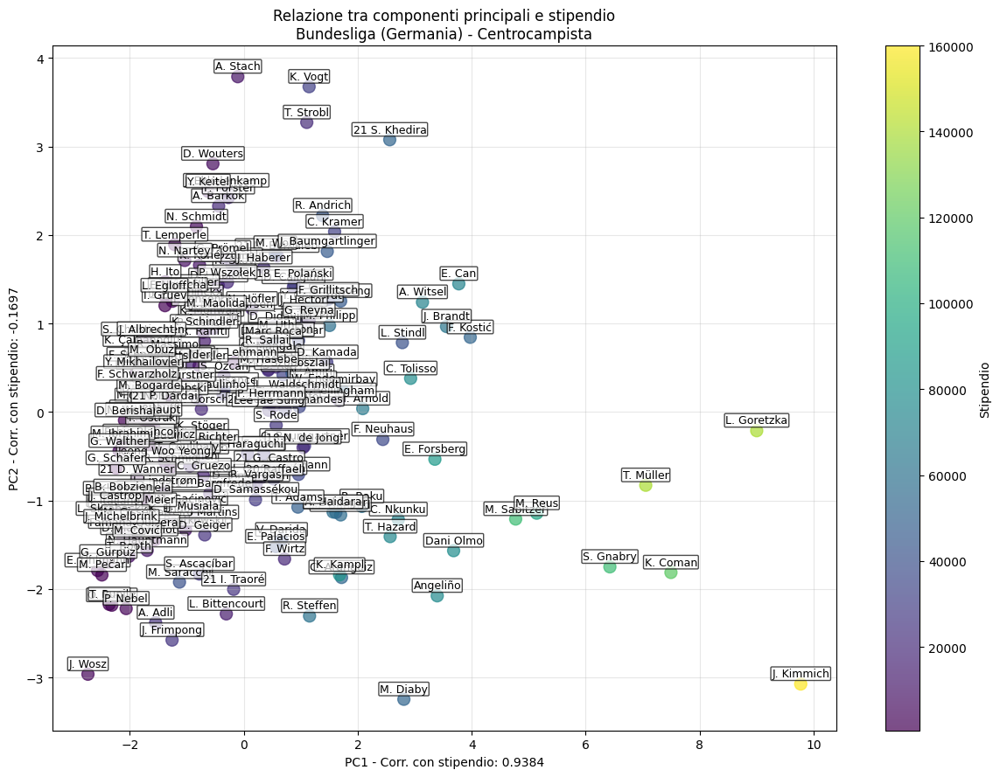


----------------------------------------
Ruolo: Attaccante | Giocatori: 90
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.8827 (correlazione positiva)
  PC2: -0.2869 (correlazione negativa)
  PC6: -0.2557 (correlazione negativa)
  PC7: 0.2055 (correlazione positiva)
  PC5: -0.1381 (correlazione negativa)
  PC3: 0.1019 (correlazione positiva)
  PC4: 0.0390 (correlazione positiva)
  PC8: -0.0007 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.8827
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4494
    - Value: 0.4431
    - Release Clause: 0.4401
    - International Reputation: 0.4401
    - Weight: 0.2623
    - Age: 0.2106
    - Height: 0.1996
    - Jersey Number: -0.2477
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.2477
    - Height: 0.1996
    - Age: 0.2106
    - Weight: 0.2623
    - International

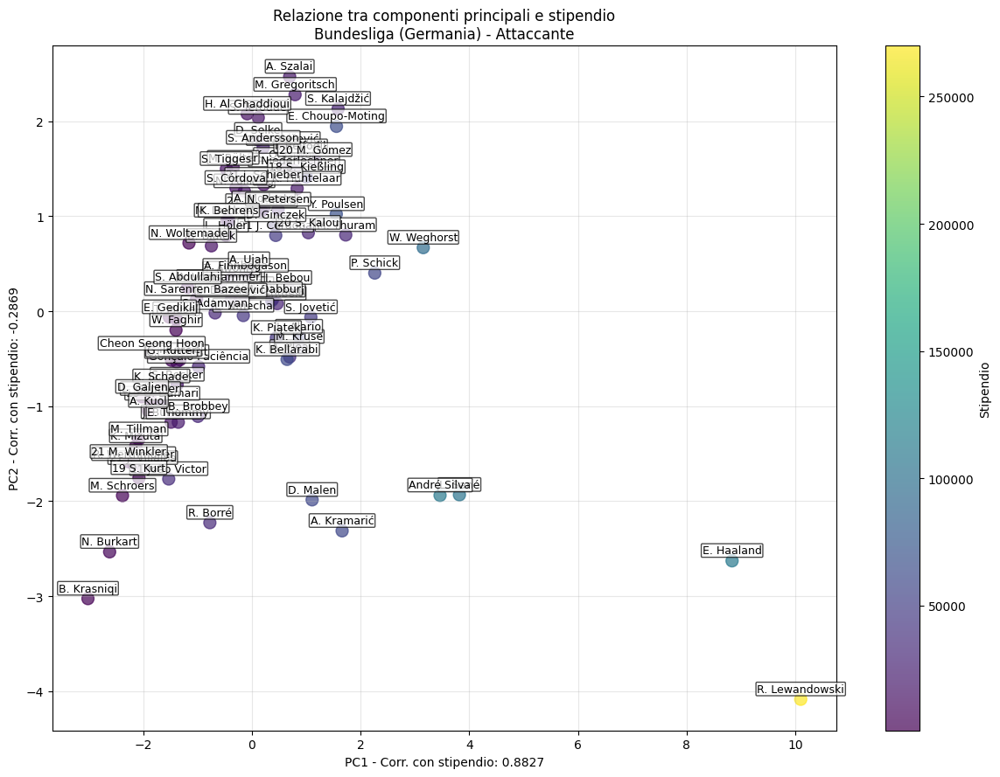



Analisi delle componenti principali correlate allo stipendio - LaLiga (Spagna)

----------------------------------------
Ruolo: Portiere | Giocatori: 28
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.8897 (correlazione positiva)
  PC6: 0.3449 (correlazione positiva)
  PC2: -0.2211 (correlazione negativa)
  PC5: 0.1905 (correlazione positiva)
  PC4: -0.0511 (correlazione negativa)
  PC3: 0.0309 (correlazione positiva)
  PC7: 0.0277 (correlazione positiva)
  PC8: -0.0000 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.8897
  Feature con loading positivo (importanza decrescente):
    - Value: 0.4441
    - Release Clause: 0.4441
    - International Reputation: 0.4317
    - Wage: 0.4162
    - Age: 0.2795
    - Weight: 0.2687
    - Height: 0.0935
    - Jersey Number: -0.2949
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.2949
 

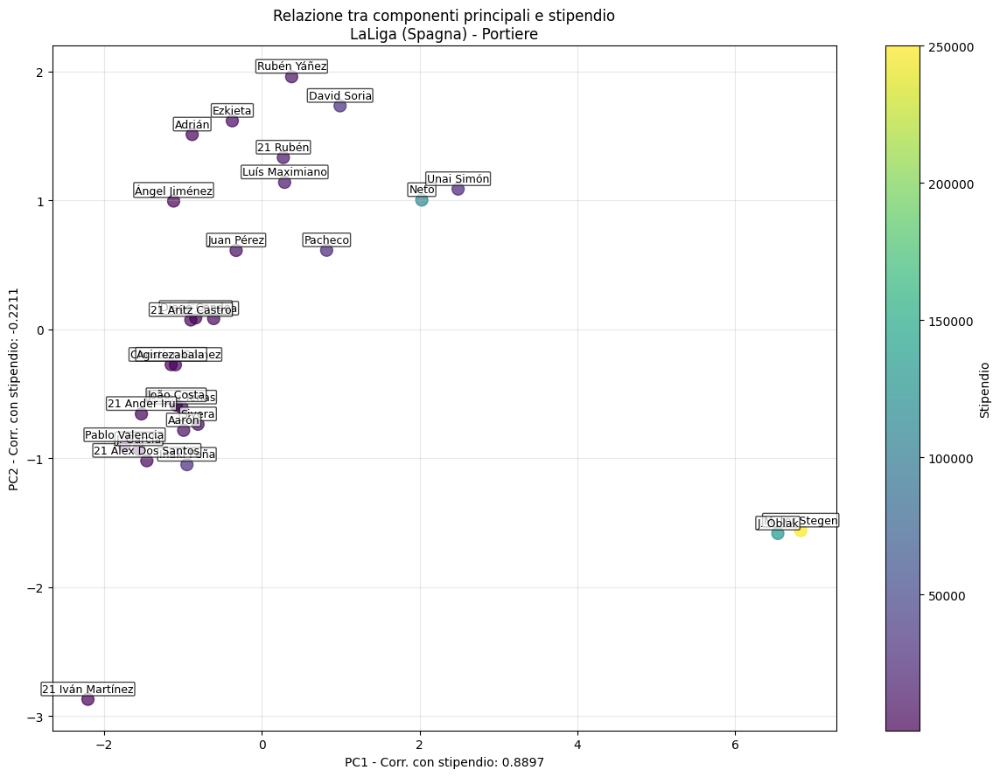


----------------------------------------
Ruolo: Difensore | Giocatori: 85
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.8763 (correlazione positiva)
  PC7: 0.3235 (correlazione positiva)
  PC4: 0.2582 (correlazione positiva)
  PC5: -0.1725 (correlazione negativa)
  PC2: -0.1318 (correlazione negativa)
  PC3: -0.1111 (correlazione negativa)
  PC6: -0.0354 (correlazione negativa)
  PC8: -0.0001 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.8763
  Feature con loading positivo (importanza decrescente):
    - Value: 0.4806
    - Wage: 0.4789
    - Release Clause: 0.4763
    - International Reputation: 0.4147
    - Age: 0.2393
    - Weight: 0.1460
    - Height: 0.0896
    - Jersey Number: -0.2328
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.2328
    - Height: 0.0896
    - Weight: 0.1460
    - Age: 0.2393
    - International

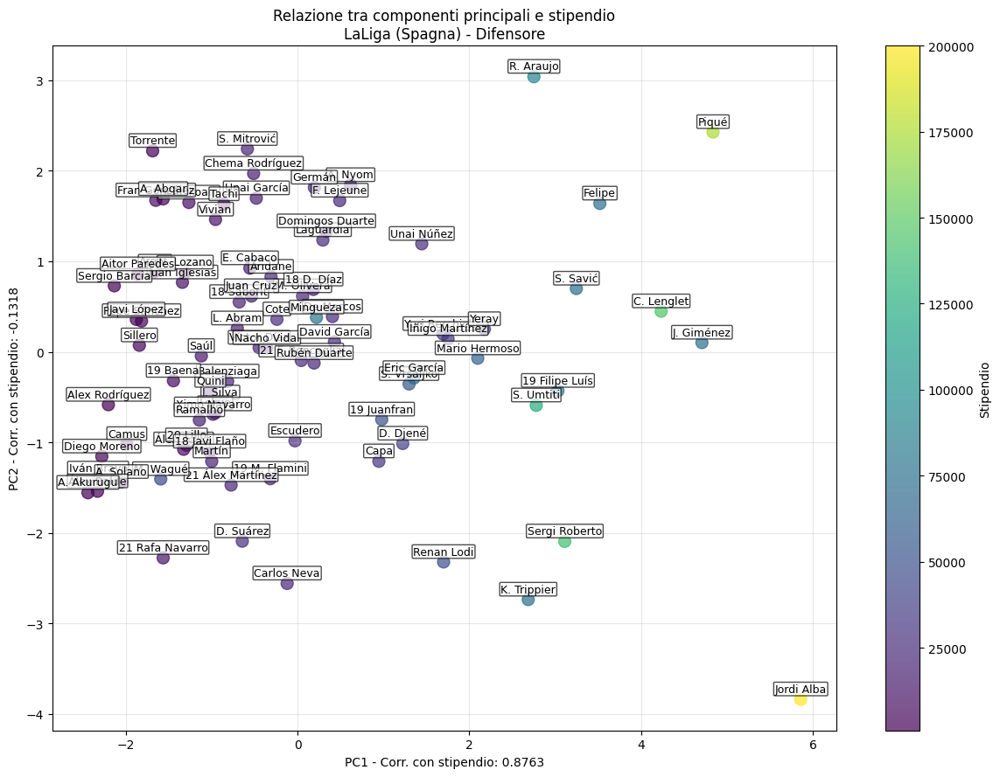


----------------------------------------
Ruolo: Centrocampista | Giocatori: 88
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9004 (correlazione positiva)
  PC7: 0.3391 (correlazione positiva)
  PC4: 0.1846 (correlazione positiva)
  PC5: -0.1454 (correlazione negativa)
  PC2: -0.1317 (correlazione negativa)
  PC3: 0.0378 (correlazione positiva)
  PC6: 0.0163 (correlazione positiva)
  PC8: -0.0002 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9004
  Feature con loading positivo (importanza decrescente):
    - Value: 0.4854
    - Release Clause: 0.4812
    - Wage: 0.4759
    - International Reputation: 0.4458
    - Age: 0.1671
    - Weight: 0.0512
    - Height: 0.0474
    - Jersey Number: -0.2735
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.2735
    - Height: 0.0474
    - Weight: 0.0512
    - Age: 0.1671
    - Internatio

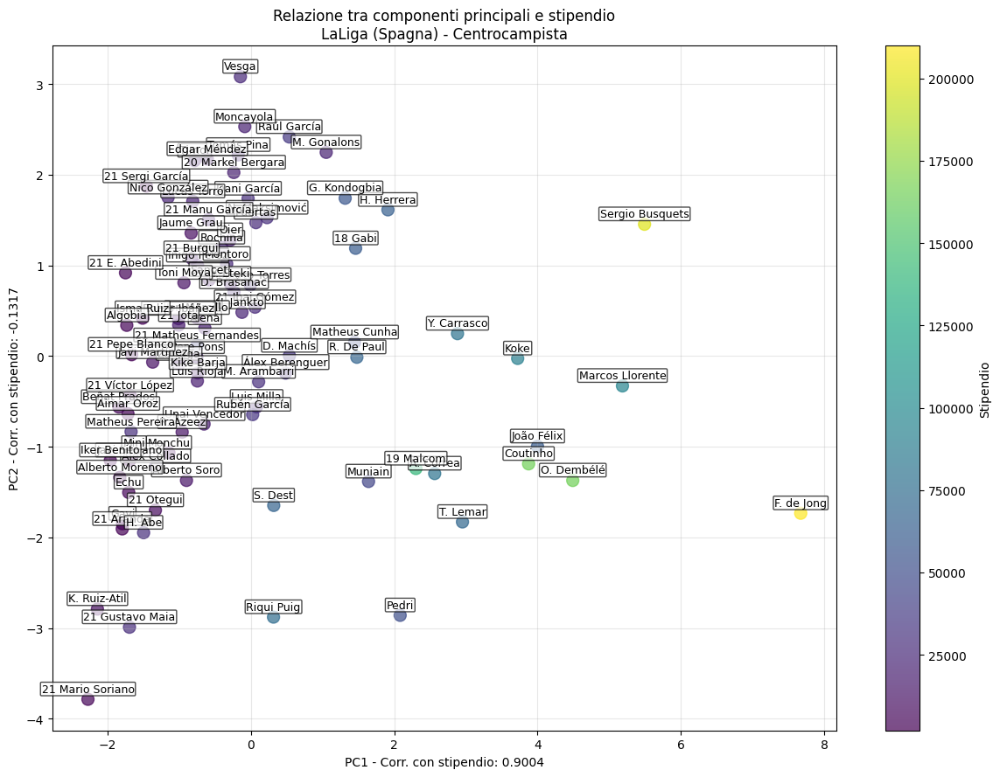


----------------------------------------
Ruolo: Attaccante | Giocatori: 37
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9241 (correlazione positiva)
  PC7: 0.2596 (correlazione positiva)
  PC6: -0.2005 (correlazione negativa)
  PC3: 0.1447 (correlazione positiva)
  PC2: -0.1131 (correlazione negativa)
  PC4: 0.0605 (correlazione positiva)
  PC5: 0.0329 (correlazione positiva)
  PC8: -0.0014 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9241
  Feature con loading positivo (importanza decrescente):
    - Value: 0.4668
    - Release Clause: 0.4636
    - Wage: 0.4572
    - International Reputation: 0.3945
    - Age: 0.2386
    - Weight: -0.0208
    - Jersey Number: -0.2614
    - Height: -0.2770
  Feature con loading negativo (importanza decrescente):
    - Height: -0.2770
    - Jersey Number: -0.2614
    - Weight: -0.0208
    - Age: 0.2386
    - Internatio

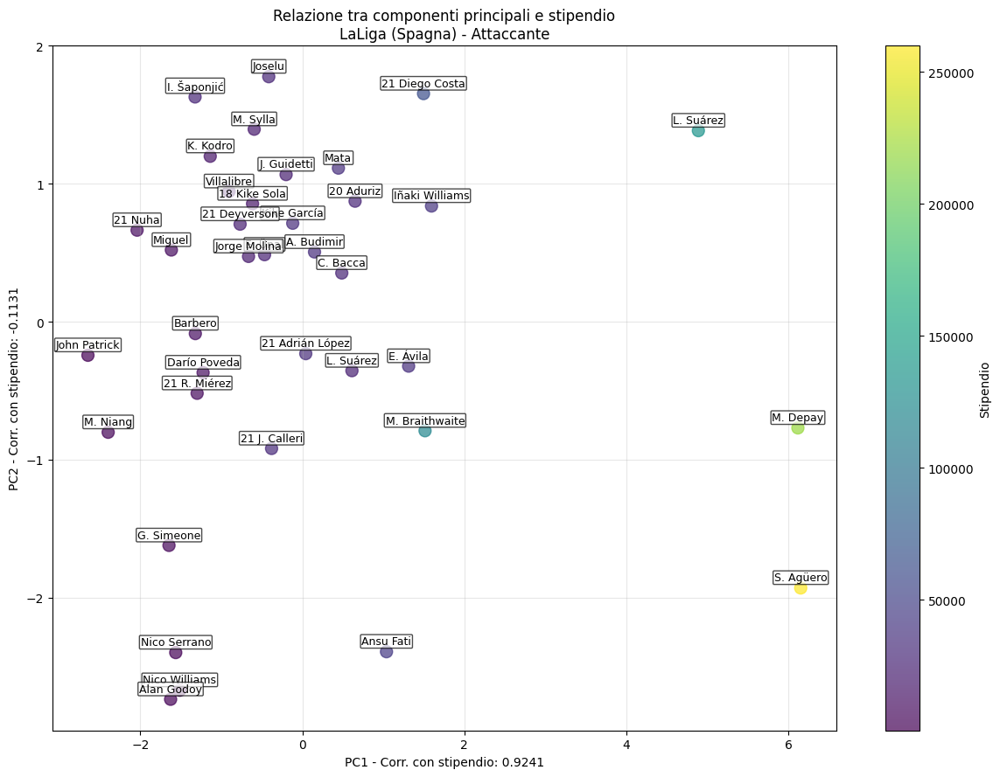



Analisi delle componenti principali correlate allo stipendio - Ligue 1 (Francia)

----------------------------------------
Ruolo: Portiere | Giocatori: 69
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.8560 (correlazione positiva)
  PC6: 0.3889 (correlazione positiva)
  PC3: -0.2081 (correlazione negativa)
  PC5: -0.2000 (correlazione negativa)
  PC7: -0.1346 (correlazione negativa)
  PC4: -0.0902 (correlazione negativa)
  PC2: 0.0802 (correlazione positiva)
  PC8: -0.0001 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.8560
  Feature con loading positivo (importanza decrescente):
    - Value: 0.4841
    - Release Clause: 0.4832
    - Wage: 0.4776
    - International Reputation: 0.4014
    - Weight: 0.2851
    - Age: 0.1889
    - Height: 0.1611
    - Jersey Number: -0.0109
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.01

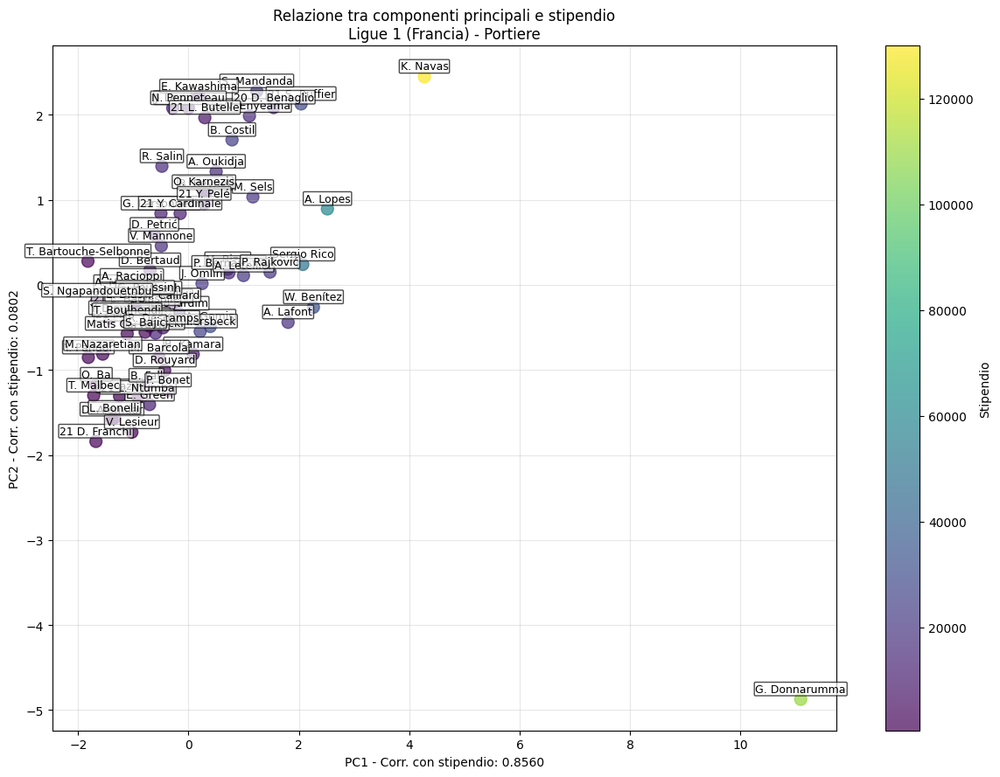


----------------------------------------
Ruolo: Difensore | Giocatori: 208
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9300 (correlazione positiva)
  PC7: 0.3161 (correlazione positiva)
  PC2: -0.1501 (correlazione negativa)
  PC4: 0.0849 (correlazione positiva)
  PC3: 0.0684 (correlazione positiva)
  PC5: -0.0210 (correlazione negativa)
  PC6: -0.0162 (correlazione negativa)
  PC8: -0.0003 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9300
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.5084
    - Value: 0.4878
    - Release Clause: 0.4848
    - International Reputation: 0.4128
    - Age: 0.1875
    - Weight: 0.1305
    - Height: 0.0716
    - Jersey Number: -0.2023
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.2023
    - Height: 0.0716
    - Weight: 0.1305
    - Age: 0.1875
    - International

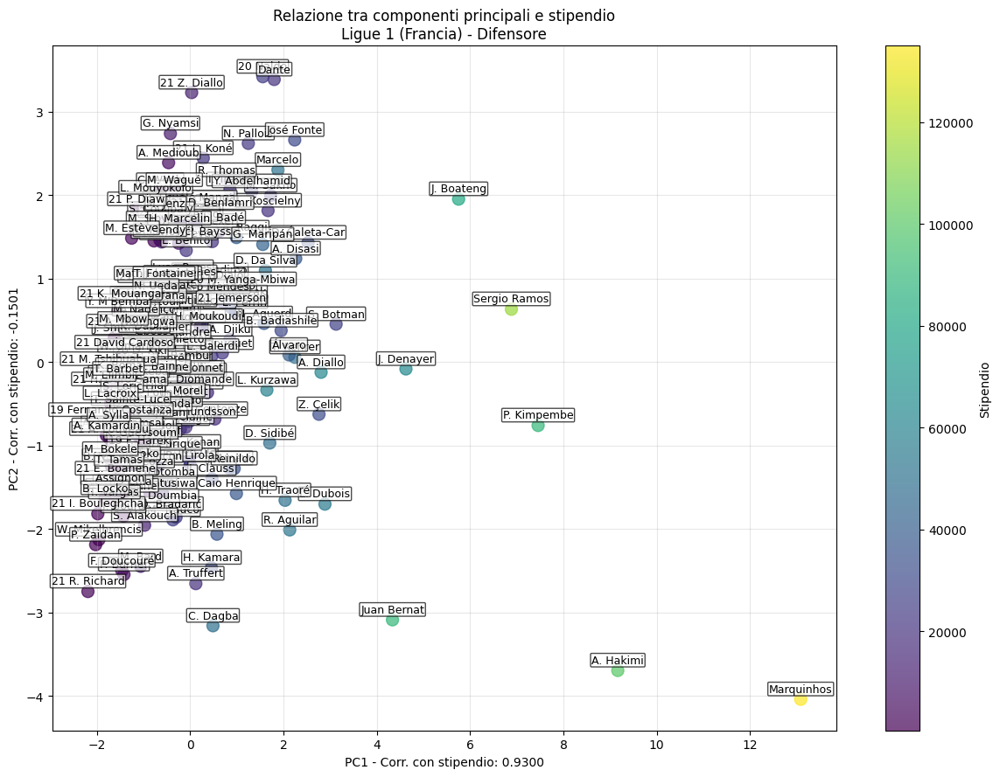


----------------------------------------
Ruolo: Centrocampista | Giocatori: 240
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9138 (correlazione positiva)
  PC7: 0.3117 (correlazione positiva)
  PC4: 0.2203 (correlazione positiva)
  PC5: -0.1074 (correlazione negativa)
  PC3: -0.0624 (correlazione negativa)
  PC2: -0.0549 (correlazione negativa)
  PC6: -0.0281 (correlazione negativa)
  PC8: -0.0017 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9138
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4866
    - Value: 0.4668
    - Release Clause: 0.4602
    - International Reputation: 0.4312
    - Age: 0.2633
    - Weight: 0.0713
    - Height: -0.0107
    - Jersey Number: -0.2702
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.2702
    - Height: -0.0107
    - Weight: 0.0713
    - Age: 0.2633
    - Inter

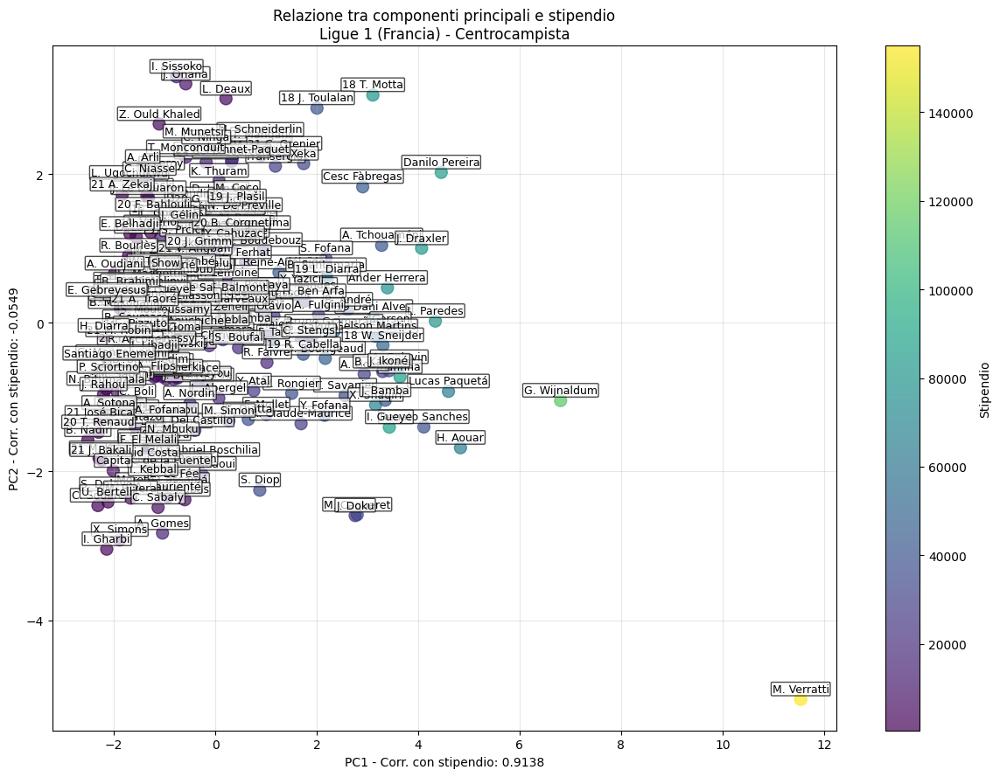


----------------------------------------
Ruolo: Attaccante | Giocatori: 96
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9496 (correlazione positiva)
  PC7: 0.2367 (correlazione positiva)
  PC4: 0.1184 (correlazione positiva)
  PC6: 0.1043 (correlazione positiva)
  PC3: -0.0973 (correlazione negativa)
  PC2: -0.0806 (correlazione negativa)
  PC5: -0.0378 (correlazione negativa)
  PC8: -0.0004 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9496
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4885
    - Value: 0.4739
    - Release Clause: 0.4710
    - International Reputation: 0.4645
    - Age: 0.2435
    - Weight: -0.0052
    - Height: -0.0882
    - Jersey Number: -0.1789
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.1789
    - Height: -0.0882
    - Weight: -0.0052
    - Age: 0.2435
    - Internati

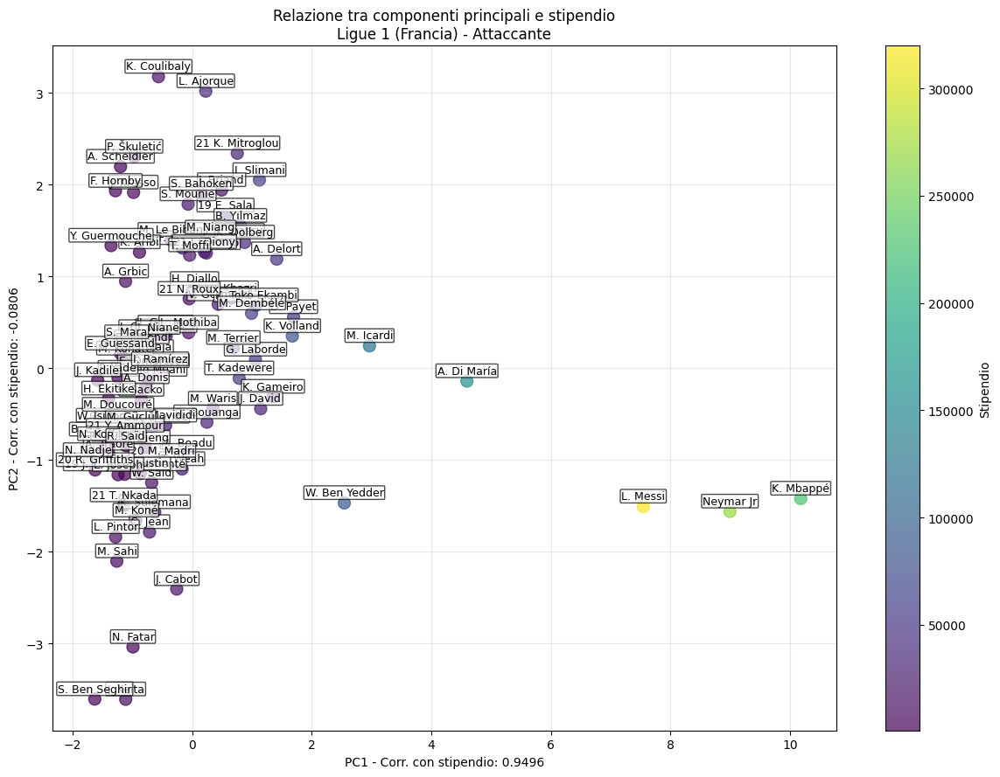



Analisi delle componenti principali correlate allo stipendio - Serie A (Italia)

----------------------------------------
Ruolo: Portiere | Giocatori: 74
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.8502 (correlazione positiva)
  PC7: 0.3384 (correlazione positiva)
  PC5: -0.2433 (correlazione negativa)
  PC4: 0.2114 (correlazione positiva)
  PC3: -0.2054 (correlazione negativa)
  PC6: -0.1278 (correlazione negativa)
  PC2: -0.0149 (correlazione negativa)
  PC8: -0.0007 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.8502
  Feature con loading positivo (importanza decrescente):
    - Value: 0.4892
    - Wage: 0.4847
    - Release Clause: 0.4838
    - International Reputation: 0.3562
    - Weight: 0.2483
    - Height: 0.1287
    - Age: 0.1212
    - Jersey Number: -0.2681
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.268

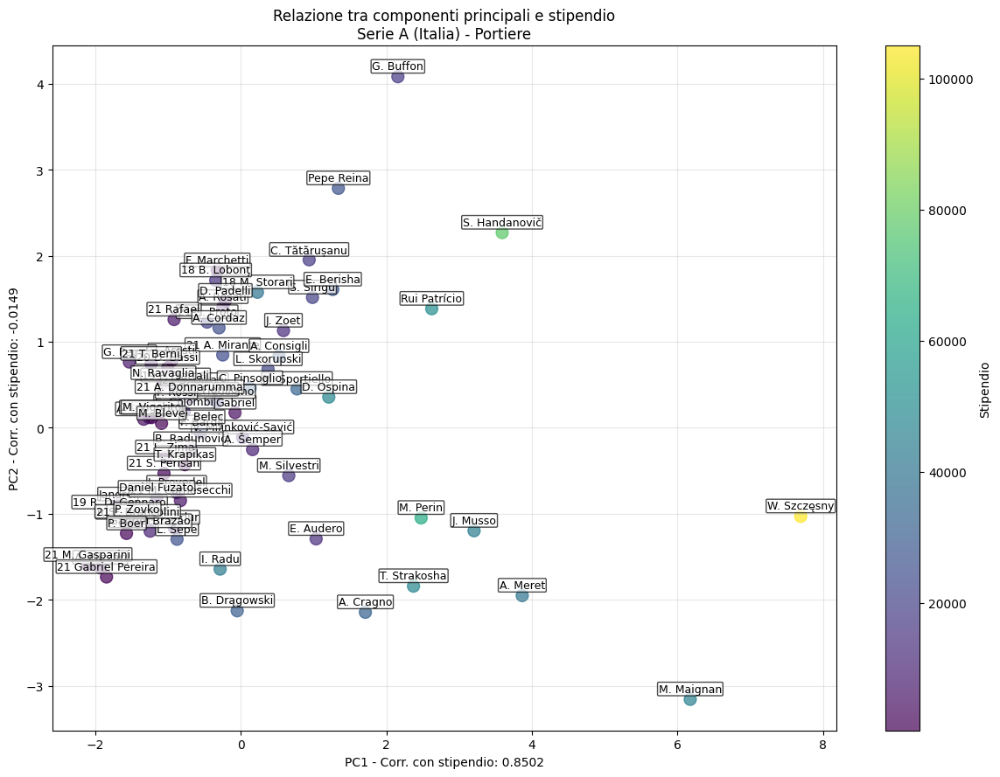


----------------------------------------
Ruolo: Difensore | Giocatori: 212
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9042 (correlazione positiva)
  PC7: 0.3723 (correlazione positiva)
  PC5: -0.1170 (correlazione negativa)
  PC2: -0.1080 (correlazione negativa)
  PC6: 0.0873 (correlazione positiva)
  PC4: 0.0811 (correlazione positiva)
  PC3: 0.0654 (correlazione positiva)
  PC8: -0.0007 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9042
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4991
    - Value: 0.4989
    - Release Clause: 0.4927
    - International Reputation: 0.4483
    - Age: 0.1594
    - Weight: 0.1321
    - Height: 0.0776
    - Jersey Number: -0.0972
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.0972
    - Height: 0.0776
    - Weight: 0.1321
    - Age: 0.1594
    - International 

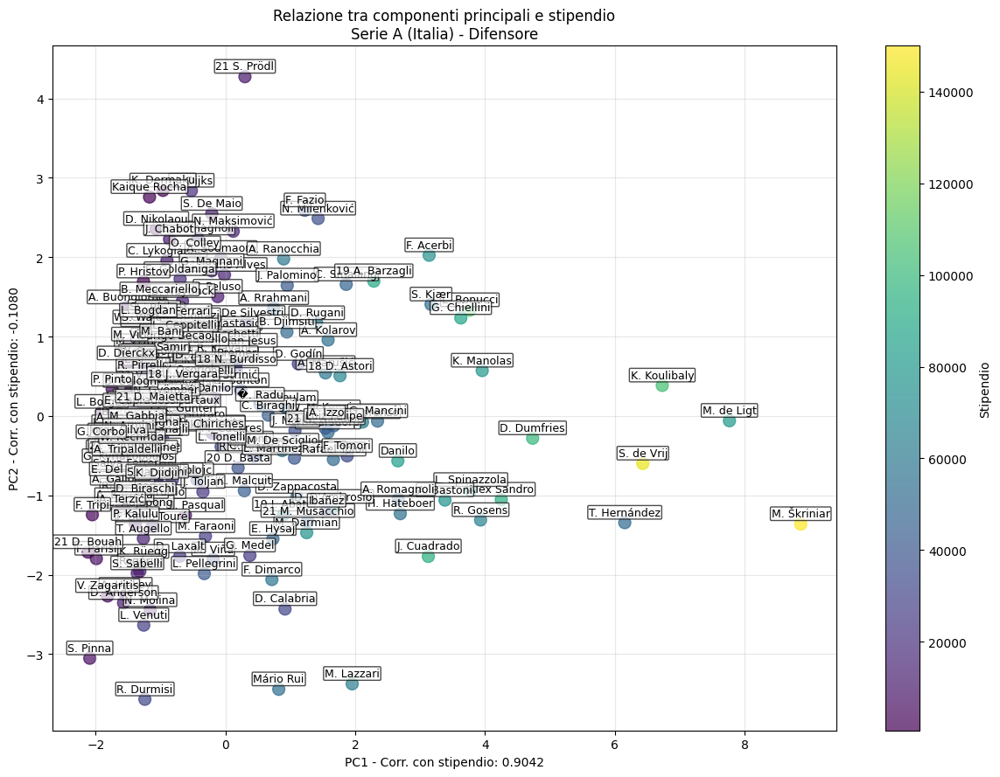


----------------------------------------
Ruolo: Centrocampista | Giocatori: 234
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9112 (correlazione positiva)
  PC7: 0.3319 (correlazione positiva)
  PC2: -0.1677 (correlazione negativa)
  PC6: -0.1635 (correlazione negativa)
  PC4: 0.0631 (correlazione positiva)
  PC5: 0.0269 (correlazione positiva)
  PC3: -0.0025 (correlazione negativa)
  PC8: -0.0005 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9112
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4884
    - Value: 0.4717
    - Release Clause: 0.4666
    - International Reputation: 0.4268
    - Age: 0.2689
    - Weight: 0.1483
    - Height: 0.1116
    - Jersey Number: -0.1798
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.1798
    - Height: 0.1116
    - Weight: 0.1483
    - Age: 0.2689
    - Internat

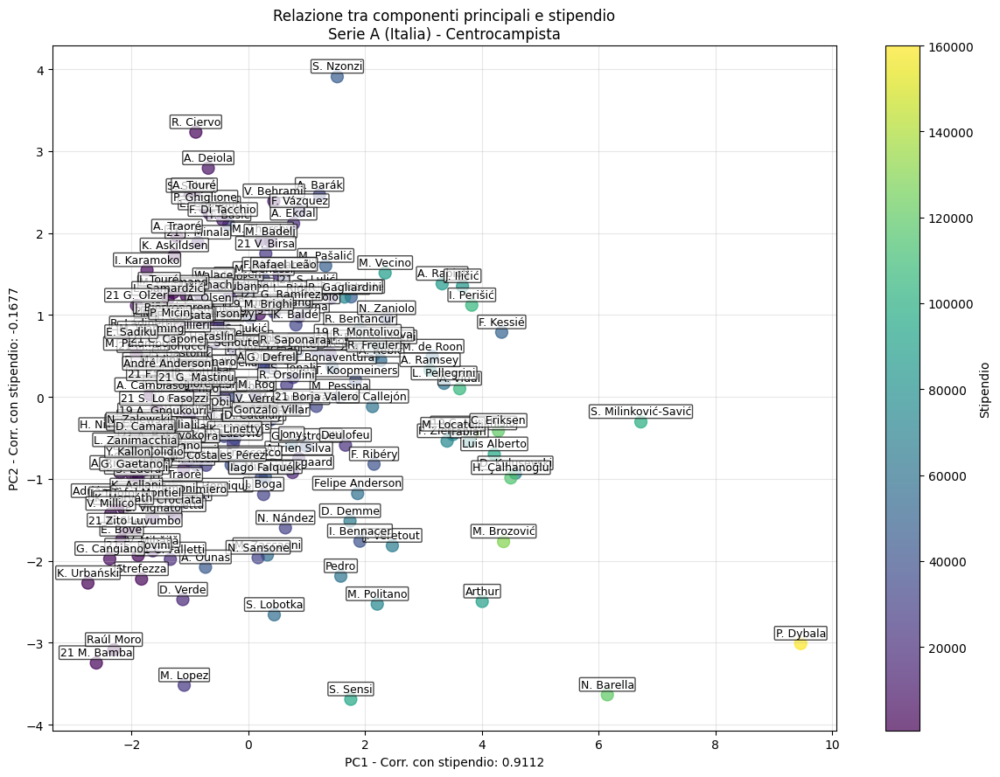


----------------------------------------
Ruolo: Attaccante | Giocatori: 111
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9376 (correlazione positiva)
  PC7: 0.2564 (correlazione positiva)
  PC6: 0.1836 (correlazione positiva)
  PC4: 0.1041 (correlazione positiva)
  PC3: -0.0971 (correlazione negativa)
  PC5: -0.0271 (correlazione negativa)
  PC2: -0.0217 (correlazione negativa)
  PC8: -0.0005 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9376
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4987
    - Value: 0.4952
    - Release Clause: 0.4913
    - International Reputation: 0.4289
    - Age: 0.1676
    - Weight: -0.0477
    - Height: -0.1320
    - Jersey Number: -0.1816
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.1816
    - Height: -0.1320
    - Weight: -0.0477
    - Age: 0.1676
    - Internat

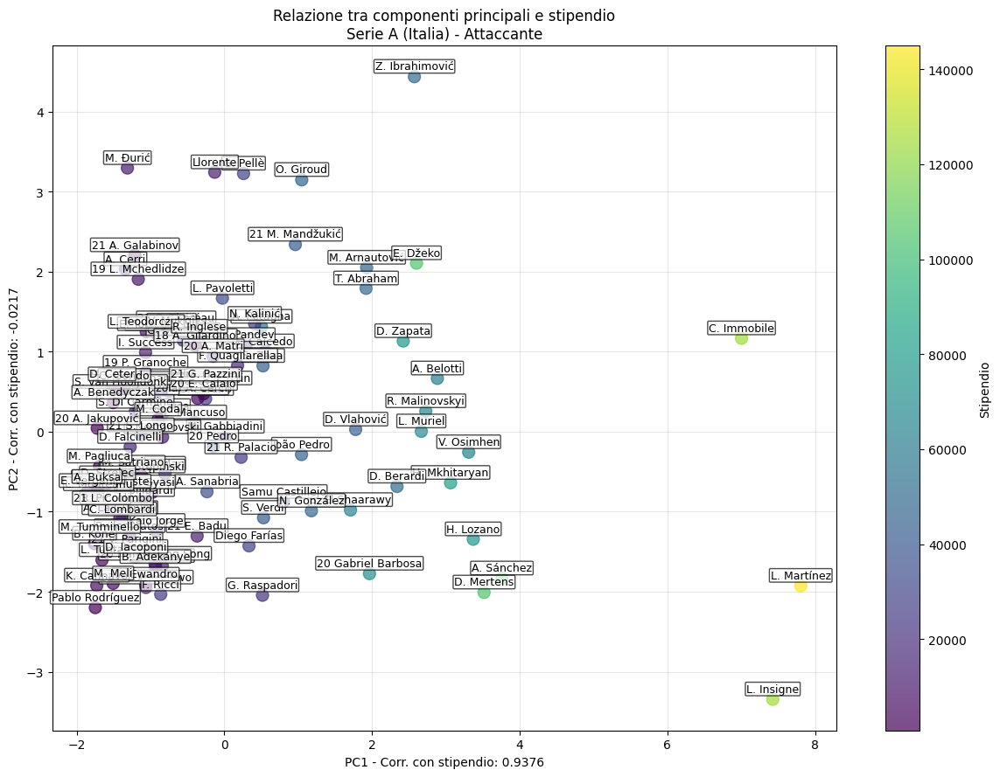



Analisi delle componenti principali correlate allo stipendio - Eredivisie (Paesi Bassi)

----------------------------------------
Ruolo: Portiere | Giocatori: 53
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9132 (correlazione positiva)
  PC7: 0.2961 (correlazione positiva)
  PC3: -0.1790 (correlazione negativa)
  PC6: -0.1381 (correlazione negativa)
  PC5: 0.1140 (correlazione positiva)
  PC4: 0.0964 (correlazione positiva)
  PC2: 0.0701 (correlazione positiva)
  PC8: -0.0002 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9132
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4857
    - Value: 0.4736
    - Release Clause: 0.4666
    - International Reputation: 0.4433
    - Weight: 0.2371
    - Age: 0.1694
    - Height: 0.0770
    - Jersey Number: -0.1862
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: 

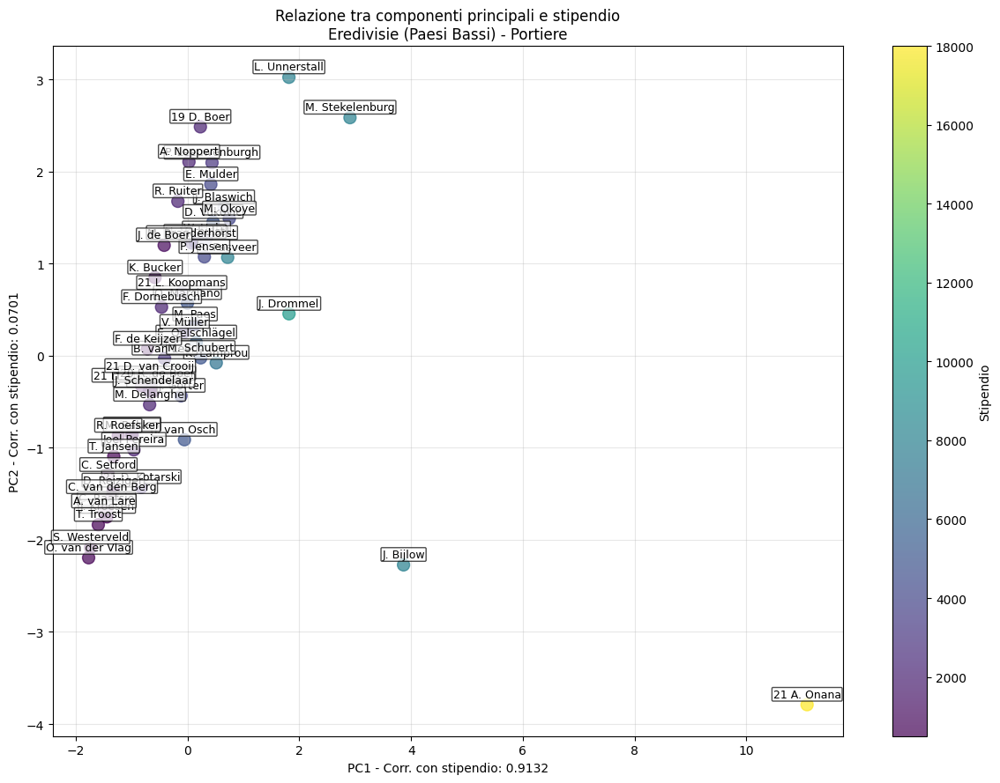


----------------------------------------
Ruolo: Difensore | Giocatori: 137
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.8773 (correlazione positiva)
  PC7: 0.2853 (correlazione positiva)
  PC5: -0.2366 (correlazione negativa)
  PC2: 0.2036 (correlazione positiva)
  PC6: -0.1810 (correlazione negativa)
  PC3: 0.1269 (correlazione positiva)
  PC4: 0.0514 (correlazione positiva)
  PC8: -0.0012 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.8773
  Feature con loading positivo (importanza decrescente):
    - Value: 0.5095
    - Release Clause: 0.4995
    - Wage: 0.4837
    - International Reputation: 0.4164
    - Age: 0.1600
    - Jersey Number: -0.1030
    - Height: -0.1338
    - Weight: -0.1718
  Feature con loading negativo (importanza decrescente):
    - Weight: -0.1718
    - Height: -0.1338
    - Jersey Number: -0.1030
    - Age: 0.1600
    - Internatio

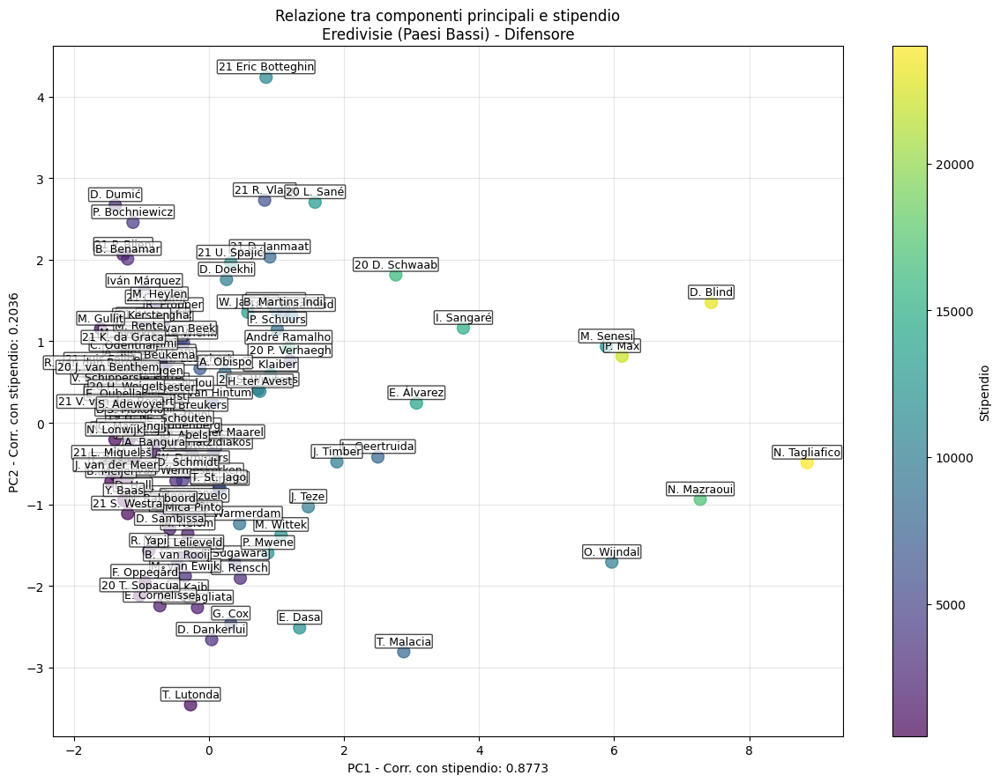


----------------------------------------
Ruolo: Centrocampista | Giocatori: 178
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.8909 (correlazione positiva)
  PC7: 0.3548 (correlazione positiva)
  PC5: -0.2117 (correlazione negativa)
  PC3: 0.1405 (correlazione positiva)
  PC4: 0.1145 (correlazione positiva)
  PC6: 0.0523 (correlazione positiva)
  PC2: -0.0040 (correlazione negativa)
  PC8: -0.0008 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.8909
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.5084
    - Value: 0.5004
    - Release Clause: 0.4871
    - International Reputation: 0.4025
    - Age: 0.2333
    - Weight: 0.0960
    - Height: 0.0677
    - Jersey Number: -0.1535
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.1535
    - Height: 0.0677
    - Weight: 0.0960
    - Age: 0.2333
    - Internati

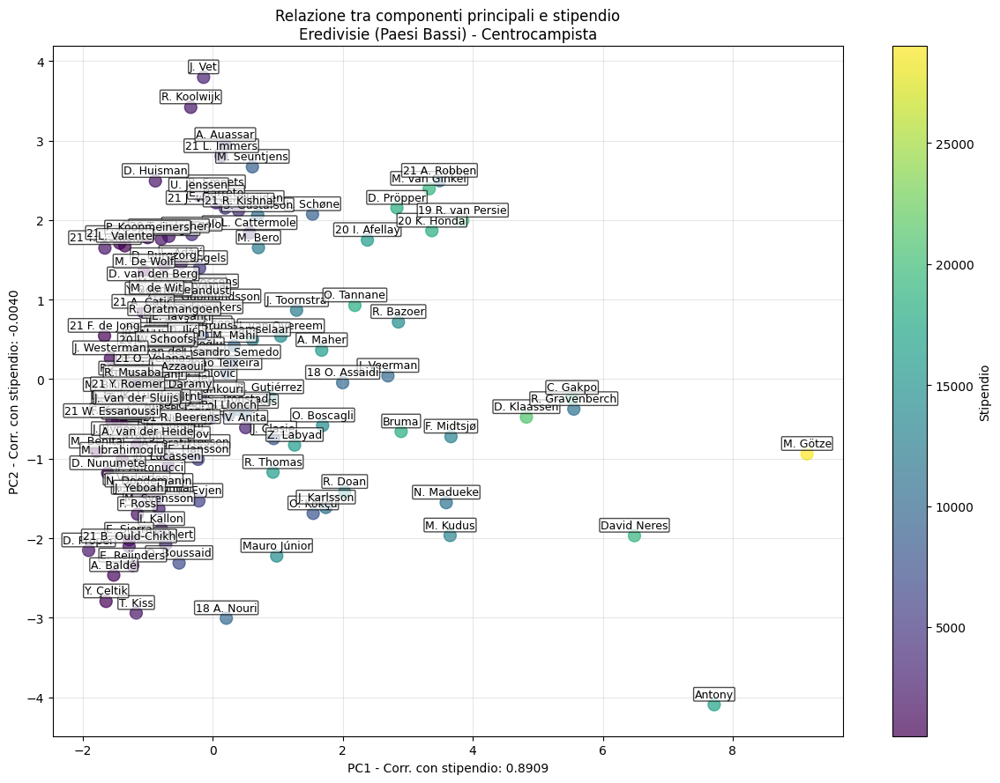


----------------------------------------
Ruolo: Attaccante | Giocatori: 70
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9354 (correlazione positiva)
  PC7: 0.2916 (correlazione positiva)
  PC6: 0.1179 (correlazione positiva)
  PC2: -0.1117 (correlazione negativa)
  PC3: 0.0905 (correlazione positiva)
  PC5: -0.0730 (correlazione negativa)
  PC4: 0.0085 (correlazione positiva)
  PC8: -0.0017 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9354
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.4848
    - Value: 0.4765
    - Release Clause: 0.4659
    - International Reputation: 0.4428
    - Age: 0.2849
    - Weight: 0.0636
    - Height: 0.0497
    - Jersey Number: -0.1926
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.1926
    - Height: 0.0497
    - Weight: 0.0636
    - Age: 0.2849
    - International 

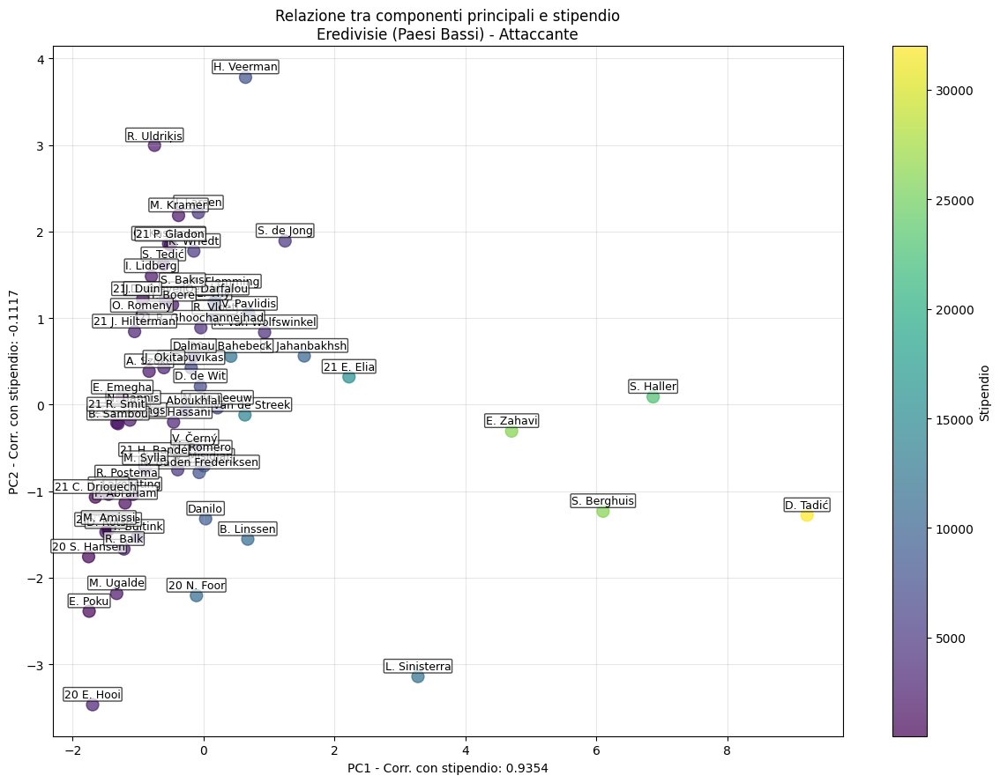



Analisi delle componenti principali correlate allo stipendio - Primeira Liga (Portogallo)

----------------------------------------
Ruolo: Portiere | Giocatori: 51
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9243 (correlazione positiva)
  PC7: 0.2812 (correlazione positiva)
  PC5: -0.1518 (correlazione negativa)
  PC3: 0.1408 (correlazione positiva)
  PC4: 0.1020 (correlazione positiva)
  PC2: -0.0967 (correlazione negativa)
  PC6: -0.0635 (correlazione negativa)
  PC8: -0.0001 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9243
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.5474
    - Value: 0.5289
    - Release Clause: 0.5242
    - Age: 0.2499
    - International Reputation: 0.1084
    - Weight: 0.0773
    - Height: 0.0371
    - Jersey Number: -0.2535
  Feature con loading negativo (importanza decrescente):
    - Jersey Numbe

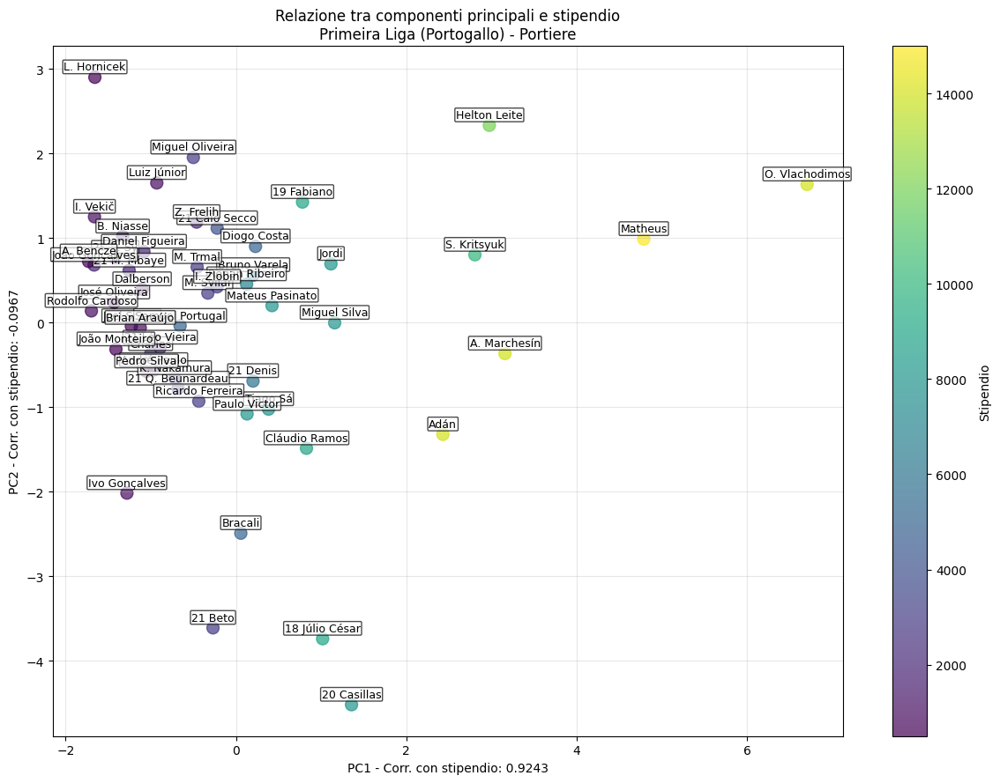


----------------------------------------
Ruolo: Difensore | Giocatori: 138
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.8872 (correlazione positiva)
  PC7: 0.2948 (correlazione positiva)
  PC2: -0.2665 (correlazione negativa)
  PC5: -0.1855 (correlazione negativa)
  PC4: 0.1096 (correlazione positiva)
  PC6: 0.0725 (correlazione positiva)
  PC3: 0.0579 (correlazione positiva)
  PC8: -0.0003 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.8872
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.5030
    - Value: 0.4675
    - Release Clause: 0.4596
    - International Reputation: 0.3139
    - Age: 0.2949
    - Weight: 0.2274
    - Height: 0.1842
    - Jersey Number: -0.2146
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.2146
    - Height: 0.1842
    - Weight: 0.2274
    - Age: 0.2949
    - International 

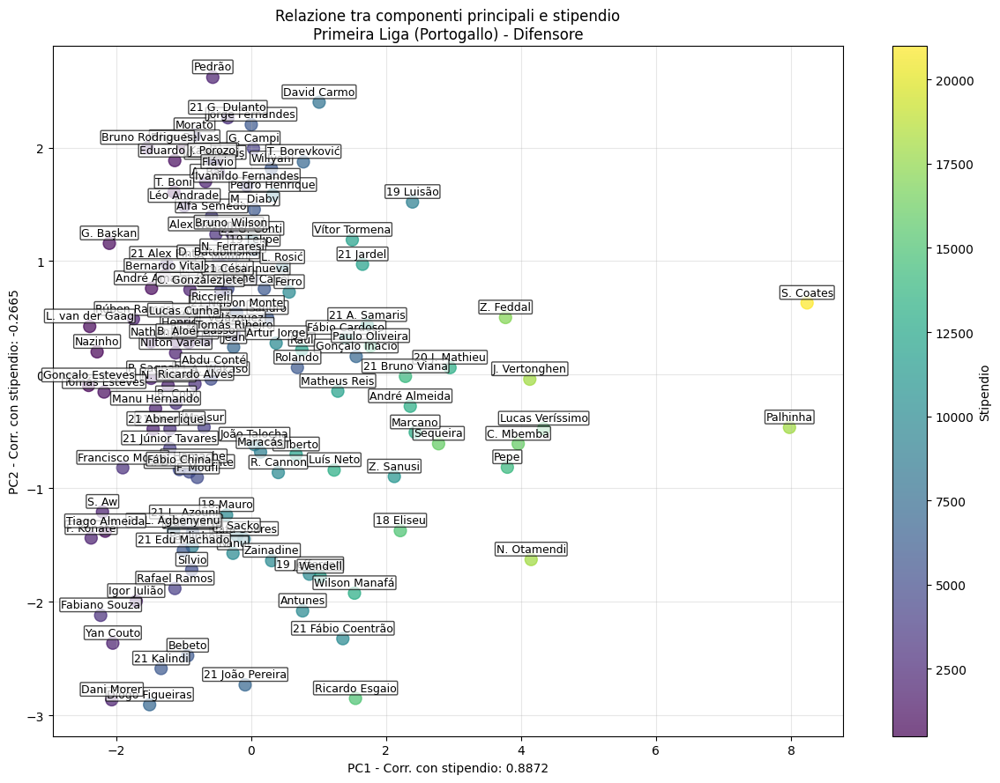


----------------------------------------
Ruolo: Centrocampista | Giocatori: 146
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9291 (correlazione positiva)
  PC6: 0.2430 (correlazione positiva)
  PC7: -0.1897 (correlazione negativa)
  PC5: -0.1795 (correlazione negativa)
  PC2: 0.0910 (correlazione positiva)
  PC3: -0.0245 (correlazione negativa)
  PC4: 0.0235 (correlazione positiva)
  PC8: -0.0005 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9291
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.5278
    - Value: 0.5224
    - Release Clause: 0.5203
    - International Reputation: 0.3424
    - Age: 0.1806
    - Weight: -0.0131
    - Height: -0.0314
    - Jersey Number: -0.1637
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.1637
    - Height: -0.0314
    - Weight: -0.0131
    - Age: 0.1806
    - Inte

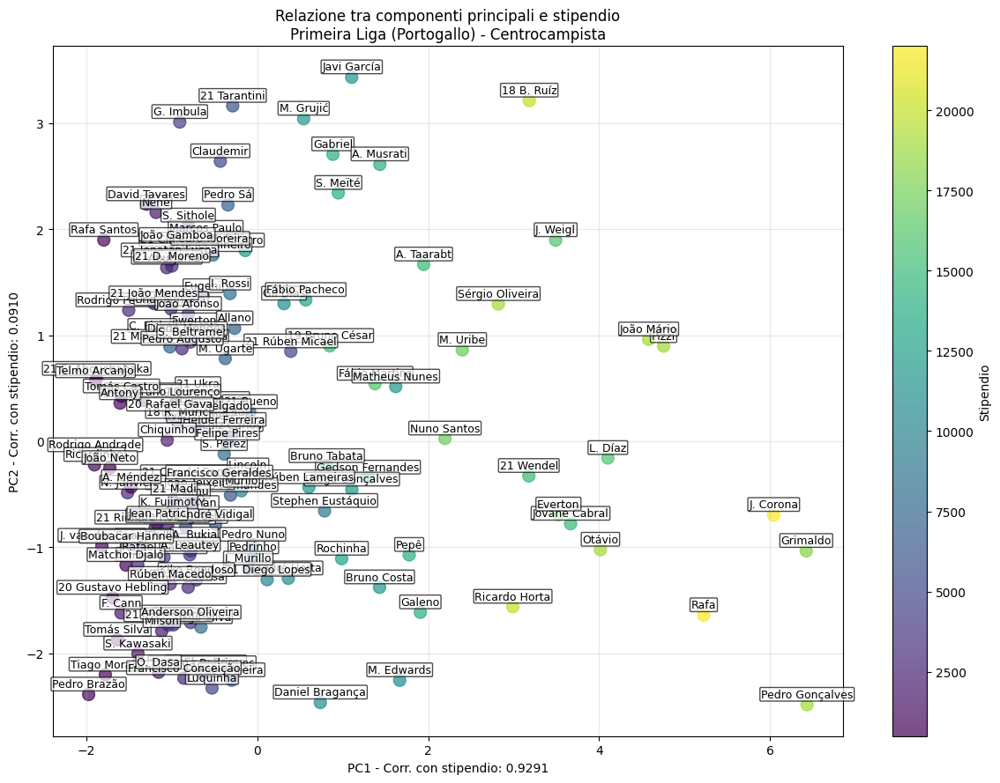


----------------------------------------
Ruolo: Attaccante | Giocatori: 84
----------------------------------------

Correlazione tra componenti principali e stipendio:
  PC1: 0.9320 (correlazione positiva)
  PC5: -0.2542 (correlazione negativa)
  PC7: 0.2424 (correlazione positiva)
  PC3: -0.0866 (correlazione negativa)
  PC4: 0.0145 (correlazione positiva)
  PC2: 0.0129 (correlazione positiva)
  PC6: -0.0069 (correlazione negativa)
  PC8: -0.0001 (correlazione negativa)

Dettaglio delle 3 componenti più correlate con lo stipendio:

PC1 - Correlazione con stipendio: 0.9320
  Feature con loading positivo (importanza decrescente):
    - Wage: 0.5138
    - Value: 0.4984
    - Release Clause: 0.4925
    - International Reputation: 0.3465
    - Age: 0.2733
    - Height: 0.0224
    - Weight: 0.0031
    - Jersey Number: -0.2233
  Feature con loading negativo (importanza decrescente):
    - Jersey Number: -0.2233
    - Weight: 0.0031
    - Height: 0.0224
    - Age: 0.2733
    - International

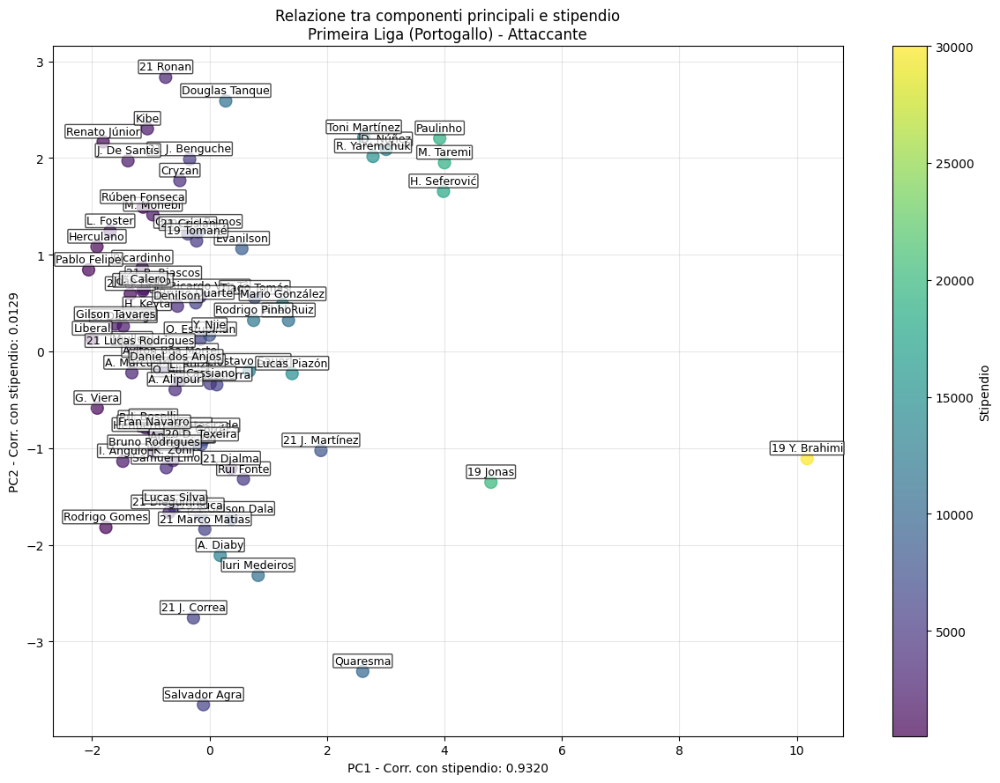


📊 Campionato: Premier League (Inghilterra) | Ruolo: Portiere | Giocatori: 92


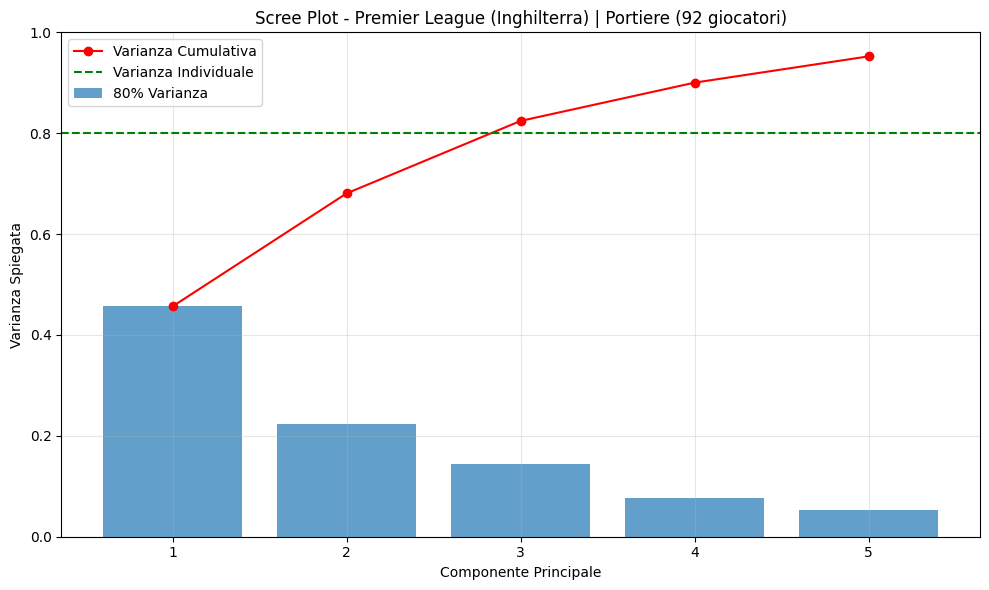

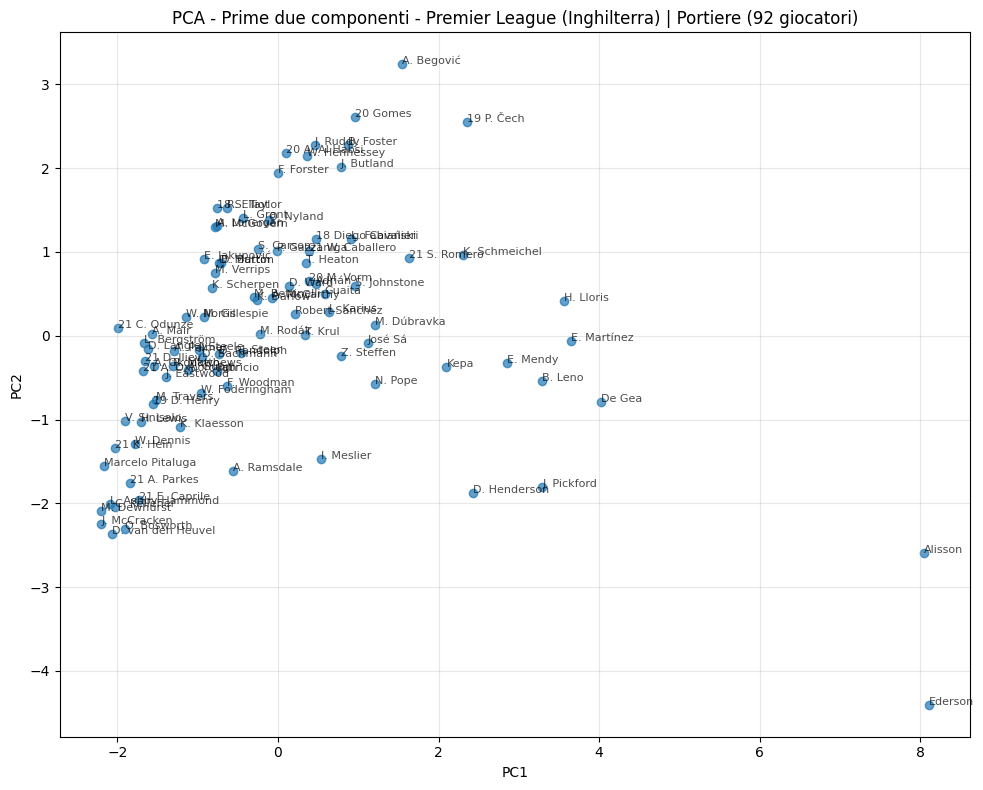

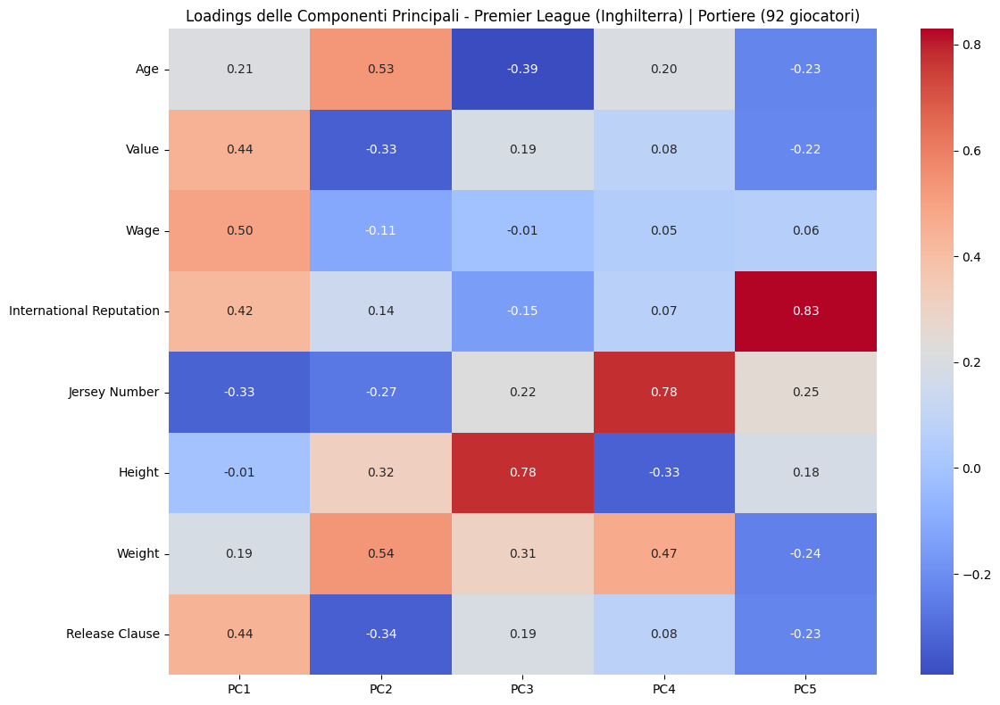


📊 Campionato: Premier League (Inghilterra) | Ruolo: Difensore | Giocatori: 290


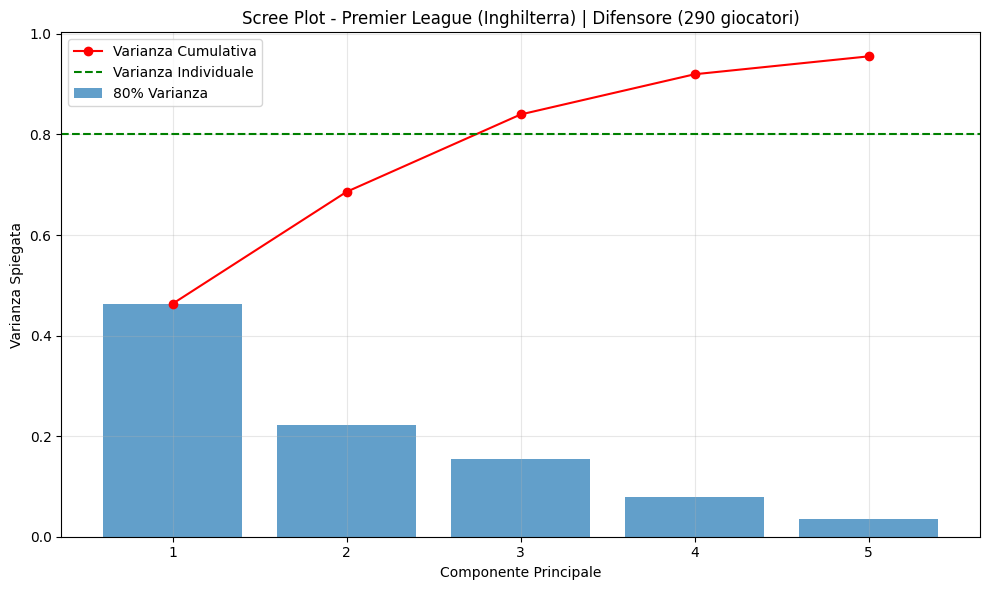

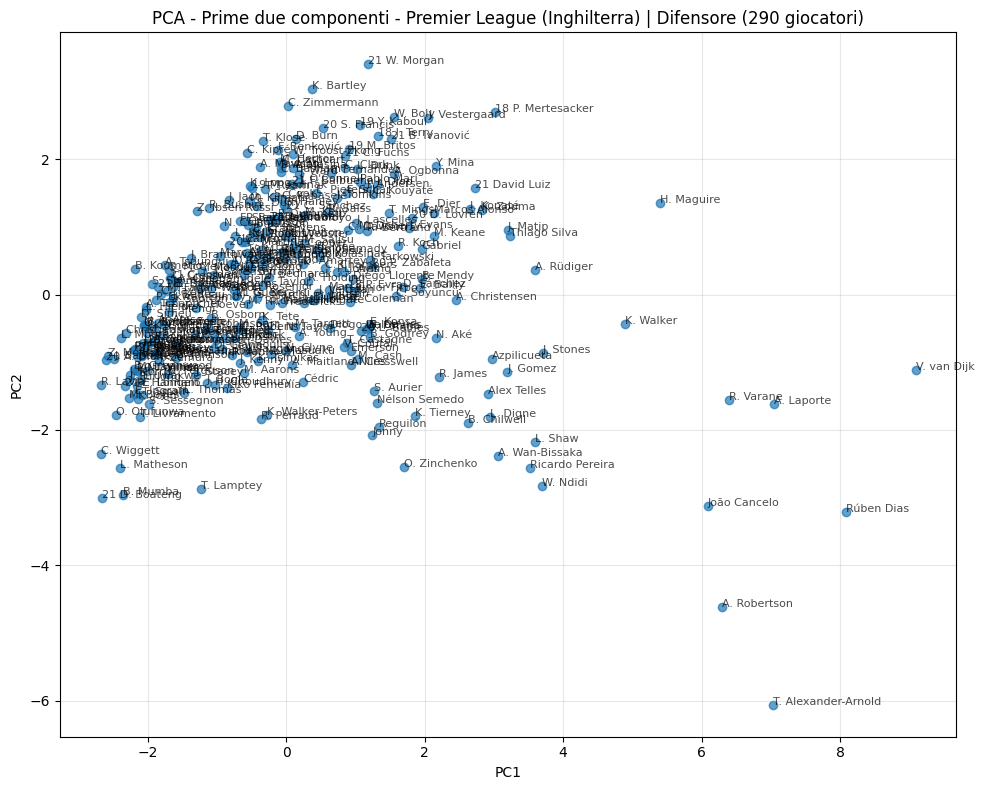

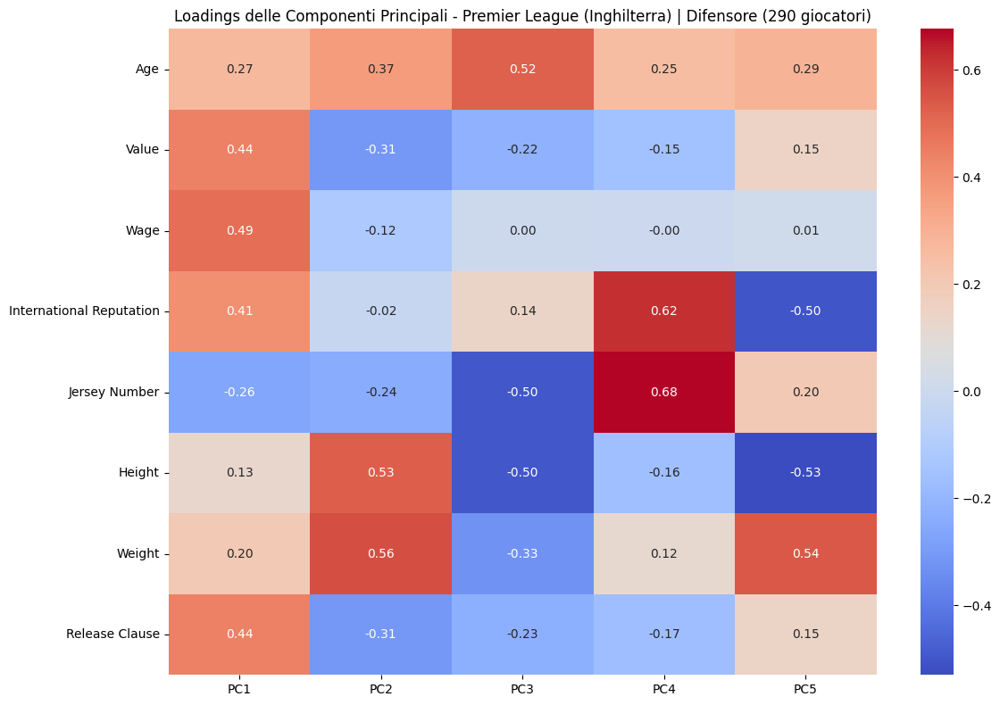


📊 Campionato: Premier League (Inghilterra) | Ruolo: Centrocampista | Giocatori: 301


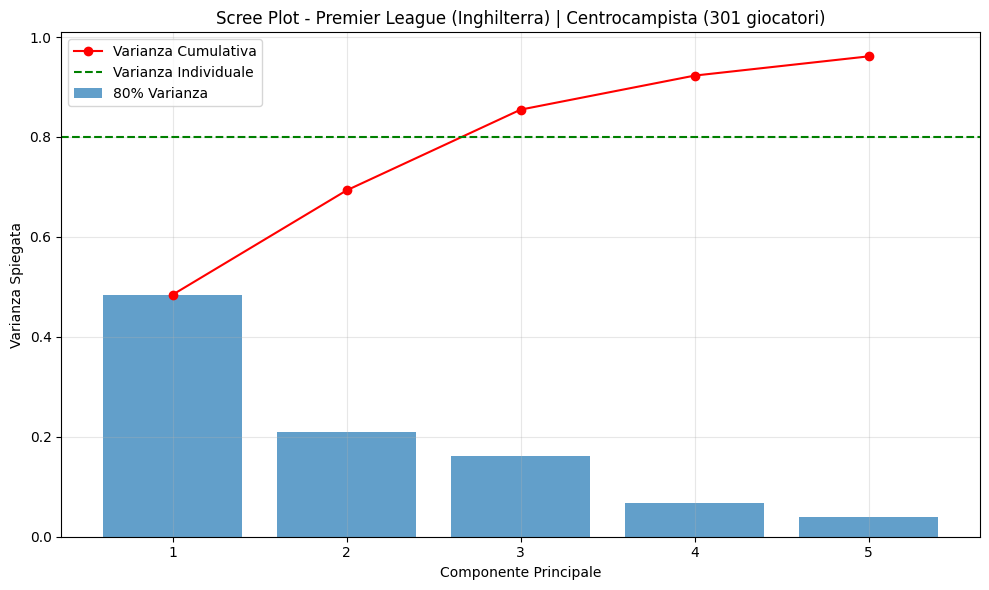

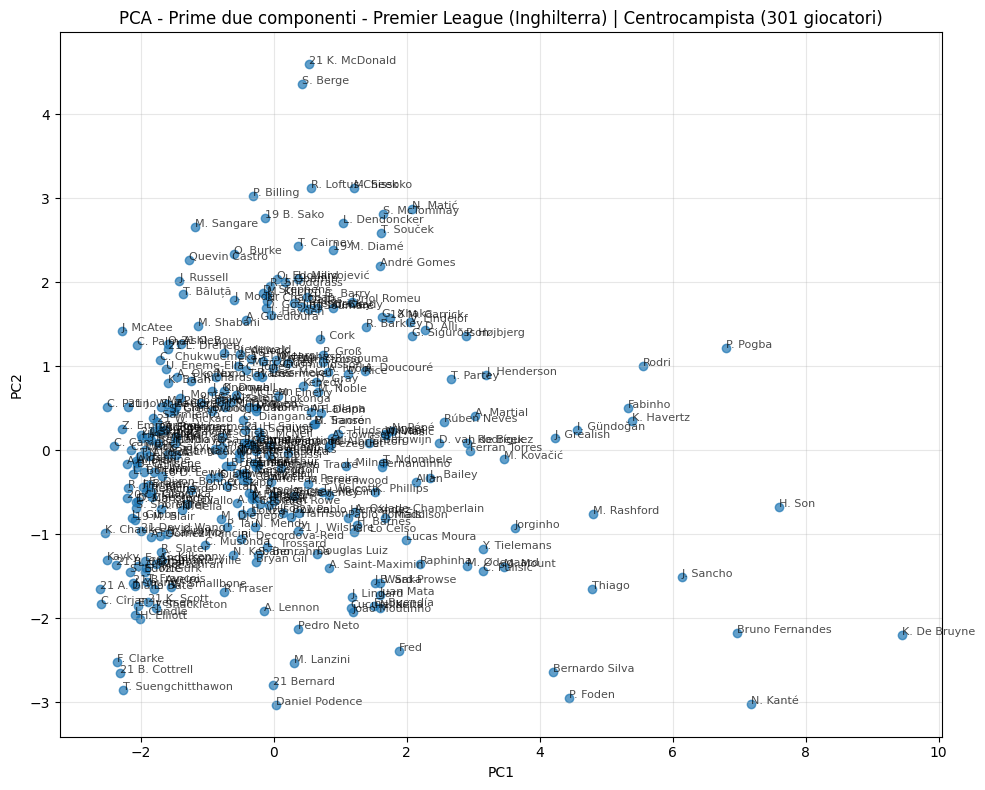

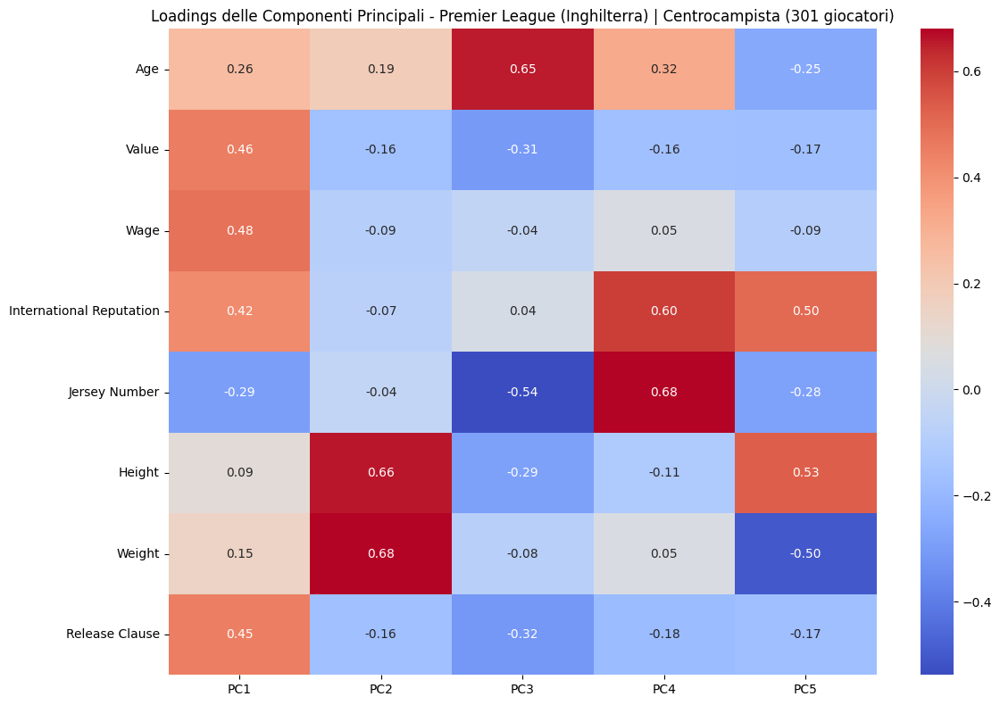


📊 Campionato: Premier League (Inghilterra) | Ruolo: Attaccante | Giocatori: 119


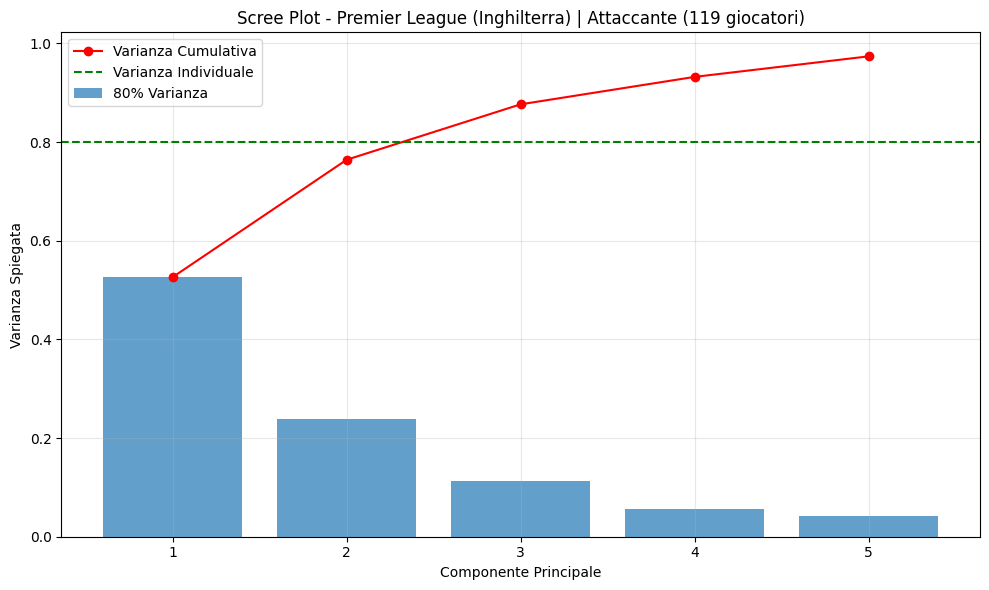

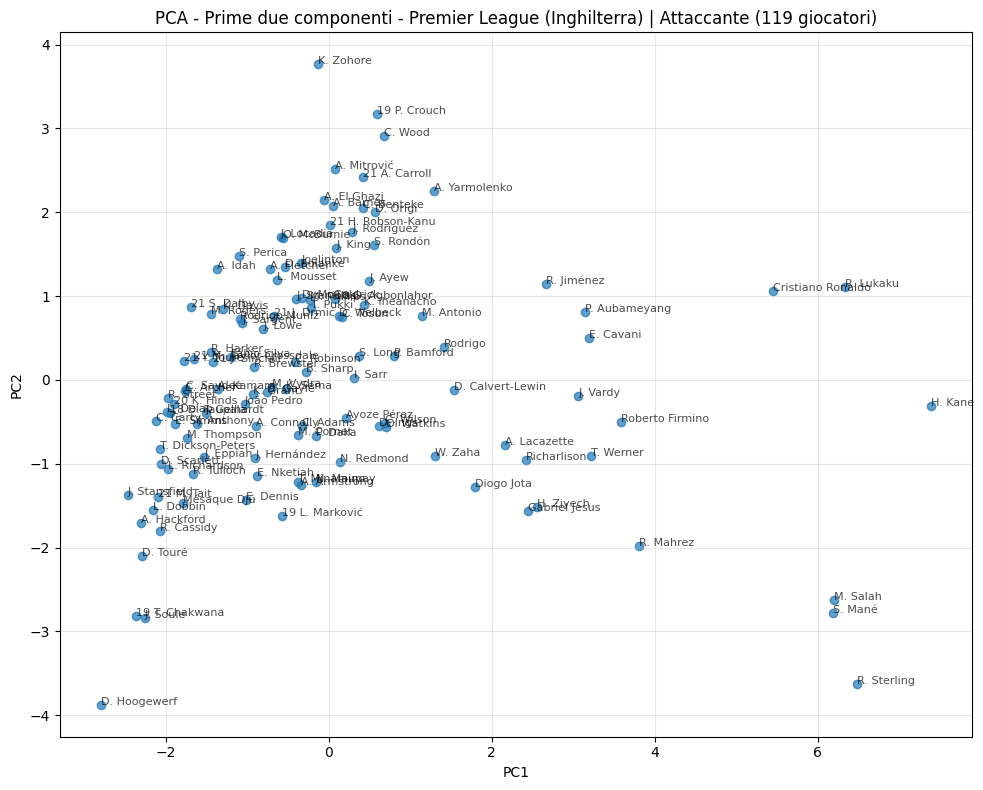

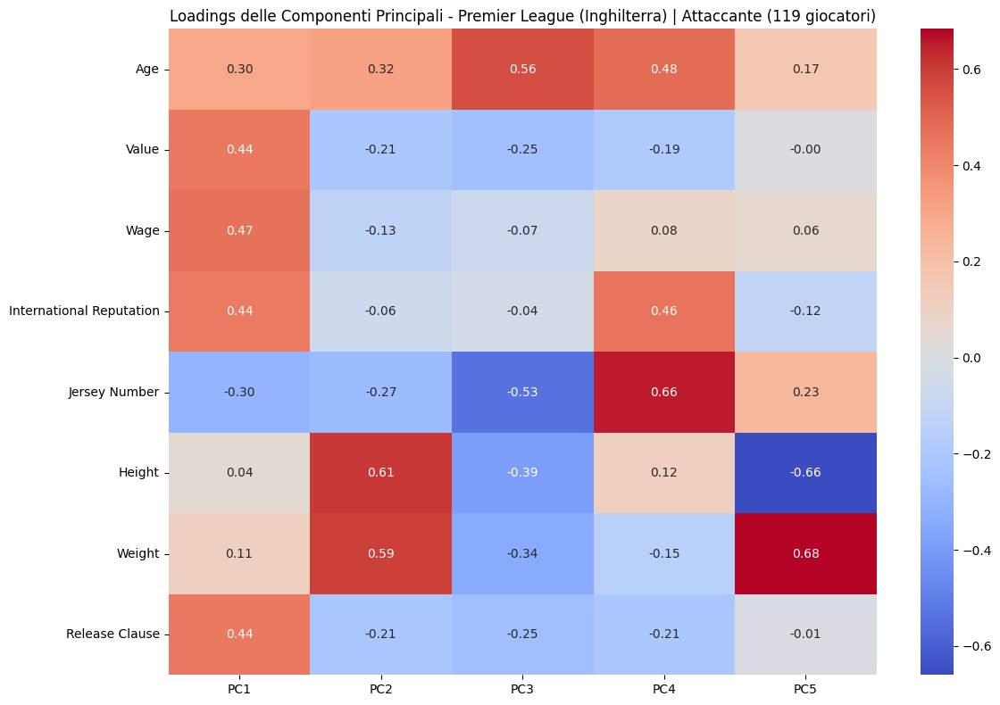


📊 Campionato: Serie A (Italia) | Ruolo: Portiere | Giocatori: 74


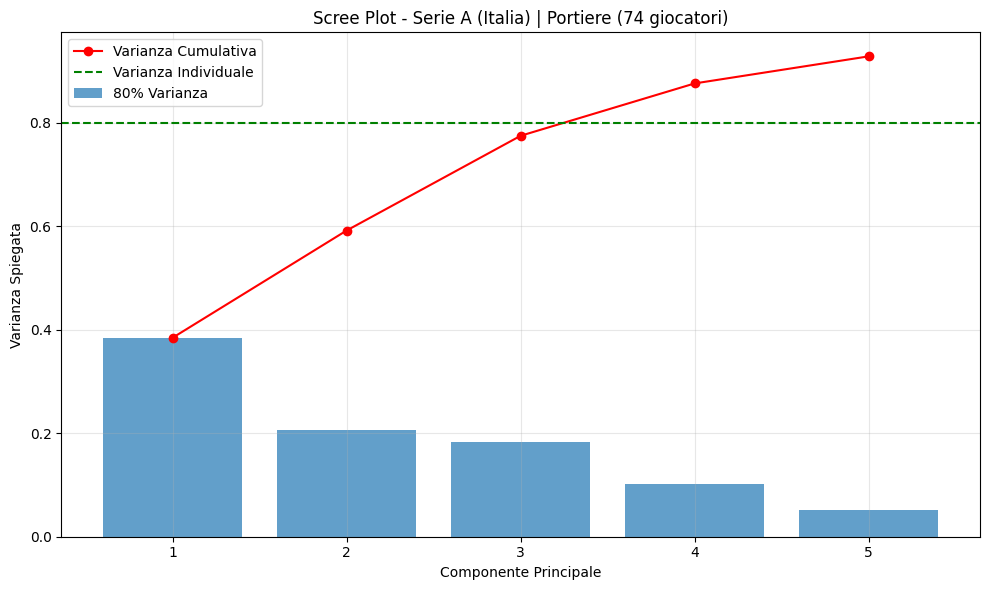

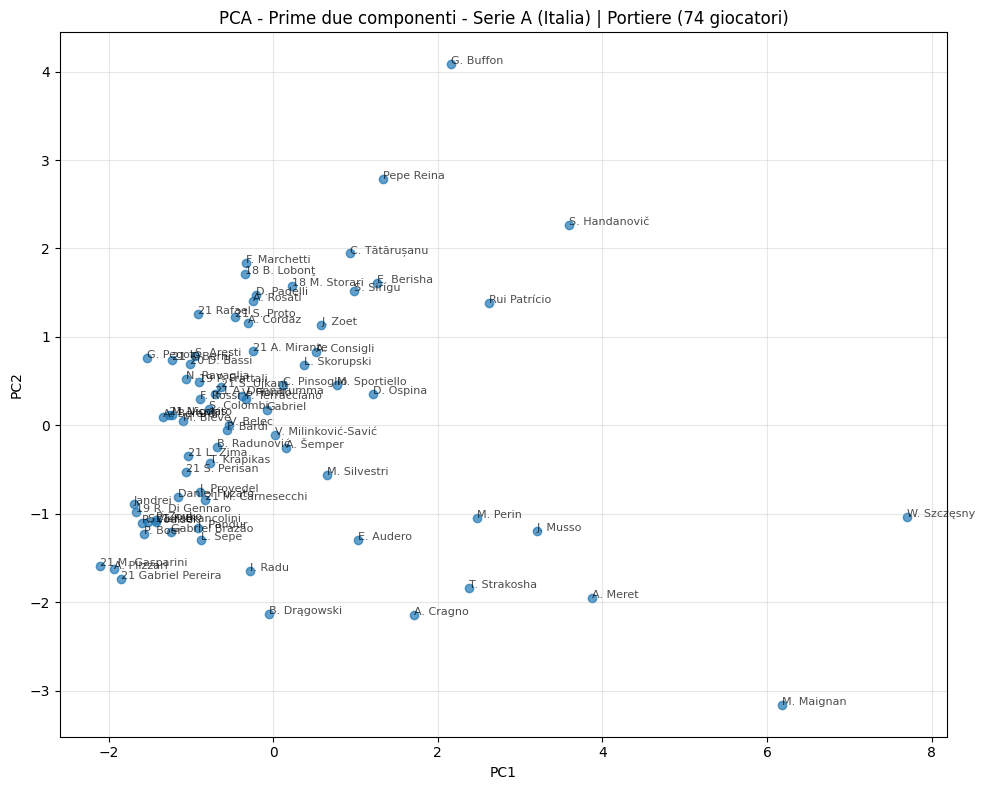

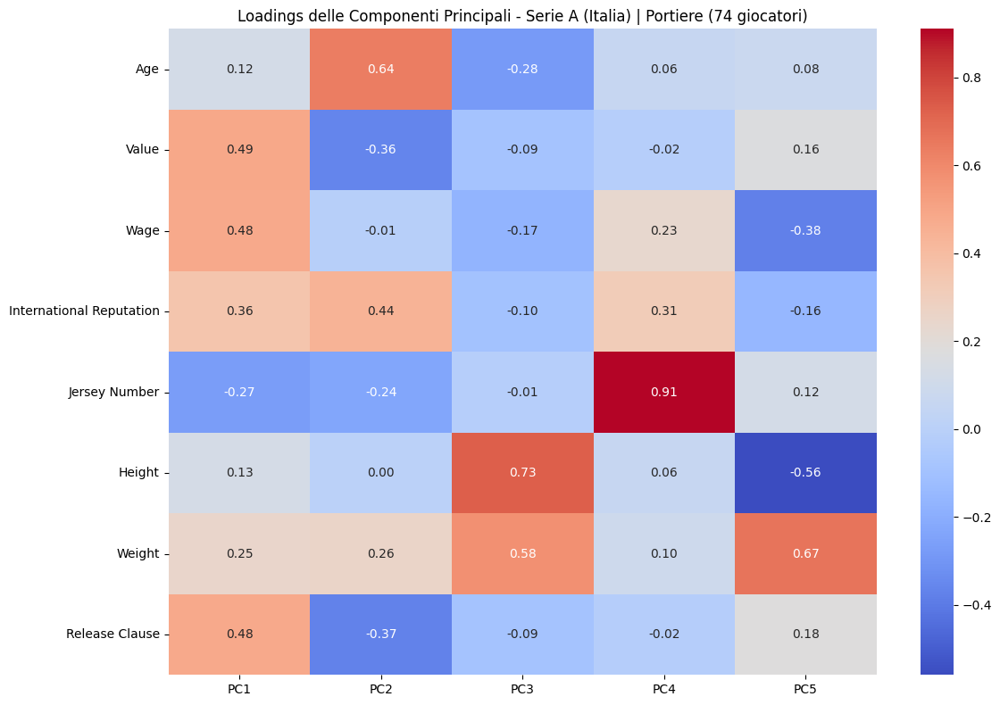


📊 Campionato: Serie A (Italia) | Ruolo: Difensore | Giocatori: 212


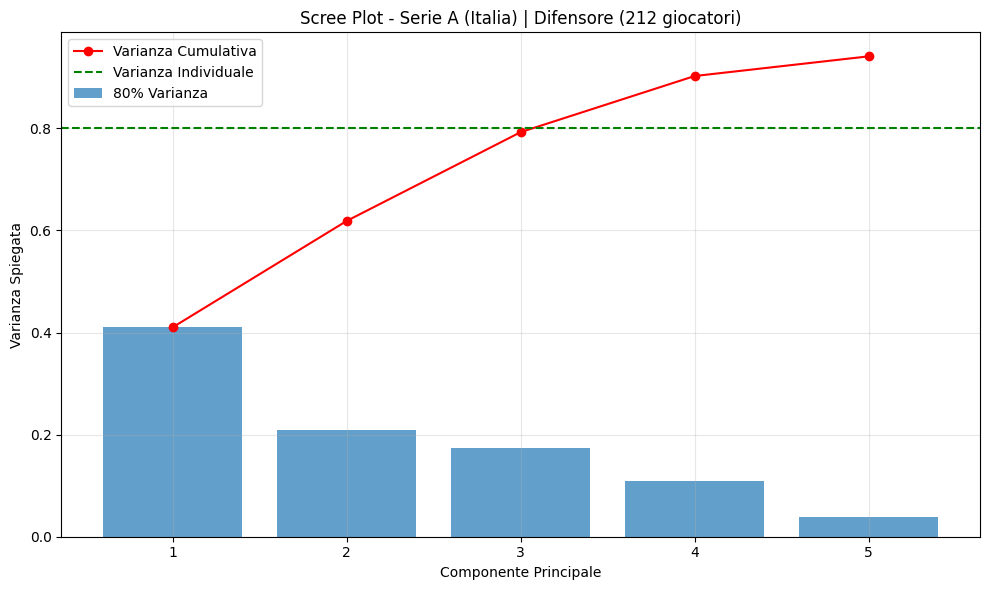

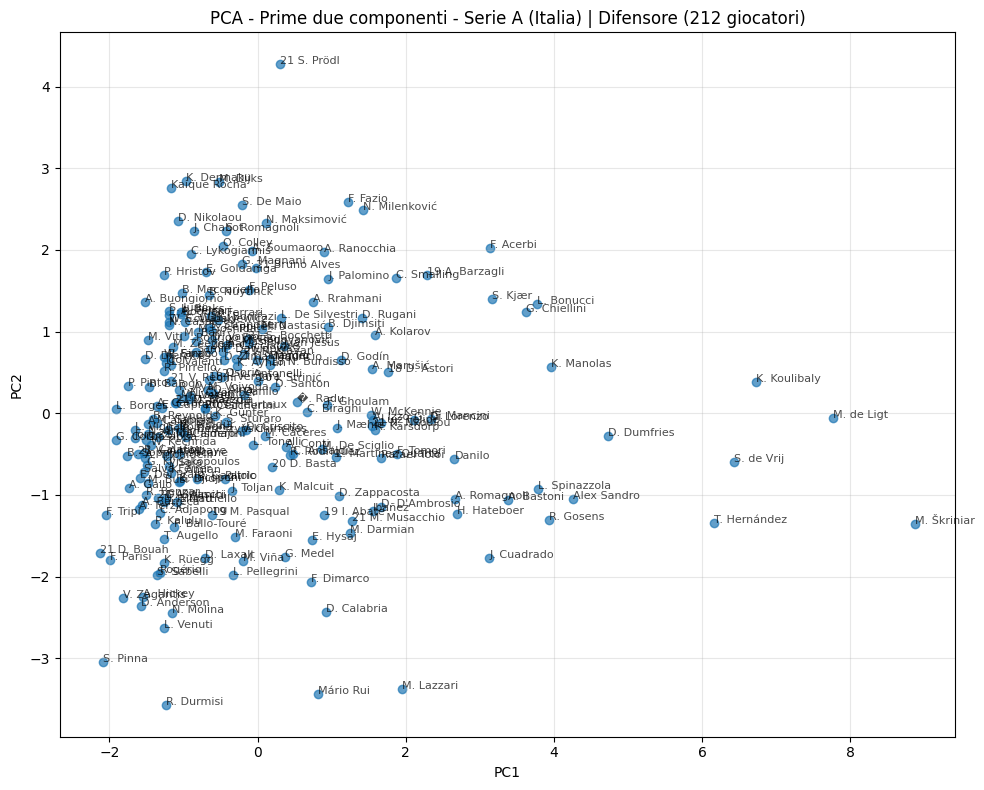

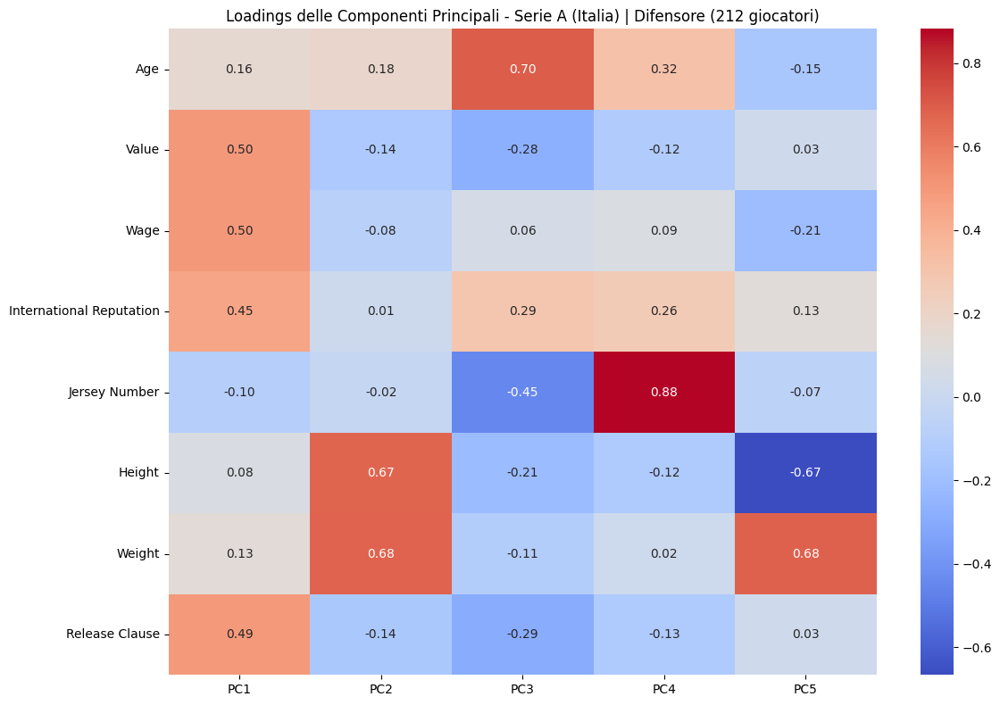


📊 Campionato: Serie A (Italia) | Ruolo: Centrocampista | Giocatori: 234


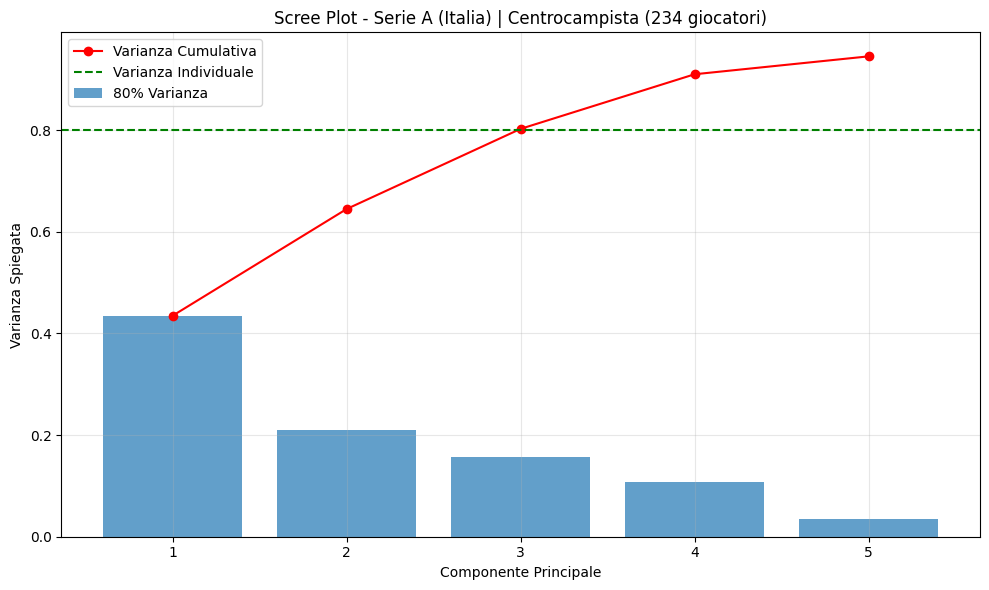

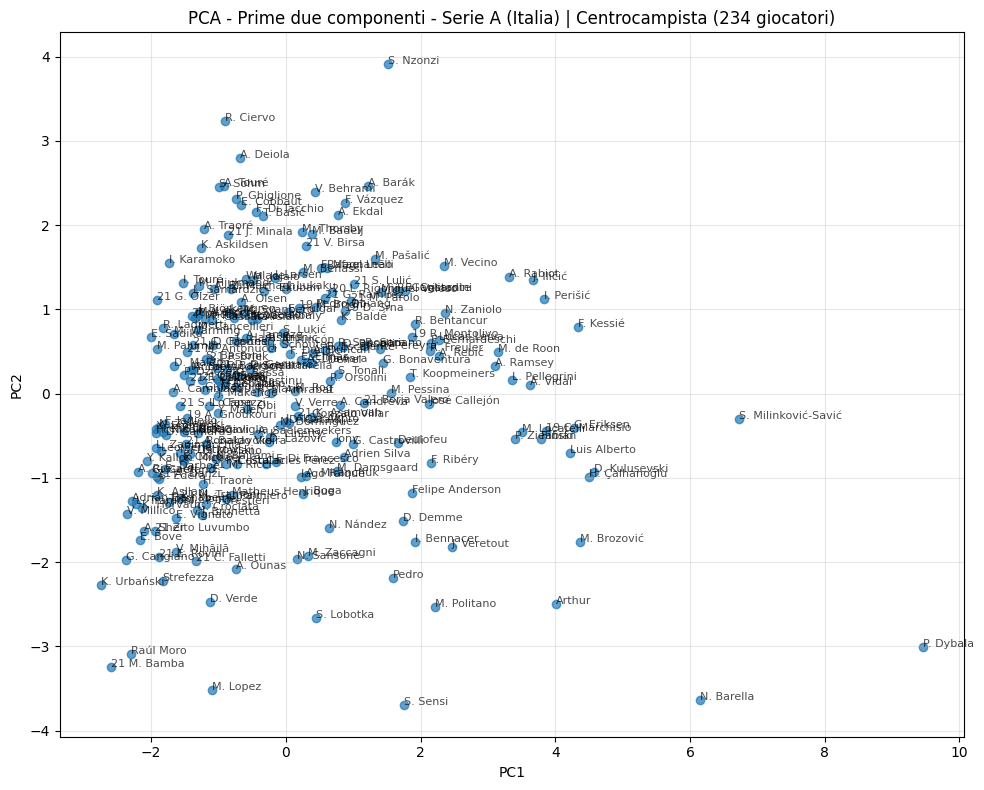

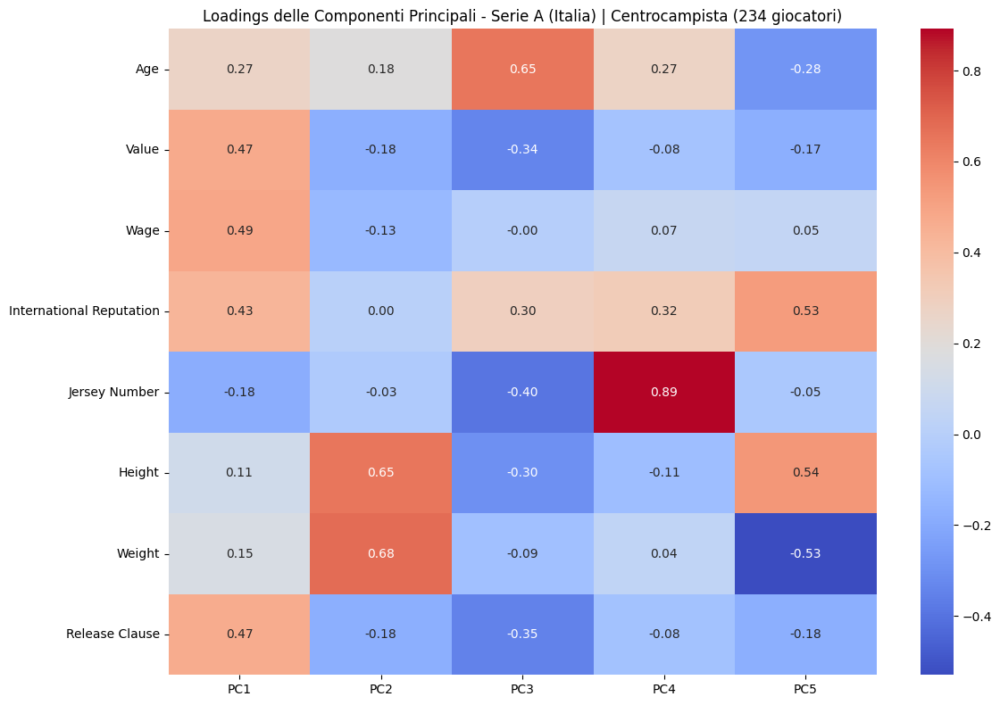


📊 Campionato: Serie A (Italia) | Ruolo: Attaccante | Giocatori: 111


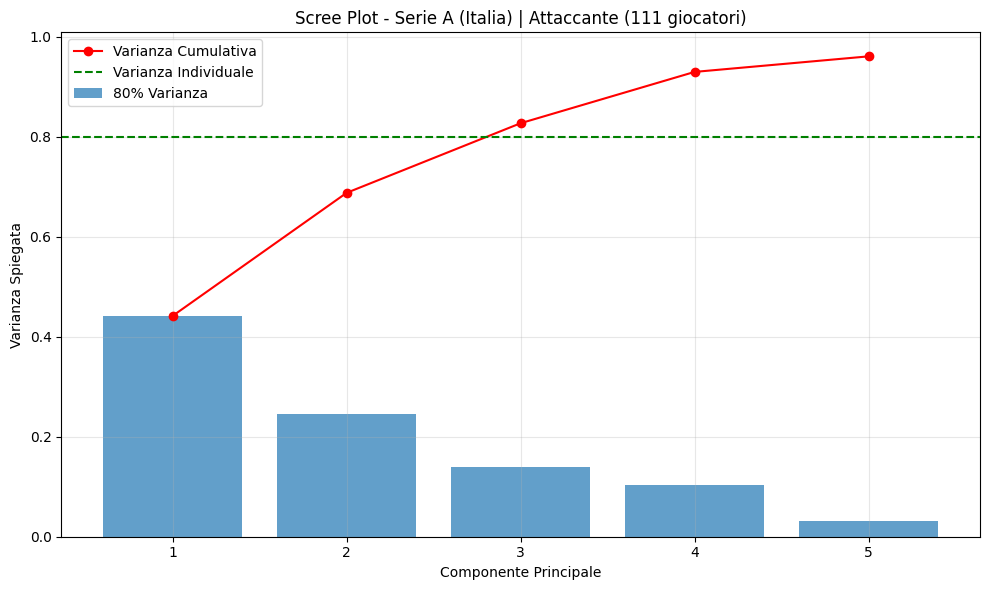

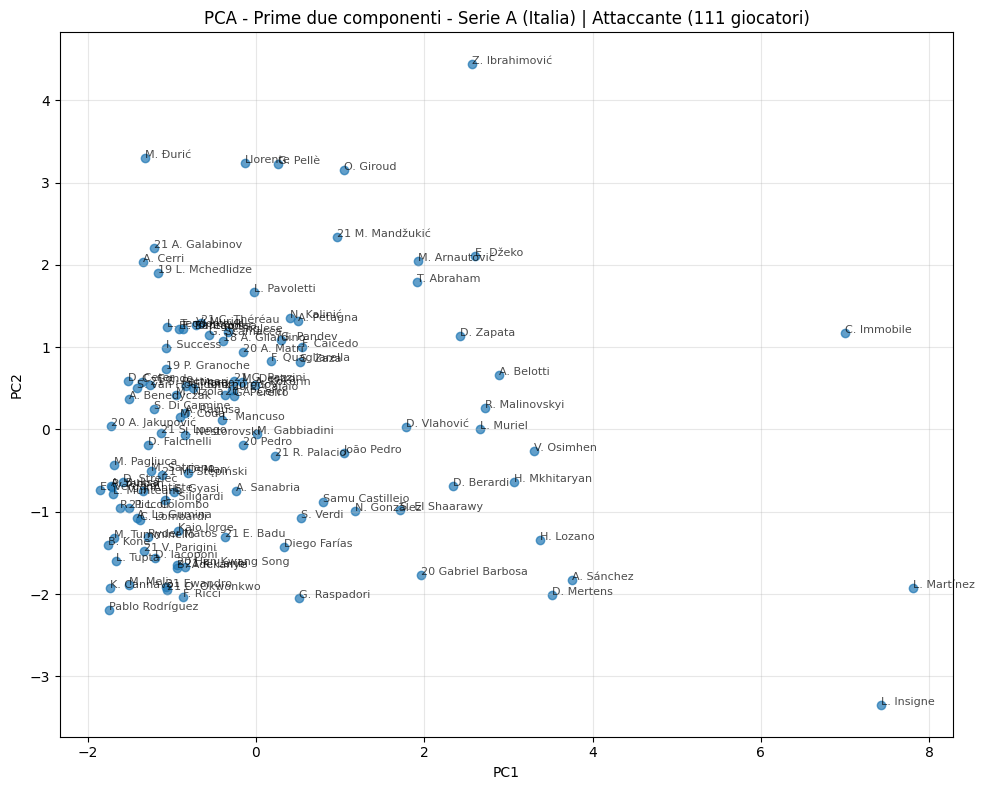

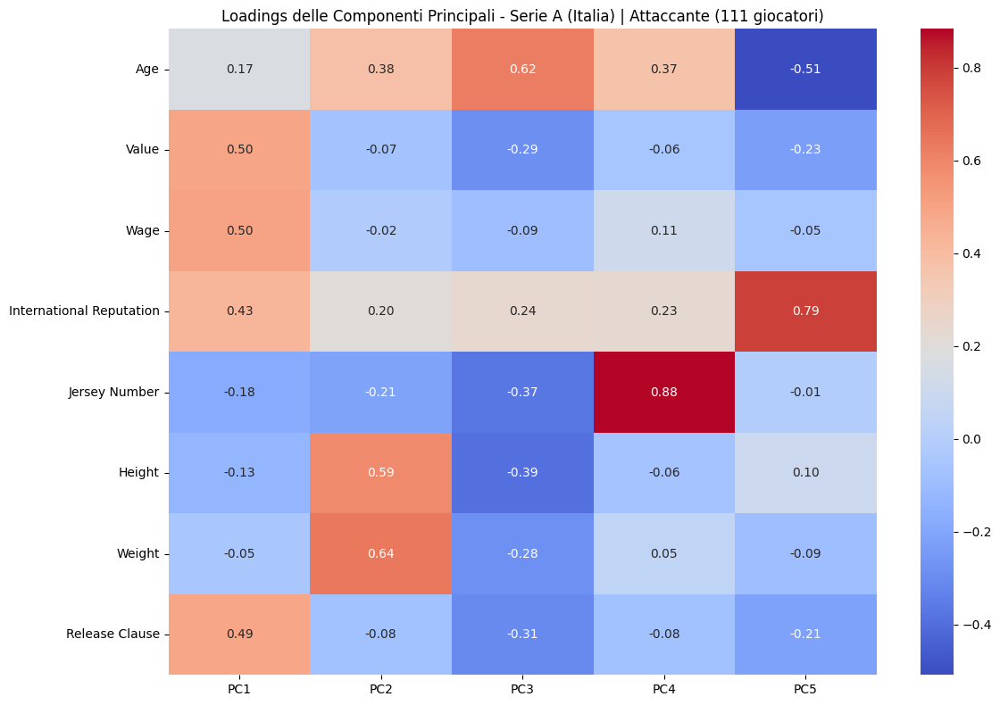


🔢 Riepilogo numero di giocatori per campionato e ruolo:
Ruolo                         Attaccante  Centrocampista  Difensore  Portiere  \
Campionato                                                                      
Premier League (Inghilterra)         119             301        290        92   
Serie A (Italia)                     111             234        212        74   
Totale                               230             535        502       166   

Ruolo                         Totale  
Campionato                            
Premier League (Inghilterra)     802  
Serie A (Italia)                 631  
Totale                          1433  


<Figure size 1200x800 with 0 Axes>

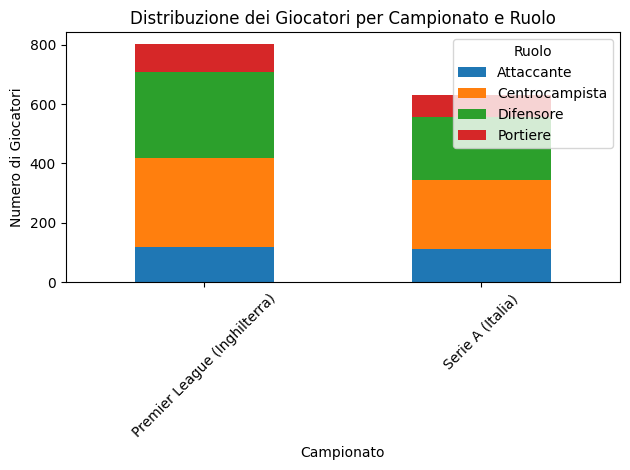

<ipython-input-24-03dff0d9a171>:666: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  .applymap(style_negative_positive)


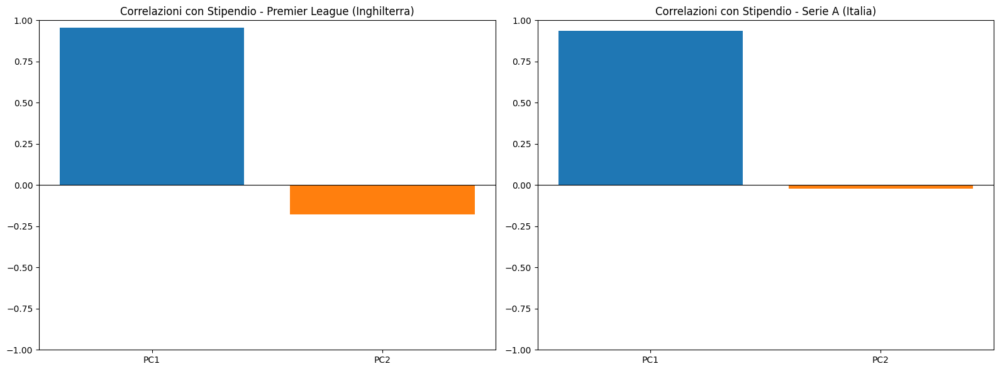

,Metrica,Premier League (Inghilterra),Serie A (Italia)
0,Varianza Spiegata,PC1: 52.6% PC2: 23.8%,PC1: 44.2% PC2: 24.6%
1,Correlazione Stipendio,PC1: 0.96 PC2: -0.18,PC1: 0.94 PC2: -0.02
2,Features Principali,"PC1: Wage, Value, Release Clause PC2: Height, Weight, Age","PC1: Wage, Value, Release Clause PC2: Weight, Height, Age"
3,Valore Medio Componenti,PC1: 0.00 PC2: 0.00,PC1: 0.00 PC2: -0.00


In [24]:
"""
PC... --> componente principali
Quale tra i diversi componenti compono il valore da cui dipende per la maggiore lo stipendio

Per difensori della Premier League
PC1-->Valore Complessivo del Giocatore (varianza maggiore) -->Componente che cattura valore di mercato del giocatore.
più è alto punteggio PC1 più tendono ad avere stipendi alti

PC2--> Struttura Fisica ed età --> Rappresenta la dimensione fisica --> Giocatori con alto PC2 sono più alti, più pesanti ed anziani

PC3-->Contrasto Età Fisicità --> Distinzione tra difensori più anziani, ma più bassi e quelli più giovani e più alti

PC4 --> Status e riconoscimento --> Reputazione internazionale con correlazione con numero di maglia più alti

PC5 --> Peso specifico del giocatore -->

"""

def pca_per_ruolo_campionato(df, selected_leagues=None, n_components=None):
    """
    Esegue l'analisi PCA separatamente per ogni combinazione di campionato e ruolo.

    Parameters:
    -----------
    df : pandas.DataFrame
        Il DataFrame contenente i dati dei calciatori
    selected_leagues : list, optional
        Lista dei campionati da analizzare. Se None, usa tutti i campionati disponibili.
    n_components : int, optional
        Numero di componenti principali da estrarre. Se None, usa tutte le componenti.

    Returns:
    --------
    results : dict
        Dizionario contenente i risultati della PCA per ogni combinazione campionato-ruolo
    """
    # Verifica esistenza colonne necessarie
    required_cols = ['Campionato', 'Position Group']
    for col in required_cols:
        if col not in df.columns:
            raise ValueError(f"La colonna '{col}' non è presente nel DataFrame")

    # Se non specificate, usa tutti i campionati disponibili
    if selected_leagues is None:
        selected_leagues = df['Campionato'].unique().tolist()

    # Definisci i ruoli
    roles = ['Portiere', 'Difensore', 'Centrocampista', 'Attaccante']

    # Crea un contatore per le combinazioni
    player_counts = {}

    # Dizionario per memorizzare i risultati
    results = {}

    # Loop per ogni campionato e ruolo
    for league in selected_leagues:
        league_results = {}
        player_counts[league] = {}

        for role in roles:
            # Filtra i dati per campionato e ruolo
            df_subset = df[(df['Campionato'] == league) & (df['Position Group'] == role)].copy()

            # Conta i giocatori in questa combinazione
            player_count = df_subset.shape[0]
            player_counts[league][role] = player_count

            print(f"\n📊 Campionato: {league} | Ruolo: {role} | Giocatori: {player_count}")

            # Verifica che ci siano abbastanza dati
            if player_count < 10:  # Minimo di osservazioni necessarie
                print(f"   ⚠️ Dati insufficienti per {league} - {role}: solo {player_count} osservazioni")
                continue

            # Rimozione delle colonne non numeriche o identificative
            drop_cols = ['Campionato', 'Position Group', 'Name']
            # Aggiungi 'ID' se presente
            if 'ID' in df_subset.columns:
                drop_cols.append('ID')
            # Aggiungi altre colonne non necessarie
            for col in df_subset.columns:
                if df_subset[col].dtype == 'object' and col not in drop_cols:
                    drop_cols.append(col)

            # Rimuovi le colonne filtrate ma assicurati che esistano nel DataFrame
            drop_cols_filtered = [col for col in drop_cols if col in df_subset.columns]
            df_model = df_subset.drop(columns=drop_cols_filtered)

            # One-hot encoding per variabili categoriche rimanenti
            df_encoded = pd.get_dummies(df_model, drop_first=True)

            # Standardizzazione
            scaler = StandardScaler()
            df_scaled = scaler.fit_transform(df_encoded)

            # Determina il numero di componenti
            max_components = min(df_scaled.shape[0] - 1, df_scaled.shape[1])
            if n_components is None:
                n_components_used = max_components
            else:
                n_components_used = min(n_components, max_components)

            # PCA
            pca = PCA(n_components=n_components_used)
            pca_result = pca.fit_transform(df_scaled)

            # Calcolo varianza spiegata
            explained_variance = pca.explained_variance_ratio_
            cumulative_variance = np.cumsum(explained_variance)

            # Creazione DF dei punteggi PCA
            pca_df = pd.DataFrame(
                pca_result,
                columns=[f'PC{i+1}' for i in range(n_components_used)]
            )

            # Aggiungi informazioni originali per l'analisi
            pca_df['Ruolo'] = role
            pca_df['Campionato'] = league
            if 'Wage' in df_subset.columns:
                pca_df['Wage'] = df_subset['Wage'].values
            if 'Overall' in df_subset.columns:
                pca_df['Overall'] = df_subset['Overall'].values
            if 'Name' in df_subset.columns:
                pca_df['Name'] = df_subset['Name'].values

            # Loadings delle variabili originali
            loadings = pd.DataFrame(
                pca.components_.T,
                columns=[f'PC{i+1}' for i in range(n_components_used)],
                index=df_encoded.columns
            )

            # Visualizzazione scree plot
            plt.figure(figsize=(10, 6))
            plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7)
            plt.plot(range(1, len(explained_variance) + 1), cumulative_variance, 'r-o')
            plt.axhline(y=0.8, color='g', linestyle='--')
            plt.title(f'Scree Plot - {league} | {role} ({player_count} giocatori)')
            plt.xlabel('Componente Principale')
            plt.ylabel('Varianza Spiegata')
            plt.legend(['Varianza Cumulativa', 'Varianza Individuale', '80% Varianza'])
            plt.grid(True, alpha=0.3)
            plt.tight_layout()
            plt.show()

            # Scatter plot delle prime due componenti se abbiamo almeno 2 componenti
            if n_components_used >= 2:
                plt.figure(figsize=(10, 8))
                scatter = plt.scatter(pca_df['PC1'], pca_df['PC2'], alpha=0.7)

                # Aggiungi etichette ai punti se disponibili
                if 'Name' in pca_df.columns:
                    for i, txt in enumerate(pca_df['Name']):
                        plt.annotate(txt, (pca_df['PC1'].iloc[i], pca_df['PC2'].iloc[i]),
                                    fontsize=8, alpha=0.7)

                plt.title(f'PCA - Prime due componenti - {league} | {role} ({player_count} giocatori)')
                plt.xlabel('PC1')
                plt.ylabel('PC2')
                plt.grid(True, alpha=0.3)
                plt.tight_layout()
                plt.show()

                # Heatmap dei loadings per le prime componenti (massimo 5)
                n_comps_heatmap = min(5, n_components_used)
                plt.figure(figsize=(12, max(8, len(df_encoded.columns) * 0.25)))
                sns.heatmap(loadings.iloc[:, :n_comps_heatmap], cmap='coolwarm', annot=True, fmt='.2f')
                plt.title(f'Loadings delle Componenti Principali - {league} | {role} ({player_count} giocatori)')
                plt.tight_layout()
                plt.show()

            # Salva i risultati
            league_results[role] = {
                'pca': pca,
                'pca_df': pca_df,
                'loadings': loadings,
                'explained_variance': explained_variance,
                'cumulative_variance': cumulative_variance,
                'features': df_encoded.columns.tolist(),
                'player_count': player_count
            }

        results[league] = league_results

    # Visualizza una tabella riepilogativa del numero di giocatori
    print("\n🔢 Riepilogo numero di giocatori per campionato e ruolo:")

    # Crea DataFrame per il riepilogo
    summary_data = []
    for league in player_counts:
        for role in roles:
            count = player_counts[league].get(role, 0)
            summary_data.append({
                'Campionato': league,
                'Ruolo': role,
                'Conteggio': count
            })

    summary_df = pd.DataFrame(summary_data)
    summary_pivot = summary_df.pivot(index='Campionato', columns='Ruolo', values='Conteggio').fillna(0).astype(int)
    summary_pivot['Totale'] = summary_pivot.sum(axis=1)
    summary_pivot.loc['Totale'] = summary_pivot.sum()

    print(summary_pivot)

    # Visualizza un grafico a barre per il conteggio
    plt.figure(figsize=(12, 8))
    summary_pivot_plot = summary_pivot.drop('Totale', axis=0).drop('Totale', axis=1)
    summary_pivot_plot.plot(kind='bar', stacked=True)
    plt.title('Distribuzione dei Giocatori per Campionato e Ruolo')
    plt.xlabel('Campionato')
    plt.ylabel('Numero di Giocatori')
    plt.legend(title='Ruolo')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return results


def pca_regressione(df, target_col='Wage', test_size=0.25, random_state=42,
                   n_components=None, filter_condition=None):
    """
    Esegue PCA sui dati e poi utilizza le componenti principali per la regressione.

    Parameters:
    -----------
    df : pandas.DataFrame
        Il DataFrame contenente i dati dei calciatori
    target_col : str, default='Wage'
        Nome della colonna target per la regressione
    test_size : float, default=0.25
        Proporzione del dataset da usare come test set
    random_state : int, default=42
        Seed per la riproducibilità
    n_components : int, optional
        Numero di componenti principali da estrarre. Se None, determina automaticamente
        il numero ottimale di componenti che spiegano l'80% della varianza.
    filter_condition : callable, optional
        Funzione che prende un DataFrame e restituisce un DataFrame filtrato.
        Es: lambda df: df[df['Campionato'] == 'Serie A (Italia)']

    Returns:
    --------
    results : dict
        Dizionario contenente i risultati dell'analisi
    """
    # Verifica che la colonna target esista
    if target_col not in df.columns:
        raise ValueError(f"La colonna target '{target_col}' non è presente nel DataFrame")

    # Applica filtro se specificato
    if filter_condition is not None:
        df_filtered = filter_condition(df)
    else:
        df_filtered = df.copy()

    # Verifica che abbiamo abbastanza dati
    if df_filtered.shape[0] < 20:
        raise ValueError(f"Dati insufficienti dopo il filtraggio: solo {df_filtered.shape[0]} osservazioni")

    print(f"Analisi su {df_filtered.shape[0]} osservazioni")

    # Rimozione delle colonne non numeriche/identificative e della colonna target
    drop_cols = [col for col in df_filtered.columns if df_filtered[col].dtype == 'object']
    drop_cols.append(target_col)  # Rimuovi anche la colonna target

    # Assicurati che le colonne esistano prima di rimuoverle
    drop_cols_filtered = [col for col in drop_cols if col in df_filtered.columns]
    X_data = df_filtered.drop(columns=drop_cols_filtered)
    y_data = df_filtered[target_col]

    # One-hot encoding per variabili categoriche rimanenti
    X_encoded = pd.get_dummies(X_data, drop_first=True)

    # Standardizzazione
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_encoded)

    # PCA - Se n_components non è specificato, determina automaticamente
    if n_components is None:
        # Prima PCA per determinare numero ottimale di componenti
        pca_full = PCA()
        pca_full.fit(X_scaled)
        explained_variance = pca_full.explained_variance_ratio_
        cumulative_variance = np.cumsum(explained_variance)

        # Trova componenti che spiegano l'80% della varianza
        n_components_optimal = np.argmax(cumulative_variance >= 0.8) + 1
        print(f"Numero ottimale di componenti principali: {n_components_optimal} (spiega {cumulative_variance[n_components_optimal-1]:.2%} della varianza)")

        # Plot scree
        plt.figure(figsize=(10, 6))
        plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7)
        plt.plot(range(1, len(explained_variance) + 1), cumulative_variance, 'r-o')
        plt.axhline(y=0.8, color='g', linestyle='--')
        plt.axvline(x=n_components_optimal, color='b', linestyle='--')
        plt.title('Scree Plot - Determinazione Componenti Ottimali')
        plt.xlabel('Componente Principale')
        plt.ylabel('Varianza Spiegata')
        plt.legend(['Varianza Cumulativa', 'Varianza Individuale', '80% Varianza', f'{n_components_optimal} Componenti'])
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    else:
        n_components_optimal = n_components

    # Applica PCA con numero ottimale di componenti
    pca = PCA(n_components=n_components_optimal)
    X_pca = pca.fit_transform(X_scaled)

    # Crea DataFrame con le componenti
    pca_df = pd.DataFrame(
        X_pca,
        columns=[f'PC{i+1}' for i in range(n_components_optimal)]
    )

    # Loadings delle variabili originali
    loadings = pd.DataFrame(
        pca.components_.T,
        columns=[f'PC{i+1}' for i in range(n_components_optimal)],
        index=X_encoded.columns
    )

    # Visualizza top loadings per ogni componente
    n_display = min(5, n_components_optimal)
    for i in range(n_display):
        comp_name = f'PC{i+1}'
        top_features = loadings[comp_name].abs().sort_values(ascending=False).head(10)

        plt.figure(figsize=(10, 6))
        sns.barplot(x=top_features.values, y=top_features.index)
        plt.title(f'Top 10 Feature per Importanza - {comp_name}')
        plt.xlabel('Loading (Importanza)')
        plt.tight_layout()
        plt.show()

    # Dividi in training e test set
    X_train, X_test, y_train, y_test = train_test_split(
        X_pca, y_data, test_size=test_size, random_state=random_state
    )

    # Regressione lineare
    reg_model = LinearRegression()
    reg_model.fit(X_train, y_train)

    # Predizioni
    y_pred_train = reg_model.predict(X_train)
    y_pred_test = reg_model.predict(X_test)

    # Valutazione del modello
    train_r2 = r2_score(y_train, y_pred_train)
    test_r2 = r2_score(y_test, y_pred_test)
    train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))

    print(f"\nPerformance Modello:")
    print(f"R² Train: {train_r2:.4f}")
    print(f"R² Test: {test_r2:.4f}")
    print(f"RMSE Train: {train_rmse:.4f}")
    print(f"RMSE Test: {test_rmse:.4f}")

    # Cross-validation
    cv_scores = cross_val_score(reg_model, X_pca, y_data, cv=5, scoring='r2')
    print(f"R² CV (5-fold): {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")

    # Coefficienti delle componenti principali
    coef_df = pd.DataFrame({
        'Componente': [f'PC{i+1}' for i in range(n_components_optimal)],
        'Coefficiente': reg_model.coef_
    })

    # Ordina per importanza assoluta
    coef_sorted = coef_df.reindex(coef_df.Coefficiente.abs().sort_values(ascending=False).index)

    plt.figure(figsize=(10, 6))
    sns.barplot(x='Coefficiente', y='Componente', data=coef_sorted)
    plt.title(f'Importanza delle Componenti Principali nella Previsione di {target_col}')
    plt.tight_layout()
    plt.show()

    # Plot predizioni vs valori reali (test set)
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred_test, alpha=0.7)

    # Linea ideale
    min_val = min(y_test.min(), y_pred_test.min())
    max_val = max(y_test.max(), y_pred_test.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'r--')

    plt.title(f'Valori Reali vs Predetti - {target_col} (Test Set)')
    plt.xlabel(f'{target_col} Reale')
    plt.ylabel(f'{target_col} Predetto')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Calcola l'importanza delle variabili originali attraverso i loadings e i coefficienti
    feature_importance = np.zeros(len(X_encoded.columns))
    for i in range(n_components_optimal):
        feature_importance += np.abs(pca.components_[i] * reg_model.coef_[i])

    # Crea un DataFrame per l'importanza delle variabili
    importance_df = pd.DataFrame({
        'Feature': X_encoded.columns,
        'Importance': feature_importance
    })
    importance_sorted = importance_df.sort_values('Importance', ascending=False)

    # Visualizza top feature
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=importance_sorted.head(15))
    plt.title(f'Top 15 Feature Originali più Importanti per la Previsione di {target_col}')
    plt.tight_layout()
    plt.show()

    # Restituisci risultati
    results = {
        'pca': pca,
        'regression_model': reg_model,
        'pca_df': pca_df,
        'loadings': loadings,
        'feature_importance': importance_sorted,
        'train_r2': train_r2,
        'test_r2': test_r2,
        'train_rmse': train_rmse,
        'test_rmse': test_rmse,
        'cv_scores': cv_scores,
        'X_pca': X_pca,
        'y': y_data,
        'X_train': X_train,
        'X_test': X_test,
        'y_train': y_train,
        'y_test': y_test
    }

    return results


def analisi_pca_stipendi(risultati_pca, n_top_components=3):
  """
  Analizza la correlazione tra le componenti principali e gli stipendi per ogni combinazione
  campionato-ruolo, identificando le componenti più importanti.

  Parameters:
  -----------
  risultati_pca : dict
      Dizionario con i risultati della PCA per ogni combinazione campionato-ruolo
  n_top_components : int, default=3
      Numero di componenti principali da analizzare in dettaglio

  Returns:
  --------
  risultati_analisi : dict
      Dizionario con i risultati dell'analisi
  """
  risultati_analisi = {}

  # Loop per ogni campionato
  for campionato in risultati_pca:
      risultati_analisi[campionato] = {}
      print(f"\n\n{'='*80}")
      print(f"Analisi delle componenti principali correlate allo stipendio - {campionato}")
      print(f"{'='*80}")

      # Loop per ogni ruolo
      for ruolo in risultati_pca[campionato]:
          # Ottieni i dati PCA per questo campionato e ruolo
          dati_ruolo = risultati_pca[campionato][ruolo]

          # Verifica che ci siano dati e che contengano la colonna 'Wage'
          if 'pca_df' not in dati_ruolo or 'Wage' not in dati_ruolo['pca_df'].columns:
              print(f"\nDati insufficienti o stipendi mancanti per {ruolo} in {campionato}")
              continue

          print(f"\n{'-'*40}")
          print(f"Ruolo: {ruolo} | Giocatori: {dati_ruolo['player_count']}")
          print(f"{'-'*40}")

          # Ottieni il DataFrame con i punteggi PCA e gli stipendi
          pca_df = dati_ruolo['pca_df']

          # Calcola la correlazione tra componenti principali e stipendio
          corr_with_wage = {}
          for col in pca_df.columns:
              if col.startswith('PC'):
                  corr = pca_df[col].corr(pca_df['Wage'])
                  corr_with_wage[col] = corr

          # Ordina le componenti per valore assoluto della correlazione
          corr_sorted = sorted(corr_with_wage.items(), key=lambda x: abs(x[1]), reverse=True)

          # Mostra le correlazioni
          print("\nCorrelazione tra componenti principali e stipendio:")
          for comp, corr in corr_sorted:
              direction = "positiva" if corr > 0 else "negativa"
              print(f"  {comp}: {corr:.4f} (correlazione {direction})")

          # Analizza in dettaglio le componenti più correlate con lo stipendio
          print(f"\nDettaglio delle {n_top_components} componenti più correlate con lo stipendio:")

          top_components = [comp for comp, _ in corr_sorted[:n_top_components]]
          componenti_dettaglio = {}

          for comp in top_components:
              # Ottieni i loadings per questa componente
              if 'loadings' not in dati_ruolo:
                  print(f"  Loadings non disponibili per {comp}")
                  continue

              loadings = dati_ruolo['loadings']
              comp_idx = int(comp[2:]) - 1  # Estrai l'indice numerico dalla stringa 'PCx'

              # Top 10 feature positive
              top_positive = loadings.iloc[:,comp_idx].sort_values(ascending=False).head(10)
              # Top 10 feature negative
              top_negative = loadings.iloc[:,comp_idx].sort_values().head(10)

              print(f"\n{comp} - Correlazione con stipendio: {corr_with_wage[comp]:.4f}")
              print("  Feature con loading positivo (importanza decrescente):")
              for feat, val in top_positive.items():
                  print(f"    - {feat}: {val:.4f}")

              print("  Feature con loading negativo (importanza decrescente):")
              for feat, val in top_negative.items():
                  print(f"    - {feat}: {val:.4f}")

              # Interpreta la componente in base ai loadings
              print("  Interpretazione:")

              # Un'interpretazione basata sui valori dei loadings (esempio semplificato)
              corr_sign = "positivamente" if corr_with_wage[comp] > 0 else "negativamente"
              print(f"  Questa componente è correlata {corr_sign} con lo stipendio, suggerendo che:")

              # Effetto sulla variabile target in base alla correlazione
              effect_direction = "aumentano" if corr_with_wage[comp] > 0 else "diminuiscono"
              print(f"  Gli stipendi {effect_direction} quando:")

              # Effetto delle feature positive
              pos_effect = "aumentano" if corr_with_wage[comp] > 0 else "diminuiscono"
              print(f"  - Le seguenti caratteristiche {pos_effect}: {', '.join(top_positive.index[:5])}")

              # Effetto delle feature negative
              neg_effect = "diminuiscono" if corr_with_wage[comp] > 0 else "aumentano"
              print(f"  - Le seguenti caratteristiche {neg_effect}: {', '.join(top_negative.index[:5])}")

              # Salva i dettagli
              componenti_dettaglio[comp] = {
                  'correlazione': corr_with_wage[comp],
                  'top_positive': top_positive.to_dict(),
                  'top_negative': top_negative.to_dict()
              }

          # Salva i risultati dell'analisi
          risultati_analisi[campionato][ruolo] = {
              'correlazioni': corr_with_wage,
              'componenti_dettaglio': componenti_dettaglio
          }

          # Visualizza un grafico della correlazione tra le prime due componenti e lo stipendio
          if 'PC1' in pca_df.columns and 'PC2' in pca_df.columns:
              plt.figure(figsize=(12, 9))
              sc = plt.scatter(pca_df['PC1'], pca_df['PC2'],
                              c=pca_df['Wage'], cmap='viridis', alpha=0.7, s=100)
              plt.colorbar(sc, label='Stipendio')

              plt.title(f'Relazione tra componenti principali e stipendio\n{campionato} - {ruolo}')
              plt.xlabel(f"PC1 - Corr. con stipendio: {corr_with_wage.get('PC1', 0):.4f}")
              plt.ylabel(f"PC2 - Corr. con stipendio: {corr_with_wage.get('PC2', 0):.4f}")

              # Aggiungi etichette con nomi giocatori se disponibili
              if 'Name' in pca_df.columns:
                  # Visualizza tutti i nomi senza limitazioni
                  for i, row in pca_df.iterrows():
                      plt.annotate(row['Name'],
                                  xy=(row['PC1'], row['PC2']),  # Posizione del punto
                                  xytext=(0, 6),  # Offset di 6 pixel sopra il punto
                                  textcoords='offset points',
                                  fontsize=9,
                                  ha='center',  # Allineamento orizzontale centrato
                                  bbox=dict(boxstyle='round,pad=0.1', fc='white', alpha=0.7))

              plt.grid(True, alpha=0.3)
              plt.tight_layout()
              plt.show()

  return risultati_analisi
def confronto_attaccanti_pl_seriea(risultati_pca):
    """
    Crea una tabella comparativa tra gli attaccanti della Premier League e della Serie A
    basata sulle componenti PC1 e PC2 e la loro relazione con gli stipendi.
    """
    # Configurazione per l'analisi
    leagues = ['Premier League (Inghilterra)', 'Serie A (Italia)']
    ruolo = 'Attaccante'

    # Raccolta dati
    dati_lega = {}

    for lega in leagues:
        try:
            # Estrai risultati PCA
            pca_risultati = risultati_pca[lega][ruolo]
            pca_df = pca_risultati['pca_df']
            loadings = pca_risultati['loadings']

            # Calcola metriche chiave
            stats = {
                'Varianza PC1': pca_risultati['explained_variance'][0],
                'Varianza PC2': pca_risultati['explained_variance'][1],
                'Corr. PC1-Stipendio': pca_df['PC1'].corr(pca_df['Wage']),
                'Corr. PC2-Stipendio': pca_df['PC2'].corr(pca_df['Wage']),
                'Top Features PC1': loadings['PC1'].abs().nlargest(5).index.tolist(),
                'Top Features PC2': loadings['PC2'].abs().nlargest(5).index.tolist(),
                'Media PC1': pca_df['PC1'].mean(),
                'Media PC2': pca_df['PC2'].mean()
            }

            dati_lega[lega] = stats

        except KeyError as e:
            print(f"⚠️ Dati mancanti per {lega} - {ruolo}: {str(e)}")
            continue

    # Crea dataframe comparativo
    metriche = [
        ('Varianza Spiegata', 'Varianza PC1', 'Varianza PC2'),
        ('Correlazione Stipendio', 'Corr. PC1-Stipendio', 'Corr. PC2-Stipendio'),
        ('Features Principali', 'Top Features PC1', 'Top Features PC2'),
        ('Valore Medio Componenti', 'Media PC1', 'Media PC2')
    ]

    rows = []
    for nome_metrica, pc1_key, pc2_key in metriche:
        row = {'Metrica': nome_metrica}
        for lega in leagues:
            if lega in dati_lega:
                if 'Varianza' in nome_metrica:
                    row[lega] = f"PC1: {dati_lega[lega][pc1_key]:.1%}\nPC2: {dati_lega[lega][pc2_key]:.1%}"
                elif 'Correlazione' in nome_metrica:
                    row[lega] = f"PC1: {dati_lega[lega][pc1_key]:.2f}\nPC2: {dati_lega[lega][pc2_key]:.2f}"
                elif 'Features' in nome_metrica:
                    row[lega] = f"PC1: {', '.join(dati_lega[lega][pc1_key][:3])}\nPC2: {', '.join(dati_lega[lega][pc2_key][:3])}"
                else:
                    row[lega] = f"PC1: {dati_lega[lega][pc1_key]:.2f}\nPC2: {dati_lega[lega][pc2_key]:.2f}"
        rows.append(row)

    confronto_df = pd.DataFrame(rows)

    # Stilizzazione tabella
    def style_negative_positive(val):
        color = 'red' if '-' in str(val) else 'green' if any(c.isdigit() for c in str(val)) else 'black'
        return f'color: {color}'

    styled_df = (confronto_df.style
                .set_properties(**{'text-align': 'left', 'white-space': 'pre-wrap'})
                .set_table_styles([{
                    'selector': 'th',
                    'props': [('background', '#606060'), ('color', 'white'), ('font-weight', 'bold')]
                }, {
                    'selector': 'td',
                    'props': [('border', '1px solid #EEEEEE')]
                }])
                .applymap(style_negative_positive)
                .set_caption("Confronto Attaccanti: Premier League vs Serie A")
                .format(precision=2))

    # Visualizzazione aggiuntiva
    if len(dati_lega) == 2:
        fig, axs = plt.subplots(1, 2, figsize=(16, 6))

        # Grafico correlazioni
        for idx, lega in enumerate(dati_lega.keys()):
            axs[idx].bar(['PC1', 'PC2'],
                        [dati_lega[lega]['Corr. PC1-Stipendio'],
                        dati_lega[lega]['Corr. PC2-Stipendio']],
                        color=['#1f77b4', '#ff7f0e'])
            axs[idx].set_title(f'Correlazioni con Stipendio - {lega}')
            axs[idx].set_ylim(-1, 1)
            axs[idx].axhline(0, color='black', linewidth=0.8)

        plt.tight_layout()
        plt.show()

    return styled_df

# 1. Analisi PCA per Ruolo e Campionato

# Definisci i campionati di interesse
campionati = ['Premier League (Inghilterra)', 'Bundesliga (Germania)',
              'LaLiga (Spagna)', 'Ligue 1 (Francia)', 'Serie A (Italia)', 'Eredivisie (Paesi Bassi)' , 'Primeira Liga (Portogallo)']

# Esegui l'analisi PCA per ogni combinazione campionato-ruolo
risultati_pca = pca_per_ruolo_campionato(df,selected_leagues=campionati,n_components=10)  # Limita a 10 componenti principali

risultati_analisi_stipendi = analisi_pca_stipendi(risultati_pca, n_top_components=3)

""" CONFRONTO ATTACCANTI TRA PREMIER LEAGUE E SERIE A """


campionati = ['Premier League (Inghilterra)', 'Serie A (Italia)']
risultati_pca = pca_per_ruolo_campionato(df, selected_leagues=campionati, n_components=5)

# 2. Esegui analisi specifica per attaccanti
confronto_table = confronto_attaccanti_pl_seriea(risultati_pca)
display(confronto_table)
